# Telegram Mining

**Master-Thesis: Social Media & Text Mining am Beispiel von Telegram**

Informatik Master

Maximilian Bundscherer

Beschreibung tbd.

## Arbeitsumgebung initialisieren

### Jupyter Notebook Parameter

Die Läufe lassen sich mit diesen Parametern beinflussen:

| Bezeichner | Datentyp | Beispiel | Beschreibung |
|---|---|---|---|
|``C_LOCAL``|``bool``|``True``|Setzte auf ``True``, falls eine externe Verbindung zum Kernel besteht. Setzte auf ``False``, falls im Browser gearbeitet wird. Beeinflusst Pfade Arbeitsverzeichnisse.|
|``C_SHORT_RUN``|``bool``|``False``|Setzte auf ``True``, falls ein reduzierter Lauf durchgeführt werden soll. Ver- kürzt Entwicklungszeiten lokal.|
|``C_NUMBER_SAMPLES``|``int``|``1000``|Falls ``C_SHORT_RUN`` auf ``True`` gesetzt ist gültig. Um die Entwicklungszeiten weiter zu verkürzen, kann nur auf ei- nem Teil der Datenmenge operiert wer- den.|
|``C_RESOLVE_NEW_URLS``|``bool``|``True``|Sollen YouTube-Titel und Webseiten- Titel während dieses Laufs aufgelöst werden?|
|``C_LOAD_DATASETS``|``string[]``|``["dataSet0"]``|Welche DateSets sollen geladen werden?|
|``C_LOAD_TRANSFORMERS``|``bool``|``True``|Definiert ob die Transformers geladen werden sollen. Die Läufe berücksichtigen das, da es lange Laden kann.|
|``C_TRANSFORMERS_DATASETS``|``string[]``|``["dataSet0"]``|Falls ``C_LOAD_TRANSFORMERS`` auf ``True`` gesetzt ist gültig. Definiert welche DateSets Trans- formers angewendet werden.|
|``C_TIME_PLOT_FREQ``|``string``|``1D``|Definiert Zeitspanne weiter unten|
|``C_USE_CACHE_FILE``|``string``|``file.pkl``|Setzten falls neuer DataFrame-Cache erzeugt werden soll. Definiert Dateinamen|
|``C_NEW_CACHE_FILE``|``string``|``file.pkl``|Setzten falls besteher DataFrame- Cache verwendet werden soll. Defi- niert Dateinamen.|

In [1]:
C_LOCAL                 = True

C_SHORT_RUN             = False
C_NUMBER_SAMPLES        = 100

C_RESOLVE_NEW_URLS      = False

"""
Ava:    ["dataSet0", "dataSet1", "dataSet1a", "dataSet2"]
Htdocs: ["dataSet0", "dataSet1a", "dataSet2"]
Req:    ["dataSet0"]
"""
C_LOAD_DATASETS         = ["dataSet0", "dataSet1", "dataSet1a", "dataSet2"]

C_LOAD_TRANSFORMERS         = True
C_TRANSFORMERS_DATASETS     = ["dataSet0"]

C_TIME_PLOT_FREQ        = "6M"

"""
Please set only one value!
e.g.
# - long-run-server-28-01.pkl   (Long run, with hf, with htdocs-datasets, updated with sen-pipe-2)
# - long-run-server-07-02.pkl   (Long run, with hf, with all datasets, updated with sen-pipe-2)
# - local-run-28-01.pkl         (Short run, with hf, with htdocs-datasets, updated with sen-pipe-2)
# - test.pkl                    (Test file)
"""
C_USE_CACHE_FILE        = ""
C_NEW_CACHE_FILE        = "final-run-24-03.pkl"

### Arbeitsumgebung vorbereiten

#### Bibliotheken und Abhängigkeiten laden

##### Abhänigkeiten vom Docker-Image und IO-Libs und weitere

In [2]:
# Import default libs
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import time
import re
import os
import sys
import demjson
import requests
import networkx as nx
import warnings
from pprint import pprint
from urllib.parse import urlparse
from collections import Counter
from pathlib import Path
from lxml.html import fromstring

##### Weitere Abhänigkeiten installieren

In [3]:
!{sys.executable} -m pip install demoji
!{sys.executable} -m pip install HanTa
!{sys.executable} -m pip install textblob-de

##### Weitere Abhängigkeiten importieren

In [4]:
import demoji

import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess

#import pyLDAvis.gensim
import pickle 
import pyLDAvis

import nltk
from nltk.util import ngrams

from wordcloud import WordCloud

import torch

from transformers import AutoTokenizer, AutoModelForTokenClassification, pipeline

from HanTa import HanoverTagger as ht

from textblob_de import TextBlobDE as TextBlob

/opt/conda/lib/python3.8/site-packages/packaging/version.py:127: DeprecationWarning: Creating a LegacyVersion has been deprecated and will be removed in the next major release
  warnings.warn(


In [5]:
# Init hanoverTagger (https://github.com/wartaal/HanTa/blob/master/Demo.ipynb)
hanoverTagger = ht.HanoverTagger('morphmodel_ger.pgz')

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [6]:
# DeprecationWarnings ausblenden
warnings.filterwarnings("ignore", category=DeprecationWarning)

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


#### Stoppuhr bereitstellen

In [7]:
dictGloStopwatches = dict()

# Start timer (for reporting)
def gloStartStopwatch(key):
    print("[Stopwatch started >>" + str(key) + "<<]")
    dictGloStopwatches[key] = time.time()

# Stop timer (for reporting)
def gloStopStopwatch(key):
    endTime     = time.time()
    startTime   = dictGloStopwatches[key]
    print("[Stopwatch stopped >>" + str(key) + "<< (" + '{:5.3f}s'.format(endTime-startTime) + ")]")

#### Modelle und Datenbanken bereitstellen

##### Transfomers

In [8]:
dictPipelines = {}

def loadPipelines():

    if(C_LOAD_TRANSFORMERS == False):
        print("Skip loading pipelines")
        return list()

    gloStartStopwatch("Load Pipelines")
    
    gloStartStopwatch("Load ner-xlm-Roberta")
    dictPipelines["ner-xlm-roberta"] = pipeline(
        'ner', 
        model='xlm-roberta-large-finetuned-conll03-german',
        tokenizer='xlm-roberta-large-finetuned-conll03-german'
    )
    gloStopStopwatch("Load ner-xlm-Roberta")

    gloStartStopwatch("Load ner-Bert")
    dictPipelines["ner-bert"] = pipeline(
        'ner', 
        model='fhswf/bert_de_ner',
        tokenizer='fhswf/bert_de_ner'
    )
    gloStopStopwatch("Load ner-Bert")

    gloStartStopwatch("Load sen-Bert")
    dictPipelines["sen-bert"] = pipeline(
        'sentiment-analysis', 
        model='nlptown/bert-base-multilingual-uncased-sentiment',
        tokenizer='nlptown/bert-base-multilingual-uncased-sentiment'
    )
    gloStopStopwatch("Load sen-Bert")

    gloStartStopwatch("Load text-gen-gpt2")
    dictPipelines["text-gen-gpt2"] = pipeline(
        'text-generation', 
        model='dbmdz/german-gpt2',
        tokenizer='dbmdz/german-gpt2'
    )
    gloStopStopwatch("Load text-gen-gpt2")

    gloStartStopwatch("Load text-gen-gpt2-faust")
    dictPipelines["text-gen-gpt2-faust"] = pipeline(
        'text-generation', 
        model='dbmdz/german-gpt2-faust',
        tokenizer='dbmdz/german-gpt2-faust'
    )
    gloStopStopwatch("Load text-gen-gpt2-faust")

    gloStopStopwatch("Load Pipelines")

    return dictPipelines.keys()

pipelineKeys = loadPipelines()
print()
print(str(pipelineKeys))

[Stopwatch started >>Load Pipelines<<]
[Stopwatch started >>Load ner-xlm-Roberta<<]


[Stopwatch stopped >>Load ner-xlm-Roberta<< (34.646s)]
[Stopwatch started >>Load ner-Bert<<]


[Stopwatch stopped >>Load ner-Bert<< (8.983s)]
[Stopwatch started >>Load sen-Bert<<]


[Stopwatch stopped >>Load sen-Bert<< (12.152s)]
[Stopwatch started >>Load text-gen-gpt2<<]


Special tokens have been added in the vocabulary, make sure the associated word embedding are fine-tuned or trained.


[Stopwatch stopped >>Load text-gen-gpt2<< (12.005s)]
[Stopwatch started >>Load text-gen-gpt2-faust<<]


Special tokens have been added in the vocabulary, make sure the associated word embedding are fine-tuned or trained.


[Stopwatch stopped >>Load text-gen-gpt2-faust<< (11.376s)]
[Stopwatch stopped >>Load Pipelines<< (79.164s)]

dict_keys(['ner-xlm-roberta', 'ner-bert', 'sen-bert', 'text-gen-gpt2', 'text-gen-gpt2-faust'])


##### NLTK

In [9]:
nltk.download("stopwords")
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package stopwords to /home/jovyan/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /home/jovyan/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /home/jovyan/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


True

Bereitstellen von Stop Words Datenbanken

In [10]:
def gloGetStopWordsList(filterList):

    stopwWorldsList = []

    deWordsList = nltk.corpus.stopwords.words('german')

    enWordsList = nltk.corpus.stopwords.words('english')

    aStopwords = []
    with open(dir_var + "additionalStopwords.txt") as file:
        for line in file: 
            line = line.strip()
            if(line != ""):
                aStopwords.append(line)

    for s in filterList:
        s = gloReplaceGermanChars(s)
        stopwWorldsList.append(s)

    for s in deWordsList:
        s = gloReplaceGermanChars(s)
        stopwWorldsList.append(s)

    for s in enWordsList:
        stopwWorldsList.append(s)

    for s in aStopwords:
        s = gloReplaceGermanChars(s)
        stopwWorldsList.append(s)

    return stopwWorldsList

##### Demoji

In [11]:
demoji.download_codes()

... OK

 (Got response in 0.39 seconds)

Writing emoji data to /home/jovyan/.demoji/codes.json ...

... OK

#### Konfigurationen auf Umgebung anwenden

##### Umgebungs Einstellungen anwenden

In [12]:
# Set tokenizer parallelism 
os.environ["TOKENIZERS_PARALLELISM"] = "false"

# matplotlib output
%matplotlib inline

# Show all columns (pandas hides columns by default)
pd.set_option('display.max_columns', None)

# Set plot style
plt.style.use('ggplot')

font = {'size'   : 13}

plt.rc('font', **font)

##### Arbeitsverzeichnis definieren

In [13]:
# Set env vars
if(C_LOCAL == True):
    dir_var = "./work/notebooks/"
else:
    dir_var = "./"

dir_var_output = dir_var + "output/"

dir_var_cache= dir_var + "cache/"

dir_var_pandas_cache = dir_var + "cache/pandas/"

# Debug output
! echo "- Workdir -"
! ls -al $dir_var

! echo
! echo "- Outputdir -"
! ls -al $dir_var_output

! echo
! echo "- Cachedir -"
! ls -al $dir_var_cache

! echo
! echo "- Pandas -"
! ls -al $dir_var_pandas_cache

- Workdir -


total 540
drwxrwxr-x 5 jovyan  1000   4096 Mar 24 15:30 .
drwxrwxr-x 6 jovyan  1000   4096 Feb 12 13:38 ..
-rw-rw-r-- 1 jovyan  1000     46 Feb  9 12:08 additionalStopwords.txt
drwxrwxr-x 3 jovyan  1000   4096 Feb 13 15:58 cache
-rw-rw-r-- 1 jovyan  1000  30875 Mar 24 14:40 Classifier.ipynb
-rwxrwxr-x 1 jovyan  1000    285 Feb  9 12:08 clean-notebook.sh
drwxr-xr-x 7 jovyan  1000   4096 Jan 13 09:30 data
-rw-rw-r-- 1 jovyan  1000  39822 Feb  9 12:08 HuggingFace.ipynb
-rw-rw-r-- 1 jovyan  1000  12524 Mar 24 14:40 inputFiles.csv
-rw-rw-r-- 1 jovyan  1000      0 Mar 24 15:30 log.txt
drwxrwxr-x 4 jovyan  1000   4096 Mar 24 15:29 output
-rwxrwxr-x 1 jovyan  1000    456 Feb 20 18:04 run-notebook.sh
-rwxrwxr-x 1 jovyan  1000 174927 Mar 24 15:29 Telegram.ipynb
-rw-r--r-- 1 jovyan users 251233 Mar 24 15:31 Telegram-out.ipynb


- Outputdir -


total 16
drwxrwxr-x 4 jovyan 1000 4096 Mar 24 15:29 .
drwxrwxr-x 5 jovyan 1000 4096 Mar 24 15:30 ..
drwxrwxr-x 2 jovyan 1000 4096 Mar 24 15:29 autoWordCloud
-rw-rw-r-- 1 jovyan 1000    0 Feb  9 12:08 .gitkeep
drwxrwxr-x 2 jovyan 1000 4096 Mar 24 15:29 pyLDAvis


- Cachedir -


total 5324
drwxrwxr-x 3 jovyan 1000    4096 Feb 13 15:58 .
drwxrwxr-x 5 jovyan 1000    4096 Mar 24 15:30 ..
-rw-rw-r-- 1 jovyan 1000    1170 Feb 20 19:17 auto-wordcloud-attila-hildmann.csv
-rw-rw-r-- 1 jovyan 1000    1936 Feb 20 19:18 auto-wordcloud-eva-herman.csv
-rw-rw-r-- 1 jovyan 1000    3780 Feb 20 19:17 auto-wordcloud-oliver-janich.csv
-rw-rw-r-- 1 jovyan 1000    1386 Feb 20 19:19 auto-wordcloud-xavier-naidoo.csv
-rw-rw-r-- 1 jovyan 1000       8 Feb  9 12:08 .gitignore
-rw-rw-r-- 1 jovyan 1000       0 Feb  9 12:08 .gitkeep
drwxrwxr-x 2 jovyan 1000    4096 Mar 24 14:41 pandas
-rw-rw-r-- 1 jovyan 1000  145362 Feb 13 15:58 resolved-urls.csv
-rw-rw-r-- 1 jovyan 1000 5270363 Feb 13 15:58 resolved-youtube.csv


- Pandas -


total 8
drwxrwxr-x 2 jovyan 1000 4096 Mar 24 14:41 .
drwxrwxr-x 3 jovyan 1000 4096 Feb 13 15:58 ..
-rw-rw-r-- 1 jovyan 1000    0 Feb  9 12:08 .gitkeep


##### Cache für dynamisches Auflößen initalisieren

Cache-IO Funktionen

- toFile
- fromFile
- initFile

In [14]:
# Dict File Cache
dictFileCache = {}

# Write dict to file (CSV)
def gloWriteDictToFile(filename, targetDict):
    dictFileCache = {} #Clear cache
    d = pd.DataFrame.from_dict(targetDict, orient="index")
    d.to_csv(dir_var_cache + filename, header=False)

# Read dict from file (CSV)
def gloReadDictFromFile(filename):
    # Cache?
    if(filename in dictFileCache):
        return dictFileCache[filename]

    d = pd.read_csv(dir_var_cache + filename, header=None, index_col=0, squeeze=True)
    retDict = d.to_dict()

    dictFileCache[filename] = retDict #Add to cache

    return retDict

# Init csv file if not exists
def gloInitFileDict(filename):
    f = Path(dir_var_cache + filename)
    if(f.exists() == False):
        print("Init cache file >>" + filename + "<<")
        f.touch()
        gloWriteDictToFile(filename, {"initKey": "initValue"})
    else:
        print("Cache already exists >>" + filename + "<<")

Cache Funktionen

- checkIsCached
- addToCache
- getFromCache

In [15]:
# Check if is already cached
def gloCheckIsAlreadyCached(filename, targetKey):
    targetDict = gloReadDictFromFile(filename)
    if(targetKey in targetDict.keys()):
        return True
    else:
        return False

# Add key to cache
def gloAddToCache(filename, targetKey, targetValue):
    targetDict = gloReadDictFromFile(filename)
    targetDict[targetKey] = targetValue
    gloWriteDictToFile(filename, targetDict)

# Get key from cache
def gloGetCached(filename, targetKey):
    targetDict = gloReadDictFromFile(filename)
    return targetDict[targetKey]

Cache-IO init

In [16]:
gloInitFileDict("resolved-urls.csv")
gloInitFileDict("resolved-youtube.csv")

Cache already exists >>resolved-urls.csv<<

Cache already exists >>resolved-youtube.csv<<

## Chats laden und aufbereiten

### Aufbereitungsfunktionen für die deutsche Sprache

#### Deutsch-spezifische Buchstaben aus einem String ersetzten

In [17]:
def gloReplaceGermanChars(inputText):

    inputText = inputText.replace("ö", "oe")
    inputText = inputText.replace("ü", "ue")
    inputText = inputText.replace("ä", "ae")

    inputText = inputText.replace("Ö", "Oe")
    inputText = inputText.replace("Ü", "Ue")
    inputText = inputText.replace("Ä", "Ae")

    inputText = inputText.replace("ß", "ss")
    
    return inputText

gloReplaceGermanChars("ö ä ü Ö Ä Ü")

'oe ae ue Oe Ae Ue'

#### Tokenization über NLTK

NLTK German Token

In [18]:
def getTokenFromText(inputText):
    return nltk.word_tokenize(inputText, language="german")

list(getTokenFromText("Hallo Leser! Das ist ein Test."))

['Hallo', 'Leser', '!', 'Das', 'ist', 'ein', 'Test', '.']

#### Lemmatization & POS-Tagging über HanTa

Vorher: POS Versuch mit NLTK Englisch

1. NLTK German Token
2. Englische Sprache (NLTK)

In [19]:
sampleText = "Sie lesen gerade einen kurzen Beispielsatz!"
sampleText

'Sie lesen gerade einen kurzen Beispielsatz!'

In [20]:
nltk.pos_tag(getTokenFromText(sampleText))

[('Sie', 'NNP'),
 ('lesen', 'PRP'),
 ('gerade', 'VBD'),
 ('einen', 'JJ'),
 ('kurzen', 'JJ'),
 ('Beispielsatz', 'NN'),
 ('!', '.')]

HanTa

In [21]:
def getLemmaAndTaggingFromText(inputText):
    return hanoverTagger.tag_sent(getTokenFromText(inputText))

getLemmaAndTaggingFromText(sampleText)

[('Sie', 'sie', 'PPER'),
 ('lesen', 'lesen', 'VVFIN'),
 ('gerade', 'gerade', 'ADV'),
 ('einen', 'einen', 'ART'),
 ('kurzen', 'kurz', 'ADJA'),
 ('Beispielsatz', 'Beispielsatz', 'NN'),
 ('!', '--', '$.')]

### Stufe 1: Chats laden

#### CSV Einlesen

In [22]:
def readDataFrameFromCSV(filePath):
    return pd.read_csv(dir_var + filePath, sep=";")

dfInputFiles = readDataFrameFromCSV("inputFiles.csv")

#### Filtern uns ausgeben

In [23]:
def filterBaseData(df):
    dfFilter = pd.DataFrame()

    for dS in C_LOAD_DATASETS:
        dfFilter = dfFilter.append(df[df.inputLabel == dS])
        
    return dfFilter

dfInputFiles = filterBaseData(dfInputFiles)

dfInputFiles

,inputName,inputPath,inputType,inputId,inputLabel,inputDownloadType
47,ATTILA HILDMANN,DS-05-01-2021/ChatExport_2021-01-05-hildmann,public_channel,10034163583,dataSet0,onlyText
48,Oliver Janich oeffentlich,DS-05-01-2021/ChatExport_2021-01-05-janich,public_channel,9808932799,dataSet0,onlyText
49,Eva Herman Offiziell,DS-05-01-2021/ChatExport_2021-01-05-evaherman,public_channel,9915108907,dataSet0,onlyText
50,Xavier Naidoo (inoffiziell),DS-05-01-2021/ChatExport_2021-01-05-xavier,public_channel,9874390332,dataSet0,onlyText
51,Gerechtigkeit fuer das Vaterland,DS-05-01-2021a/ChatExport_2021-01-05-gerechtig...,public_channel,10069007089,dataSet1,onlyText
...,...,...,...,...,...,...
103,Querdenken 773 Hegau - Info Kanal,DS-13-01-2021/ChatExport_2021-01-13-querdenken...,public_channel,9885532851,dataSet2,onlyText
104,Querdenken 711 Stuttgart - Diskussion u. Austa...,DS-13-01-2021/ChatExport_2021-01-13-querdenken711,public_supergroup,9812812343,dataSet2,onlyText
105,Querdenken 711 Stuttgart - Info Kanal,DS-13-01-2021/ChatExport_2021-01-13-querdenken...,public_channel,9818761759,dataSet2,onlyText
106,Querdenken 69 Frankfurt - Diskussion u. Austausch,DS-13-01-2021/ChatExport_2021-01-13-querdenken69,public_supergroup,9906959218,dataSet2,onlyText


### Stufe 2: Chats aufbereiten

In [24]:
# Convert to DataFrame Meta (Chat Meta)
def convertToDataFrameMeta(filePath):
    dF = pd.read_json(dir_var + "data/" + filePath + "/result.json", encoding='utf-8')
    return dF

dictMeta          = {}   

# Add Key = filePath / Value = DataFrame (Chat Meta)
for fP in dfInputFiles.inputPath:
    dictMeta[fP] = convertToDataFrameMeta(fP)

In [25]:
list(dictMeta.keys())

['DS-05-01-2021/ChatExport_2021-01-05-hildmann',
 'DS-05-01-2021/ChatExport_2021-01-05-janich',
 'DS-05-01-2021/ChatExport_2021-01-05-evaherman',
 'DS-05-01-2021/ChatExport_2021-01-05-xavier',
 'DS-05-01-2021a/ChatExport_2021-01-05-gerechtigkeitVaterland',
 'DS-05-01-2021a/ChatExport_2021-01-05-aktuelleKarikaturen',
 'DS-05-01-2021a/ChatExport_2021-01-05-drHeinrichFiechtnerInfo',
 'DS-05-01-2021a/ChatExport_2021-01-05-michaelWendler',
 'DS-05-01-2021a/ChatExport_2021-01-05-laserLurch',
 'DS-05-01-2021a/ChatExport_2021-01-05-dawidSnowden',
 'DS-05-01-2021a/ChatExport_2021-01-05-kenJebsen',
 'DS-05-01-2021a/ChatExport_2021-01-05-nachrichtenWelt',
 'DS-05-01-2021a/ChatExport_2021-01-05-qAnonAussteiger',
 'DS-05-01-2021a/ChatExport_2021-01-05-whatTheyHide',
 'DS-05-01-2021a/ChatExport_2021-01-05-kulturStudio',
 'DS-05-01-2021a/ChatExport_2021-01-05-jouwatch',
 'DS-05-01-2021a/ChatExport_2021-01-05-derWaldgang',
 'DS-05-01-2021a/ChatExport_2021-01-05-einzelfallInfos',
 'DS-05-01-2021a/ChatE

In [26]:
list(dictMeta["DS-05-01-2021/ChatExport_2021-01-05-hildmann"].keys())

['name', 'type', 'id', 'messages']

### Stufe 3: Nachrichten aufbereiten

#### Stufe 3a: Nachrichten parsen

##### Nachrichten parsen

In [27]:
# Convert to DataFrame Messages (Chat Messages)
def convertToDataFrameMessages(filePath):
    dF = pd.json_normalize(dictMeta[filePath].messages)
    return dF

##### Auf Stichprobe reduzieren (optional)

- filePath
- chatType

(wird hier nicht beschrieben)

##### Nachrichten Attribute kennenlernen

In [28]:
convertToDataFrameMessages("DS-05-01-2021/ChatExport_2021-01-05-hildmann").columns

Index(['id', 'type', 'date', 'actor', 'actor_id', 'action', 'title', 'text',
       'from', 'from_id', 'file', 'media_type', 'mime_type',
       'duration_seconds', 'edited', 'thumbnail', 'width', 'height', 'photo',
       'forwarded_from', 'poll.question', 'poll.closed', 'poll.total_voters',
       'poll.answers', 'sticker_emoji', 'message_id', 'reply_to_message_id',
       'location_information.latitude', 'location_information.longitude',
       'live_location_period_seconds', 'via_bot', 'performer'],
      dtype='object')

##### Chat Attribute zuweisen

- filePath
- chatType

(wird hier nicht beschrieben)

##### Formatierte Nachrichten erkennen

Unterstützt singleMode und multiMode

In [29]:
def gloCheckIsTextJsonFormatted(text, singleMode):
    textString = str(text)
    if      (singleMode == False and textString.startswith("[") == True and textString.endswith("]") == True):
        return True
    elif    (singleMode == True and textString.startswith("{") == True and textString.endswith("}") == True):
        return True
    else:
        return False

#### Stufe 3b: Text und Meta Informationen extrahieren

##### Text und Meta Informationen extrahieren

In [30]:
"""
Extract text data (see cell above key)
See cell above (key)

param   ftIsJsonFormatted Boolean (is text json formatted?)
param   text                String  (text from message) 

return
a   procText            Plain Text
b   processedURLs       Array of URLs in Text
c   processedHashtags   Array of Hashtags in Text #TODO: RM
d   processedBolds      Array of Bold Items in Text
e   processedItalics    Array of Italic Items in Text
f   processedUnderlines Array of Underlined Items in Text
g   processedEmails     Array of E-Mails in Text
"""
def extractTextData(ftIsJsonFormatted, text):
    
    # 3 returns in this function...
    
    processedURLs       = list()
    processedHashtags   = list() # TODO: RM
    processedBolds      = list()
    processedItalics    = list()
    processedUnderlines = list()
    processedEmails     = list()
    
    if(ftIsJsonFormatted != True):
        #Is not JSON formatted (return normal text)
        return (text, processedURLs, processedHashtags, processedBolds, processedItalics, processedUnderlines, processedEmails)
    else:
        #Is is JSON formatted (try to parse)
        try:
            returnList = []
            jsonList = demjson.decode(str(text), encoding='utf8')

            # Do for each item in list
            for lItem in jsonList:

                messageString = str(lItem)

                isJsonSubString = gloCheckIsTextJsonFormatted(messageString, singleMode = True)

                if(isJsonSubString):
                    # Is Json Sub String
                    subJsonString = demjson.decode(str(messageString), encoding='utf8')
                    subJsonType = subJsonString["type"]

                    if(subJsonType == "bold"):
                        #text included
                        processedBolds.append(subJsonString["text"])
                        returnList.append(subJsonString["text"])
                        
                    elif(subJsonType == "italic"):
                        #text included
                        processedItalics.append(subJsonString["text"])
                        returnList.append(subJsonString["text"])
                        
                    elif(subJsonType == "underline"):
                        #text included
                        processedUnderlines.append(subJsonString["text"])
                        returnList.append(subJsonString["text"])
                    
                    elif(subJsonType == "email"):
                        #text included
                        processedEmails.append(subJsonString["text"])
                        
                    elif(subJsonType == "text_link"):
                        #text and href included
                        processedURLs.append(subJsonString["href"])
                        #returnList.append(subJsonString["text"])
                        
                    elif(subJsonType == "link"):
                        #text included
                        processedURLs.append(subJsonString["text"])
                        
                    elif(subJsonType == "hashtag"):
                        #text included
                        #processedHashtags.append(subJsonString["text"]) # TODO: Refactor: Dont add hashtags here!
                        returnList.append(subJsonString["text"])
                        
                    elif(subJsonType == "mention"):
                        #text included
                        returnList.append(subJsonString["text"])
                        
                    elif(subJsonType == "mention_name"):
                        #text and user_id included
                        returnList.append(subJsonString["text"])
                        
                    elif(subJsonType == "bot_command"):
                        #text included
                        returnList = returnList 
                        
                    elif(subJsonType == "code"):
                        #text included
                        returnList = returnList
                        
                    elif(subJsonType == "phone"):
                        #text included
                        returnList = returnList
                        
                    elif(subJsonType == "strikethrough"):
                        #text included
                        returnList.append(subJsonString["text"])
                        
                    elif(subJsonType == "pre"):
                        #text and language included
                        returnList.append(subJsonString["text"])
                        
                    elif(subJsonType == "bank_card"):
                        #text included
                        returnList = returnList
                        
                    else:
                        print("- Error: Unkown json type >>" + str(subJsonType) + "<< (ignore) >>" + str(text) + "<<")

                else:
                    # Is no json formatted sub string (append text)
                    returnList.append(messageString)

            return (''.join(returnList), processedURLs, processedHashtags, processedBolds, processedItalics, processedUnderlines, processedEmails)
        
        except:
            # Parser error (set inputText to returnText)
            print("- Warn: Json parser error (set inputText to returnText) >>" + str(text) + "<<")
            return (text, processedURLs, processedHashtags, processedBolds, processedItalics, processedUnderlines, processedEmails)

##### Text und Meta Informationen nachbearbeiten

Url

- getUrlRegex
- extractUrls
- removeUrls

In [31]:
# https://stackoverflow.com/questions/6718633/python-regular-expression-again-match-url
def getUrlRegex():
    return "((?:https?://)?(?:(?:www\.)?(?:[\da-z\.-]+)\.(?:[a-z]{2,6})|(?:(?:25[0-5]|2[0-4][0-9]|[01]?[0-9][0-9]?)\.){3}(?:25[0-5]|2[0-4][0-9]|[01]?[0-9][0-9]?)|(?:(?:[0-9a-fA-F]{1,4}:){7,7}[0-9a-fA-F]{1,4}|(?:[0-9a-fA-F]{1,4}:){1,7}:|(?:[0-9a-fA-F]{1,4}:){1,6}:[0-9a-fA-F]{1,4}|(?:[0-9a-fA-F]{1,4}:){1,5}(?::[0-9a-fA-F]{1,4}){1,2}|(?:[0-9a-fA-F]{1,4}:){1,4}(?::[0-9a-fA-F]{1,4}){1,3}|(?:[0-9a-fA-F]{1,4}:){1,3}(?::[0-9a-fA-F]{1,4}){1,4}|(?:[0-9a-fA-F]{1,4}:){1,2}(?::[0-9a-fA-F]{1,4}){1,5}|[0-9a-fA-F]{1,4}:(?:(?::[0-9a-fA-F]{1,4}){1,6})|:(?:(?::[0-9a-fA-F]{1,4}){1,7}|:)|fe80:(?::[0-9a-fA-F]{0,4}){0,4}%[0-9a-zA-Z]{1,}|::(?:ffff(?::0{1,4}){0,1}:){0,1}(?:(?:25[0-5]|(?:2[0-4]|1{0,1}[0-9]){0,1}[0-9])\.){3,3}(?:25[0-5]|(?:2[0-4]|1{0,1}[0-9]){0,1}[0-9])|(?:[0-9a-fA-F]{1,4}:){1,4}:(?:(?:25[0-5]|(?:2[0-4]|1{0,1}[0-9]){0,1}[0-9])\.){3,3}(?:25[0-5]|(?:2[0-4]|1{0,1}[0-9]){0,1}[0-9])))(?::[0-9]{1,4}|[1-5][0-9]{4}|6[0-4][0-9]{3}|65[0-4][0-9]{2}|655[0-2][0-9]|6553[0-5])?(?:/[\w\.-]*)*/?)"

def urlExtractUrls(inputText):
    return re.findall(getUrlRegex(), str(inputText))

def urlRemoveUrls(inputText):
    return re.sub(getUrlRegex(), " ", str(inputText))

Hashtags

- getHashtagRegex
- extractHashTags

In [32]:
def getHashtagRegex():
    return "#(\w+)"

def hashTagExtractHashTags(inputText):

    inputText = str(inputText)

    inputText = re.sub('\n', ' ', inputText) # Replace \n
    inputText = demoji.replace(inputText, " ") # Rm emoji
    inputText = gloReplaceGermanChars(inputText) # Replace german chars

    return re.findall(getHashtagRegex(), inputText)

In [33]:
"""
Get params from extractedTextData
See cell below (key)
"""
def getExtractedTextDataParam(key, extractedTextData):

    a,b,c,d,e,f,g = extractedTextData

    if(key == 0):

        return urlRemoveUrls(a)

    elif(key == 1):

        before = b
        extracted = urlExtractUrls(a)

        after = before
        after.extend(extracted)

        """
        if(str(extracted) != "[]"):
            # TODO: Fix return bug
            print("Debug >>" + str(before) + "/" + str(extracted) + ">>" + str(after) + "<<")
        """

        return after

    elif(key == 2):

        # TODO: Refactor dont take it from extractedTextData
        return hashTagExtractHashTags(a)

    else:
        switcher = {
            3: d,
            4: e,
            5: f,
            6: g
        }
        return switcher.get(key)

##### Text bereinigen und weitere Attribute berechnen

- cleanText
- emojis
- safeText
- safeLowercaseText
- textLength

(hier nicht beschrieben)

#### Stufe 3c: Query Features

##### Hilfsspalten einfügen (optional)

(hier nicht beschrieben)

##### Evaluation Attribute zuweisen

In [34]:
def evalIsValidText(ftTdTextLength):
    if(ftTdTextLength > 3):
        return True
    else:
        return False

In [35]:
def evalContainsSomething(att):
    if(str(att) == "nan"):
        return False
    else:
        return True

In [36]:
def evalNonEmptyList(att):
    if(str(att) == "[]"):
        return False
    else:
        return True

#### Stufe 3d: Fortgeschrittene Text Mining Modelle

##### Transformers anwenden
NER Transformers

In [37]:
# returns dict (empty dict if disabled, dict with not entries if error)
listUnknownTypes = list()
def processNerPipeline(inputText, pipelineKey, configMinScore):
    if(pipelineKey in pipelineKeys):

        listPer     = list()
        listMisc    = list()
        listOrg     = list()
        listLoc     = list()


        try:

            data = dictPipelines[pipelineKey](inputText)

            for d in data:

                jsonData = demjson.decode(str(d), encoding='utf8')
                            
                if(jsonData["score"] >= configMinScore):
                    # Is Valid
                    if      (jsonData["entity"] == "I-PER" or jsonData["entity"] == "B-PER"):
                        listPer.append(jsonData["word"])
                    elif    (jsonData["entity"] == "I-MISC" or jsonData["entity"] == "B-MISC"):
                        listMisc.append(jsonData["word"])
                    elif    (jsonData["entity"] == "I-ORG" or jsonData["entity"] == "B-ORG"):
                        listOrg.append(jsonData["word"])
                    elif    (jsonData["entity"] == "I-LOC" or jsonData["entity"] == "B-LOC"):
                        listLoc.append(jsonData["word"])
                    else:
                        uT = str(jsonData["entity"])
                        if(uT not in listUnknownTypes):
                            print("- Warn - Got unknown type >>" + uT + "<<")
                            listUnknownTypes.append(uT)

        except:
            pass
            #print("Error in processNerPipeline (ignore) >>" + str(inputText) + "<<")
        

        return {
            "per": listPer,
            "misc": listMisc,
            "org": listOrg,
            "loc": listLoc
        }

    else:
        return dict()

SEN Transformers

In [38]:
# returns
# 1 - 5 (1 = bad / 5 = good)
# -1 disabled or error
def processSenPipeline(inputText, pipelineKey, configMinScore):
    if(pipelineKey in pipelineKeys):

        sen = -1

        try:

            data = dictPipelines[pipelineKey](inputText)
            
            for d in data:


                jsonData = demjson.decode(str(d), encoding='utf-8')

                if(jsonData["score"]) > configMinScore:
                    # Is Valid
                    labelData = str(jsonData["label"])

                    if("stars" in labelData):
                        labelData = re.sub(" stars", "", labelData)
                    else:
                        labelData = re.sub(" star", "", labelData)
                    
                    sen = int(labelData)

        except:
            pass
            #print("Error in processSenPipeline (ignore) >>" + str(inputText) + "<<")

        return sen

    else:
        return -1

##### TextBlob anwenden

In [39]:
# returns
# dict (polarity, subjectivity) or none (fail or disabled)
def processSentimentAnalysisPython(inputText):

    try:
        t = TextBlob(inputText)
        return {
            "polarity": t.polarity,
            "subjectivity": t.subjectivity
        }
    except:
        return None

#### Aus dem Cache laden oder Cache erzeugen

In [40]:
# return dictMessages and dfAllDataMessages
def initProcessData():

    dictMessages      = {}
    dfAllDataMessages = pd.DataFrame()

    gloStartStopwatch("Extract Text Data")

    # Add Key = filePath / Value = DataFrame (Chat Message)
    for fP in dfInputFiles.inputPath:

        gloStartStopwatch("TD-Extract " + fP)
        
        ##############################
        ########## Stufe 3a ##########
        ##############################
        
        # Nachrichten parsen
        dfMessages                          = convertToDataFrameMessages(fP)
        tmpMeta                             = convertToDataFrameMeta(fP)

        # Auf Stichprobe reduzieren (optional)
        if(C_SHORT_RUN):
            print("Short run active!")
            dfMessages = dfMessages.head(C_NUMBER_SAMPLES)
            
        # Nachrichten Attribute kennenlernen
        # siehe oben

        # Chat Attribute zuweisen (filePath, chatType)
        dfMessages["ftFilePath"]      = fP
        dfMessages["ftChatType"]      = tmpMeta.type.iloc[0]
        
        # Formatierte Nachrichten erkennen (isJsonFormatted)
        dfMessages["ftIsJsonFormatted"]   = dfMessages["text"].apply(gloCheckIsTextJsonFormatted, singleMode = False)        
        
        ##############################
        ########## Stufe 3b ##########
        ##############################
        
        # Text und Meta Informationen extrahieren
        dfMessages["tmpExtractedTD"]        = dfMessages.apply(lambda x: extractTextData(x.ftIsJsonFormatted, x.text), axis=1)

        # Text und Meta Informationen nachbearbeiten
        dfMessages["ftTdText"]            = dfMessages.apply(lambda x: getExtractedTextDataParam(0, x.tmpExtractedTD), axis=1)        
        
        dfMessages["ftTdUrls"]            = dfMessages.apply(lambda x: getExtractedTextDataParam(1, x.tmpExtractedTD), axis=1)        
        dfMessages["ftTdHashtags"]        = dfMessages.apply(lambda x: getExtractedTextDataParam(2, x.tmpExtractedTD), axis=1)
        dfMessages["ftTdBolds"]           = dfMessages.apply(lambda x: getExtractedTextDataParam(3, x.tmpExtractedTD), axis=1)
        dfMessages["ftTdItalics"]         = dfMessages.apply(lambda x: getExtractedTextDataParam(4, x.tmpExtractedTD), axis=1)
        dfMessages["ftTdUnderlines"]      = dfMessages.apply(lambda x: getExtractedTextDataParam(5, x.tmpExtractedTD), axis=1)        
        dfMessages["ftTdEmails"]          = dfMessages.apply(lambda x: getExtractedTextDataParam(6, x.tmpExtractedTD), axis=1)        

        # Text bereinigen und weitere Attribute zuweisen
        dfMessages['ftTdCleanText']           = dfMessages['ftTdText'].map(lambda x: re.sub('\n', ' ', x)) # Replace \n
        
        dfMessages['ftTdEmojis']              = dfMessages['ftTdCleanText'].map(lambda x: demoji.findall_list(x, desc = False)) # Filter out emoji
        dfMessages['ftTdEmojisDesc']          = dfMessages['ftTdCleanText'].map(lambda x: demoji.findall_list(x, desc = True)) # Filter out emoji with desc
        
        dfMessages['ftTdCleanText']           = dfMessages['ftTdCleanText'].map(lambda x: demoji.replace(x, " ")) # Rm emoji
        dfMessages['ftTdCleanText']           = dfMessages['ftTdCleanText'].map(lambda x: gloReplaceGermanChars(x)) # Replace german chars
        
        dfMessages['ftTdSafeText']            = dfMessages['ftTdCleanText'].map(lambda x: re.sub(r'[^a-zA-Z0-9\s]', ' ', x)) # Filter out . ! ? ... (get only safe chars)
        dfMessages['ftTdSafeLowerText']       = dfMessages['ftTdSafeText'].map(lambda x: x.lower()) # To lower
        
        dfMessages["ftTdTextLength"]          = dfMessages["ftTdCleanText"].str.len()

        ##############################
        ########## Stufe 3c ##########
        ##############################
        
        # Hilfsspalten einfügen (optional)
        if "photo" not in dfMessages:
            dfMessages["photo"] = np.nan

        if "file" not in dfMessages:
            dfMessages["file"] = np.nan

        if "edited" not in dfMessages:
            dfMessages["edited"] = np.nan

        if "forwarded_from" not in dfMessages:
            dfMessages["forwarded_from"] = np.nan

        # Query Attribute zuweisen
        dfMessages["ftQrIsValidText"]               = dfMessages.ftTdTextLength.apply(evalIsValidText)
        dfMessages["ftQrIsEdited"]                  = dfMessages.edited.apply(evalContainsSomething)       
        dfMessages["ftQrIsForwarded"]               = dfMessages.forwarded_from.apply(evalContainsSomething)
        
        dfMessages["ftQrCoPhotos"]                  = dfMessages.photo.apply(evalContainsSomething)        
        dfMessages["ftQrCoFiles"]                   = dfMessages.file.apply(evalContainsSomething)
        dfMessages["ftQrCoUrls"]                    = dfMessages.ftTdUrls.apply(evalNonEmptyList)
        dfMessages["ftQrCoHashtags"]                = dfMessages.ftTdHashtags.apply(evalNonEmptyList)
        dfMessages["ftQrCoBolds"]                   = dfMessages.ftTdBolds.apply(evalNonEmptyList)
        dfMessages["ftQrCoItalics"]                 = dfMessages.ftTdItalics.apply(evalNonEmptyList)
        dfMessages["ftQrCoUnderlines"]              = dfMessages.ftTdUnderlines.apply(evalNonEmptyList)
        dfMessages["ftQrCoEmails"]                  = dfMessages.ftTdEmails.apply(evalNonEmptyList)
        dfMessages['ftQrCoEmojis']                  = dfMessages.ftTdEmojis.apply(evalNonEmptyList)

        ##############################
        ########## Stufe 3d ##########
        ##############################
        
        # Transformers anwenden
        if dfInputFiles[dfInputFiles.inputPath == fP].iloc[0].inputLabel in C_TRANSFORMERS_DATASETS:
            
            # NER Transformers
            
            # - ner-xlm-roberta
            gloStartStopwatch("Process pipeline ner-xlm-roberta")
            dfMessages['ftTrNerRoberta']    = dfMessages['ftTdCleanText'].map(lambda x: processNerPipeline(x, "ner-xlm-roberta", configMinScore=0))
            gloStopStopwatch("Process pipeline ner-xlm-roberta")

            # - ner-bert
            gloStartStopwatch("Process pipeline ner-bert")
            dfMessages['ftTrNerBert']           = dfMessages['ftTdCleanText'].map(lambda x: processNerPipeline(x, "ner-bert", configMinScore=0))
            gloStopStopwatch("Process pipeline ner-bert")

            # SEN Transformers
            
            # - sen-bert
            gloStartStopwatch("Process pipeline sen-bert")
            dfMessages['ftTrSenBert']           = dfMessages['ftTdCleanText'].map(lambda x: processSenPipeline(x, "sen-bert", configMinScore=0))
            gloStopStopwatch("Process pipeline sen-bert")

        # TextBlob anwenden
        dfMessages['ftSenTb']           = dfMessages['ftTdCleanText'].map(lambda x: processSentimentAnalysisPython(x))

        ##############################
        ## (Mapping dictMessages) ####
        ##############################
        
        dictMessages[fP] = dfMessages
        gloStopStopwatch("TD-Extract " + fP)

    gloStopStopwatch("Extract Text Data")

    ###############################
    # (Mapping dfAllDataMessages) #
    ###############################
    
    # All Messages to DataFrame
    gloStartStopwatch("Generate global DataFrame")
    for fP in dfInputFiles.inputPath:
        dfMessages        = dictMessages[fP].copy()
        dfAllDataMessages = dfAllDataMessages.append(dfMessages)
    gloStopStopwatch("Generate global DataFrame")

    return (dictMessages, dfAllDataMessages)

In [41]:
# return dictMessages and dfAllDataMessages
def initCacheData(dfAllDataMessages):
    dictMessages = {}
    for fP in dfInputFiles.inputPath:
        dictMessages[fP] = dfAllDataMessages[dfAllDataMessages.ftFilePath == fP]
    return (dictMessages, dfAllDataMessages)

Globale Stopuhr starten

In [42]:
gloStartStopwatch("Global notebook")

[Stopwatch started >>Global notebook<<]

In [43]:
if(C_USE_CACHE_FILE == ""):
    print("Should not use cache (build new cache)")
    dictMessages, dfAllDataMessages = initProcessData()
    if(C_NEW_CACHE_FILE != ""):
        print("Write cache to file >>" + str(C_NEW_CACHE_FILE) + "<<")
        dfAllDataMessages.to_pickle(dir_var_pandas_cache + C_NEW_CACHE_FILE)
else:
    print("Should use cache (load cache)")
    dictMessages, dfAllDataMessages = initCacheData(pd.read_pickle(dir_var_pandas_cache + C_USE_CACHE_FILE))

Should not use cache (build new cache)

[Stopwatch started >>Extract Text Data<<]

[Stopwatch started >>TD-Extract DS-05-01-2021/ChatExport_2021-01-05-hildmann<<]

[Stopwatch started >>Process pipeline ner-xlm-roberta<<]

[Stopwatch stopped >>Process pipeline ner-xlm-roberta<< (4614.005s)]

[Stopwatch started >>Process pipeline ner-bert<<]

Asking to truncate to max_length but no maximum length is provided and the model has no predefined maximum length. Default to no truncation.


- Warn - Got unknown type >>B-OTH<<

- Warn - Got unknown type >>I-OTH<<

- Warn - Got unknown type >>B-PERpart<<

- Warn - Got unknown type >>B-LOCderiv<<

- Warn - Got unknown type >>B-ORGpart<<

- Warn - Got unknown type >>B-OTHpart<<

- Warn - Got unknown type >>B-OTHderiv<<

- Warn - Got unknown type >>B-LOCpart<<

- Warn - Got unknown type >>I-ORGpart<<

- Warn - Got unknown type >>B-ORGderiv<<

- Warn - Got unknown type >>B-PERderiv<<

- Warn - Got unknown type >>I-OTHpart<<

- Warn - Got unknown type >>I-LOCderiv<<

- Warn - Got unknown type >>I-OTHderiv<<

- Warn - Got unknown type >>I-PERpart<<

[Stopwatch stopped >>Process pipeline ner-bert<< (1557.903s)]

[Stopwatch started >>Process pipeline sen-bert<<]

Token indices sequence length is longer than the specified maximum sequence length for this model (991 > 512). Running this sequence through the model will result in indexing errors


[Stopwatch stopped >>Process pipeline sen-bert<< (1394.731s)]

[Stopwatch stopped >>TD-Extract DS-05-01-2021/ChatExport_2021-01-05-hildmann<< (7891.605s)]

[Stopwatch started >>TD-Extract DS-05-01-2021/ChatExport_2021-01-05-janich<<]

[Stopwatch started >>Process pipeline ner-xlm-roberta<<]

[Stopwatch stopped >>Process pipeline ner-xlm-roberta<< (8007.909s)]

[Stopwatch started >>Process pipeline ner-bert<<]

[Stopwatch stopped >>Process pipeline ner-bert<< (2670.928s)]

[Stopwatch started >>Process pipeline sen-bert<<]

[Stopwatch stopped >>Process pipeline sen-bert<< (2375.808s)]

[Stopwatch stopped >>TD-Extract DS-05-01-2021/ChatExport_2021-01-05-janich<< (13757.049s)]

[Stopwatch started >>TD-Extract DS-05-01-2021/ChatExport_2021-01-05-evaherman<<]

[Stopwatch started >>Process pipeline ner-xlm-roberta<<]

[Stopwatch stopped >>Process pipeline ner-xlm-roberta<< (5496.662s)]

[Stopwatch started >>Process pipeline ner-bert<<]

[Stopwatch stopped >>Process pipeline ner-bert<< (1715.402s)]

[Stopwatch started >>Process pipeline sen-bert<<]

[Stopwatch stopped >>Process pipeline sen-bert<< (1625.179s)]

[Stopwatch stopped >>TD-Extract DS-05-01-2021/ChatExport_2021-01-05-evaherman<< (9294.773s)]

[Stopwatch started >>TD-Extract DS-05-01-2021/ChatExport_2021-01-05-xavier<<]

[Stopwatch started >>Process pipeline ner-xlm-roberta<<]

[Stopwatch stopped >>Process pipeline ner-xlm-roberta<< (1826.504s)]

[Stopwatch started >>Process pipeline ner-bert<<]

[Stopwatch stopped >>Process pipeline ner-bert<< (597.496s)]

[Stopwatch started >>Process pipeline sen-bert<<]

[Stopwatch stopped >>Process pipeline sen-bert<< (517.607s)]

[Stopwatch stopped >>TD-Extract DS-05-01-2021/ChatExport_2021-01-05-xavier<< (3101.578s)]

[Stopwatch started >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-gerechtigkeitVaterland<<]

[Stopwatch stopped >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-gerechtigkeitVaterland<< (11.003s)]

[Stopwatch started >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-aktuelleKarikaturen<<]

[Stopwatch stopped >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-aktuelleKarikaturen<< (45.294s)]

[Stopwatch started >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-drHeinrichFiechtnerInfo<<]

[Stopwatch stopped >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-drHeinrichFiechtnerInfo<< (6.875s)]

[Stopwatch started >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-michaelWendler<<]

[Stopwatch stopped >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-michaelWendler<< (27.884s)]

[Stopwatch started >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-laserLurch<<]

[Stopwatch stopped >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-laserLurch<< (5.123s)]

[Stopwatch started >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-dawidSnowden<<]

[Stopwatch stopped >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-dawidSnowden<< (9.003s)]

[Stopwatch started >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-kenJebsen<<]

[Stopwatch stopped >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-kenJebsen<< (59.624s)]

[Stopwatch started >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-nachrichtenWelt<<]

[Stopwatch stopped >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-nachrichtenWelt<< (35.172s)]

[Stopwatch started >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-qAnonAussteiger<<]

[Stopwatch stopped >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-qAnonAussteiger<< (28.110s)]

[Stopwatch started >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-whatTheyHide<<]

[Stopwatch stopped >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-whatTheyHide<< (10.774s)]

[Stopwatch started >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-kulturStudio<<]

[Stopwatch stopped >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-kulturStudio<< (199.487s)]

[Stopwatch started >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-jouwatch<<]

[Stopwatch stopped >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-jouwatch<< (118.471s)]

[Stopwatch started >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-derWaldgang<<]

[Stopwatch stopped >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-derWaldgang<< (148.853s)]

[Stopwatch started >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-einzelfallInfos<<]

[Stopwatch stopped >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-einzelfallInfos<< (728.440s)]

[Stopwatch started >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-qLobalChange<<]

- Warn: Json parser error (set inputText to returnText) >>[Platzhalter - OIG Report & Ergebnisse]
[Platzhalter - OIG-Bericht > FBI, DOJ, & Mediensammlung]
[Platzhalter - OIG-Bericht > Ausführende B_ABCs & Mediensammlung]
[Platzhalter - OIG-Bericht > Ausländische ASSTIENZ_D1]
[Platzhalter - OIG-Bericht > Ausländische_Insert(s)_ORec & Info Diss]
[Platzhalter - OIG-Bericht > FISA Missbrauch DIREKTE_INDIREKTE_Quelle_DIS]
[Platzhalter - OIG-Bericht > Schirm SPIONAGE & ]
[Platzhalter - OIG-Bericht > OTR_C_]<<

- Warn: Json parser error (set inputText to returnText) >>[DB]<<

- Warn: Json parser error (set inputText to returnText) >>[Nestle] 
[Unilever]
[Mars]<<

[Stopwatch stopped >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-qLobalChange<< (229.320s)]

[Stopwatch started >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-expressZeitung<<]

[Stopwatch stopped >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-expressZeitung<< (141.156s)]

[Stopwatch started >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-1984DasMagazin<<]

[Stopwatch stopped >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-1984DasMagazin<< (54.985s)]

[Stopwatch started >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-forscherGeist<<]

[Stopwatch stopped >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-forscherGeist<< (209.925s)]

[Stopwatch started >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-schubertsLagemeldung<<]

[Stopwatch stopped >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-schubertsLagemeldung<< (77.853s)]

[Stopwatch started >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-coronaFakten<<]

[Stopwatch stopped >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-coronaFakten<< (14.725s)]

[Stopwatch started >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-coronaVirusInfo<<]

[Stopwatch stopped >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-coronaVirusInfo<< (62.112s)]

[Stopwatch started >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-epochTimesDeutschland<<]

[Stopwatch stopped >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-epochTimesDeutschland<< (109.050s)]

[Stopwatch started >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-translatedVideosWahlbetrug<<]

[Stopwatch stopped >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-translatedVideosWahlbetrug<< (19.059s)]

[Stopwatch started >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-checkMateNews<<]

[Stopwatch stopped >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-checkMateNews<< (293.041s)]

[Stopwatch started >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-markusHaintz<<]

[Stopwatch stopped >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-markusHaintz<< (59.847s)]

[Stopwatch started >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-connectivEvents<<]

[Stopwatch stopped >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-connectivEvents<< (39.825s)]

[Stopwatch started >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-pierreKranz<<]

[Stopwatch stopped >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-pierreKranz<< (46.793s)]

[Stopwatch started >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-heikoSchrang<<]

[Stopwatch stopped >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-heikoSchrang<< (35.105s)]

[Stopwatch started >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-usWahl2020LiveTicker<<]

[Stopwatch stopped >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-usWahl2020LiveTicker<< (7.391s)]

[Stopwatch started >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-trueLife<<]

[Stopwatch stopped >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-trueLife<< (76.759s)]

[Stopwatch started >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-samuelEckert<<]

[Stopwatch stopped >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-samuelEckert<< (28.059s)]

[Stopwatch started >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-medienKritik<<]

[Stopwatch stopped >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-medienKritik<< (28.651s)]

[Stopwatch started >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-rabbitResearch<<]

[Stopwatch stopped >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-rabbitResearch<< (44.353s)]

[Stopwatch started >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-nuoviso<<]

[Stopwatch stopped >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-nuoviso<< (24.085s)]

[Stopwatch started >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-haunsiAppmann<<]

[Stopwatch stopped >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-haunsiAppmann<< (25.587s)]

[Stopwatch started >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-friedlicheHandtuchRevolution<<]

[Stopwatch stopped >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-friedlicheHandtuchRevolution<< (0.620s)]

[Stopwatch started >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-sagEsMitBildern<<]

[Stopwatch stopped >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-sagEsMitBildern<< (131.397s)]

[Stopwatch started >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-augenAuf<<]

- Warn: Json parser error (set inputText to returnText) >>[Shiva Cult]<<

[Stopwatch stopped >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-augenAuf<< (128.346s)]

[Stopwatch started >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-verschwoerungen<<]

[Stopwatch stopped >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-verschwoerungen<< (126.760s)]

[Stopwatch started >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-flacheErdeDeutschland<<]

[Stopwatch stopped >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-flacheErdeDeutschland<< (22.060s)]

[Stopwatch started >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-fufMedia<<]

[Stopwatch stopped >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-fufMedia<< (75.800s)]

[Stopwatch started >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-coachCecil<<]

[Stopwatch stopped >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-coachCecil<< (7.337s)]

[Stopwatch started >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-qanonAustria<<]

[Stopwatch stopped >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-qanonAustria<< (274.710s)]

[Stopwatch started >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-honkForHope<<]

[Stopwatch stopped >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-honkForHope<< (33.399s)]

[Stopwatch started >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-dasPrinzTelegram<<]

[Stopwatch stopped >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-dasPrinzTelegram<< (54.147s)]

[Stopwatch started >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-demoTermine<<]

[Stopwatch stopped >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-demoTermine<< (128.861s)]

[Stopwatch started >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-freiheitsChat<<]

- Warn: Json parser error (set inputText to returnText) >>[Nachweis hier einfügen]<<

- Error: Unkown json type >>cashtag<< (ignore) >>['In Australien, wer sich einem PCR Test widersetzt bekommt Besuch von Polizeikräften die sich wie ein Sondereinsatzkommando verhalten. Sie brechen in deine Wohnung ein und zwingen dich zu einem Test. Dann kommst du in ein Hotel und musst dort in Quarantäne bleiben.  9 Tage bist du in dem Hotel und es ist unklar wie lange noch. Falls du flüchtest, must du bis zu 12 Monate in den Knast oder 50.000 ', {'type': 'cashtag', 'text': '$AU'}, ' Strafe zahlen\n', {'type': 'link', 'text': 'https://youtu.be/uyJUSbSR9zM'}, '']<<

[Stopwatch stopped >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-freiheitsChat<< (3317.057s)]

[Stopwatch started >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-freiheitsChatBlitz<<]

- Warn: Json parser error (set inputText to returnText) >>[Manchmal sagen Bilder mehr als tausend Worte..]<<

- Warn: Json parser error (set inputText to returnText) >>[Manchmal sagen Bilder mehr als tausend Worte..]<<

- Warn: Json parser error (set inputText to returnText) >>[Manchmal sagen Bilder mehr als tausend Worte..]<<

- Warn: Json parser error (set inputText to returnText) >>[Manchmal sagen Bilder mehr als tausend Worte..]<<

[Stopwatch stopped >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-freiheitsChatBlitz<< (1021.812s)]

[Stopwatch started >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-liveFuerDeOsSc<<]

[Stopwatch stopped >>TD-Extract DS-05-01-2021a/ChatExport_2021-01-05-liveFuerDeOsSc<< (48.978s)]

[Stopwatch started >>TD-Extract DS-13-01-2021/ChatExport_2021-01-13-querdenken089<<]

[Stopwatch stopped >>TD-Extract DS-13-01-2021/ChatExport_2021-01-13-querdenken089<< (891.376s)]

[Stopwatch started >>TD-Extract DS-13-01-2021/ChatExport_2021-01-13-querdenken591Info<<]

[Stopwatch stopped >>TD-Extract DS-13-01-2021/ChatExport_2021-01-13-querdenken591Info<< (4.371s)]

[Stopwatch started >>TD-Extract DS-13-01-2021/ChatExport_2021-01-13-querdenken773<<]

[Stopwatch stopped >>TD-Extract DS-13-01-2021/ChatExport_2021-01-13-querdenken773<< (99.529s)]

[Stopwatch started >>TD-Extract DS-13-01-2021/ChatExport_2021-01-13-querdenken773Info<<]

[Stopwatch stopped >>TD-Extract DS-13-01-2021/ChatExport_2021-01-13-querdenken773Info<< (1.486s)]

[Stopwatch started >>TD-Extract DS-13-01-2021/ChatExport_2021-01-13-querdenken711<<]

[Stopwatch stopped >>TD-Extract DS-13-01-2021/ChatExport_2021-01-13-querdenken711<< (8.844s)]

[Stopwatch started >>TD-Extract DS-13-01-2021/ChatExport_2021-01-13-querdenken711Info<<]

[Stopwatch stopped >>TD-Extract DS-13-01-2021/ChatExport_2021-01-13-querdenken711Info<< (25.332s)]

[Stopwatch started >>TD-Extract DS-13-01-2021/ChatExport_2021-01-13-querdenken69<<]

- Warn: Json parser error (set inputText to returnText) >>[Kleiner fact noch ist, in der Schule wird uns selbst das lesen(die informationsaufnahme des mit Hilfe des lesens) falsch beigebracht, beim "Speed Reading" lernen wir trauriger weise die richtige lesetechnick, denn durch das normale lesen(lesen mit unserer inneren Stimme) bleibt unser Gehirn unterfordert und verringert die ideale informationsaufnahme ]<<

[Stopwatch stopped >>TD-Extract DS-13-01-2021/ChatExport_2021-01-13-querdenken69<< (453.897s)]

[Stopwatch started >>TD-Extract DS-13-01-2021/ChatExport_2021-01-13-querdenken69Info<<]

[Stopwatch stopped >>TD-Extract DS-13-01-2021/ChatExport_2021-01-13-querdenken69Info<< (5.979s)]

[Stopwatch stopped >>Extract Text Data<< (43969.046s)]

[Stopwatch started >>Generate global DataFrame<<]

[Stopwatch stopped >>Generate global DataFrame<< (153.588s)]

Write cache to file >>final-run-24-03.pkl<<

## Social Media Mining

### Chats

#### Einführung: Was für Chat Arten?

In [44]:
dfInputFiles.inputType.value_counts()

public_channel       54
public_supergroup     7
Name: inputType, dtype: int64

#### Eindeutiger Chat Bezeichner

In [45]:
# Rm unsafe chars
def gloConvertToSafeString(text):
    text = demoji.replace(text, "")
    text = gloReplaceGermanChars(text)
    text = re.sub(r'[^a-zA-Z0-9\s]', '', text)
    return text

# Generate unique chat name
def gloConvertToSafeChatName(chatName):
    chatName = gloConvertToSafeString(chatName)
    return chatName[:30]

#### Abfragen zu Attributen definieren

In [46]:
def queryChatId(filePath):
    dfMeta = dictMeta[filePath].copy()
    return str(dfMeta["id"].iloc[0])

In [47]:
def queryChatName(filePath):
    dfMeta      = dictMeta[filePath].copy()
    chatName    = str(dfMeta["name"].iloc[0])
    chatName    = gloConvertToSafeChatName(chatName)
    return chatName

In [48]:
def queryChatType(filePath):
    dfMeta = dictMeta[filePath].copy()
    return str(dfMeta["type"].iloc[0])

In [49]:
def queryNumberOfMessages(filePath):
    dfMessages = dictMessages[filePath].copy()
    return len(dfMessages.index)

In [50]:
def queryNumberOfMessagesByAttEqTrue(filePath, attKey):
    dfMessages = dictMessages[filePath].copy()
    dfMessages = dfMessages[dfMessages[attKey] == True]
    return len(dfMessages.index)

#### Abfragen ausführen (dfQueryMeta)

In [51]:
dfQueryMeta = pd.DataFrame(dfInputFiles.inputPath)

dfQueryMeta["qryChatId"]                        = dfQueryMeta.inputPath.apply(queryChatId)
dfQueryMeta["qryChatName"]                      = dfQueryMeta.inputPath.apply(queryChatName)
dfQueryMeta["qryChatType"]                      = dfQueryMeta.inputPath.apply(queryChatType)
dfQueryMeta["qryNumberOfMessages"]              = dfQueryMeta.inputPath.apply(queryNumberOfMessages)

dfQueryMeta["qryNumberOfFormattedTextMessages"] = dfQueryMeta.apply(lambda x: queryNumberOfMessagesByAttEqTrue(x.inputPath, "ftIsJsonFormatted"), axis=1)

dfQueryMeta["qryNumberOfValidTextMessages"]     = dfQueryMeta.apply(lambda x: queryNumberOfMessagesByAttEqTrue(x.inputPath, "ftQrIsValidText"), axis=1)

dfQueryMeta["qryNumberOfPhotos"]                = dfQueryMeta.apply(lambda x: queryNumberOfMessagesByAttEqTrue(x.inputPath, "ftQrCoPhotos"), axis=1)
dfQueryMeta["qryNumberOfFiles"]                 = dfQueryMeta.apply(lambda x: queryNumberOfMessagesByAttEqTrue(x.inputPath, "ftQrCoFiles"), axis=1)
dfQueryMeta["qryNumberOfEditedMessages"]        = dfQueryMeta.apply(lambda x: queryNumberOfMessagesByAttEqTrue(x.inputPath, "ftQrIsEdited"), axis=1)
dfQueryMeta["qryNumberOfForwardedMessages"]     = dfQueryMeta.apply(lambda x: queryNumberOfMessagesByAttEqTrue(x.inputPath, "ftQrIsForwarded"), axis=1)

dfQueryMeta["qryNumberOfMessagesWithUrl"]           = dfQueryMeta.apply(lambda x: queryNumberOfMessagesByAttEqTrue(x.inputPath, "ftQrCoUrls"), axis=1)
dfQueryMeta["qryNumberOfMessagesWithHashtag"]       = dfQueryMeta.apply(lambda x: queryNumberOfMessagesByAttEqTrue(x.inputPath, "ftQrCoHashtags"), axis=1)
dfQueryMeta["qryNumberOfMessagesWithBold"]          = dfQueryMeta.apply(lambda x: queryNumberOfMessagesByAttEqTrue(x.inputPath, "ftQrCoBolds"), axis=1)
dfQueryMeta["qryNumberOfMessagesWithItalic"]        = dfQueryMeta.apply(lambda x: queryNumberOfMessagesByAttEqTrue(x.inputPath, "ftQrCoItalics"), axis=1)
dfQueryMeta["qryNumberOfMessagesWithUnderline"]     = dfQueryMeta.apply(lambda x: queryNumberOfMessagesByAttEqTrue(x.inputPath, "ftQrCoUnderlines"), axis=1)
dfQueryMeta["qryNumberOfMessagesWithEmail"]         = dfQueryMeta.apply(lambda x: queryNumberOfMessagesByAttEqTrue(x.inputPath, "ftQrCoEmails"), axis=1)
dfQueryMeta["qryNumberOfMessagesWithEmoji"]         = dfQueryMeta.apply(lambda x: queryNumberOfMessagesByAttEqTrue(x.inputPath, "ftQrCoEmojis"), axis=1)

#### Wie könnte man diese Attribute darstellen?

##### Über Tabelle

In [52]:
dfQueryMeta.sort_values(by="qryNumberOfMessages", ascending=False)

,inputPath,qryChatId,qryChatName,qryChatType,qryNumberOfMessages,qryNumberOfFormattedTextMessages,qryNumberOfValidTextMessages,qryNumberOfPhotos,qryNumberOfFiles,qryNumberOfEditedMessages,qryNumberOfForwardedMessages,qryNumberOfMessagesWithUrl,qryNumberOfMessagesWithHashtag,qryNumberOfMessagesWithBold,qryNumberOfMessagesWithItalic,qryNumberOfMessagesWithUnderline,qryNumberOfMessagesWithEmail,qryNumberOfMessagesWithEmoji
58,DS-05-01-2021a/ChatExport_2021-01-05-freiheits...,9717909816,FREIHEITSCHAT,public_supergroup,377365,123812,226156,51116,37522,5091,106025,103022,5749,25797,6167,1049,563,84551
60,DS-05-01-2021a/ChatExport_2021-01-05-freiheits...,9943834900,FREIHEITSCHAT BLITZ,public_supergroup,125958,31109,101657,13878,9815,2031,27838,22713,1313,10444,2929,130,141,29697
100,DS-13-01-2021/ChatExport_2021-01-13-querdenken089,10025647074,Querdenken 089 MUeNCHEN Disk,public_supergroup,82446,26354,63729,10901,7213,2240,23087,24412,1416,5328,1579,244,368,20262
66,DS-05-01-2021a/ChatExport_2021-01-05-einzelfal...,9834356947,Einzelfallinfos,public_channel,51130,51093,51101,0,0,6627,0,50911,46867,0,0,0,0,75
106,DS-13-01-2021/ChatExport_2021-01-13-querdenken69,9906959218,Querdenken 69 FRANKFURT Disk,public_supergroup,47029,10385,39733,3343,2584,1420,7366,9644,586,1964,688,131,123,11739
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55,DS-05-01-2021a/ChatExport_2021-01-05-laserLurch,10077326081,Laser Lurch,public_channel,446,316,350,184,106,198,103,255,12,129,28,6,0,276
72,DS-05-01-2021a/ChatExport_2021-01-05-coronaFakten,9968282240,CoronaFakten,public_channel,372,318,331,74,100,190,45,300,55,272,265,1,3,240
107,DS-13-01-2021/ChatExport_2021-01-13-querdenken...,9991668824,Querdenken 69 Frankfurt Info,public_channel,295,164,225,78,37,64,69,111,21,51,12,5,7,129
101,DS-13-01-2021/ChatExport_2021-01-13-querdenken...,9864889937,QUERDENKEN 591 Emsland INFOK,public_channel,228,116,142,66,28,3,129,96,1,34,4,1,2,65


##### Über Plot

Implementierung

In [53]:
# Auto label query plot
def autolabelAx(rects, ax):
    """
    Attach a text label above each bar in *rects*, displaying its height.
    Copied from https://matplotlib.org/3.1.1/gallery/lines_bars_and_markers/barchart.html (22.12.2020)
    """
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')
        
# param inputDescFilter set "" == no filter
# param outputFilename set "" = no output
def queryMetaPlotter(inputDescFilter, configPlotWidth, configPlotHeight, configBarWidth, outputFilename):
    # Init data
    dataLabels                          = list()
    dataNumberOfMesssages               = list()
    dataNumberOfFormattedTextMessages   = list()
    dataNumberOfValidTextMessages       = list()
    dataNumberOfEditedMessages          = list()
    dataNumberOfForwardedMessages       = list()
    dataNumberOfPhotos                  = list()
    dataNumberOfFiles                   = list()
    dataNumberOfMessagesWUrl            = list()
    dataNumberOfMessagesWHashtag        = list()
    dataNumberOfMessagesWBold           = list()
    dataNumberOfMessagesWItalic         = list()
    dataNumberOfMessagesWUnderline      = list()
    dataNumberOfMessagesWEmail          = list()
    dataNumberOfMessagesWEmoji          = list()

    # Iterate over Meta DataFrame
    for index, row in dfQueryMeta.sort_values(by="qryNumberOfMessages", ascending=False).iterrows():

        # Get attributes (check filter)
        if(inputDescFilter == "" or dfInputFiles[dfInputFiles.inputPath == row.inputPath].inputLabel.iloc[0] == inputDescFilter):
            dataLabels                          .append(row.qryChatName)
            dataNumberOfMesssages               .append(row.qryNumberOfMessages)
            dataNumberOfFormattedTextMessages   .append(row.qryNumberOfFormattedTextMessages)
            dataNumberOfValidTextMessages       .append(row.qryNumberOfValidTextMessages)
            dataNumberOfEditedMessages          .append(row.qryNumberOfEditedMessages)
            dataNumberOfForwardedMessages       .append(row.qryNumberOfForwardedMessages)
            dataNumberOfPhotos                  .append(row.qryNumberOfPhotos)
            dataNumberOfFiles                   .append(row.qryNumberOfFiles)
            dataNumberOfMessagesWUrl            .append(row.qryNumberOfMessagesWithUrl)
            dataNumberOfMessagesWHashtag        .append(row.qryNumberOfMessagesWithHashtag)
            dataNumberOfMessagesWBold           .append(row.qryNumberOfMessagesWithBold)
            dataNumberOfMessagesWItalic         .append(row.qryNumberOfMessagesWithItalic)
            dataNumberOfMessagesWUnderline      .append(row.qryNumberOfMessagesWithUnderline)
            dataNumberOfMessagesWEmail          .append(row.qryNumberOfMessagesWithEmail)
            dataNumberOfMessagesWEmoji          .append(row.qryNumberOfMessagesWithEmoji)

    # Convert list to array
    dataLabels                          = np.array(dataLabels)
    dataNumberOfMesssages               = np.array(dataNumberOfMesssages)
    dataNumberOfFormattedTextMessages   = np.array(dataNumberOfFormattedTextMessages)
    dataNumberOfValidTextMessages       = np.array(dataNumberOfValidTextMessages)
    dataNumberOfEditedMessages          = np.array(dataNumberOfEditedMessages)
    dataNumberOfForwardedMessages       = np.array(dataNumberOfForwardedMessages)
    dataNumberOfPhotos                  = np.array(dataNumberOfPhotos)
    dataNumberOfFiles                   = np.array(dataNumberOfFiles)
    dataNumberOfMessagesWUrl            = np.array(dataNumberOfMessagesWUrl)
    dataNumberOfMessagesWHashtag        = np.array(dataNumberOfMessagesWHashtag)
    dataNumberOfMessagesWBold           = np.array(dataNumberOfMessagesWBold)
    dataNumberOfMessagesWItalic         = np.array(dataNumberOfMessagesWItalic)
    dataNumberOfMessagesWUnderline      = np.array(dataNumberOfMessagesWUnderline)
    dataNumberOfMessagesWEmail          = np.array(dataNumberOfMessagesWEmail)
    dataNumberOfMessagesWEmoji          = np.array(dataNumberOfMessagesWEmoji)

    # Draw
    with sns.color_palette("tab10", 11):
        fig, ax = plt.subplots()
    x = np.arange(len(dataLabels))

    barWidth = configBarWidth

    fig.set_figwidth(configPlotWidth)
    fig.set_figheight(configPlotHeight)

    r1 = x
    r2 = [x + barWidth for x in r1]
    r3 = [x + barWidth for x in r2]
    r4 = [x + barWidth for x in r3]
    r5 = [x + barWidth for x in r4]
    r6 = [x + barWidth for x in r5]
    r7 = [x + barWidth for x in r6]
    r8 = [x + barWidth for x in r7]
    r9 = [x + barWidth for x in r8]
    r10 = [x + barWidth for x in r9]
    r11 = [x + barWidth for x in r10]
    r12 = [x + barWidth for x in r11]
    r13 = [x + barWidth for x in r12]
    r14 = [x + barWidth for x in r13]

    rects1 = ax.bar(r1, dataNumberOfMesssages, barWidth, label='Messages')
    rects2 = ax.bar(r2, dataNumberOfFormattedTextMessages, barWidth, label='Formatted Messsages')
    rects3 = ax.bar(r3, dataNumberOfValidTextMessages, barWidth, label='Valid Text Messages')
    rects4 = ax.bar(r4, dataNumberOfEditedMessages, barWidth, label='Edited Messages')
    rects5 = ax.bar(r5, dataNumberOfForwardedMessages, barWidth, label='Forwarded Messages')
    rects6 = ax.bar(r6, dataNumberOfPhotos, barWidth, label='Messages with Photos')
    rects7 = ax.bar(r7, dataNumberOfFiles, barWidth, label='Messages with Files')
    rects8 = ax.bar(r8, dataNumberOfMessagesWUrl, barWidth, label='Messages with Urls')
    rects9 = ax.bar(r9, dataNumberOfMessagesWHashtag, barWidth, label='Messages with Hashtags')
    rects10 = ax.bar(r10, dataNumberOfMessagesWBold, barWidth, label='Messages with Bold Items')
    rects11 = ax.bar(r11, dataNumberOfMessagesWItalic, barWidth, label='Messages with Italic Items')
    rects12 = ax.bar(r12, dataNumberOfMessagesWUnderline, barWidth, label='Messages with Underlined Items')
    rects13 = ax.bar(r13, dataNumberOfMessagesWEmail, barWidth, label='Messages with E-Mails')
    rects14 = ax.bar(r14, dataNumberOfMessagesWEmoji, barWidth, label='Messages with Emojis')

    chartTitle = ""
    if(inputDescFilter != ""):
        chartTitle = " (" + inputDescFilter + ")"

    ax.set_ylabel("Number of")
    ax.set_title("Meta Overview" + chartTitle)
    ax.set_xticks(x)
    ax.set_xticklabels(dataLabels)
    plt.xticks(rotation=0)
    ax.legend()

    rects = [rects1, rects2, rects3, rects4, rects5, rects6, rects7, rects8, rects9, rects10, rects11, rects12, rects13, rects14]

    for rect in rects:
        autolabelAx(rect, ax)

    fig.tight_layout()

    #plt.xticks(rotation=30)
    
    if(outputFilename != ""):
        plt.savefig(dir_var_output + outputFilename)
    
    plt.show()

Ausführung

- Plot DataSet0

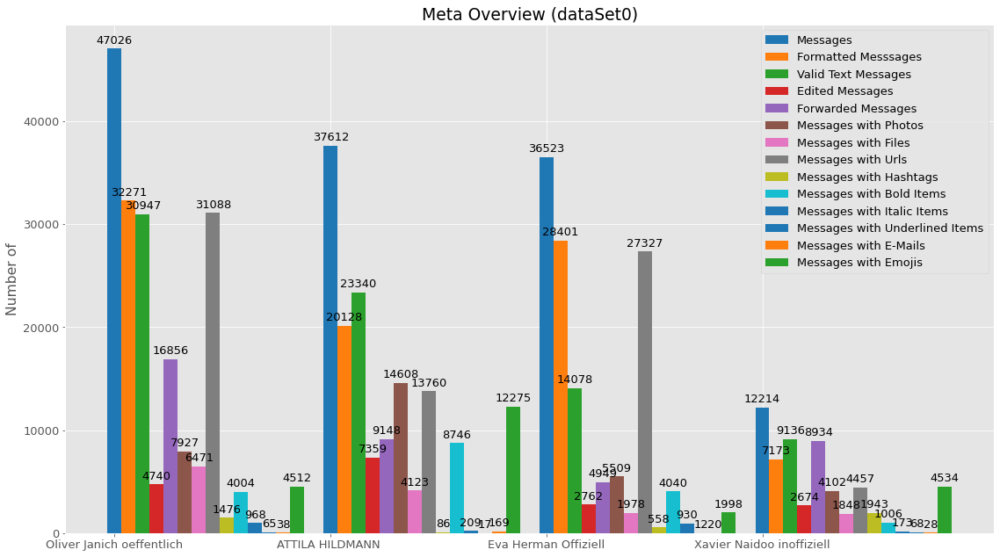

In [54]:
queryMetaPlotter(
    inputDescFilter = "dataSet0",
    configPlotWidth = 16,
    configPlotHeight = 9,
    configBarWidth = 0.065,
    outputFilename = "meta-overview-dataSet0.svg"
)

- Plot DataSet1

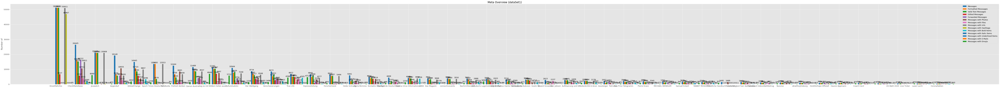

In [55]:
if("dataSet1" in C_LOAD_DATASETS):
    queryMetaPlotter(
        inputDescFilter = "dataSet1",
        configPlotWidth = 100,
        configPlotHeight = 9,
        configBarWidth = 0.065,
        outputFilename = "meta-overview-dataSet1.svg"
    )

- Plot DataSet1a

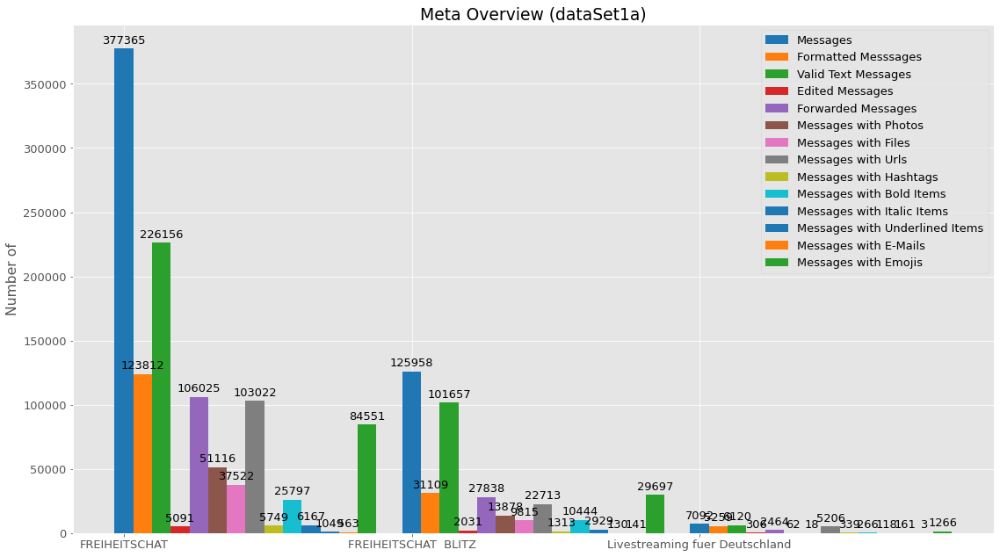

In [56]:
if("dataSet1a" in C_LOAD_DATASETS):
    queryMetaPlotter(
        inputDescFilter = "dataSet1a",
        configPlotWidth = 16,
        configPlotHeight = 9,
        configBarWidth = 0.065,
        outputFilename = "meta-overview-dataSet1a.svg"
    )

- Plot DataSet2

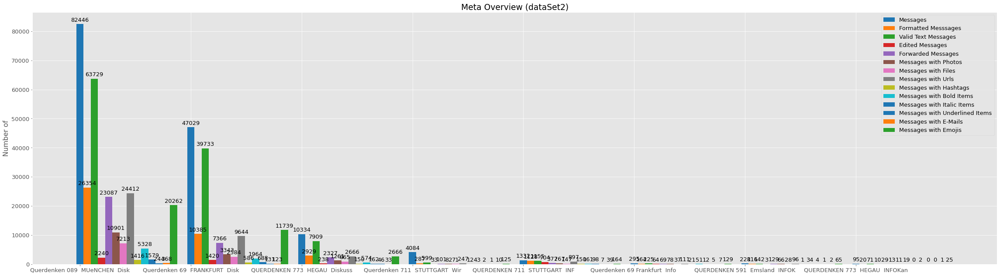

In [57]:
if("dataSet2" in C_LOAD_DATASETS):
    queryMetaPlotter(
        inputDescFilter = "dataSet2",
        configPlotWidth = 32,
        configPlotHeight = 9,
        configBarWidth = 0.065,
        outputFilename = "meta-overview-dataSet2.svg"
    )

### Social Graphs (Abbildung auf Features)

#### Abweichungen von Chattitel und Nutzernamen

Verschiedene Attribute

In [58]:
def compareIdsAndLabels(df):

    gloStartStopwatch("Compare ids and labels")

    dictFromTranslator  = {}
    dictActorTranslator = {}

    df = df.copy()
    df["date"] = pd.to_datetime(df["date"])
    
    df = df.set_index("date")
    df = df.sort_index()
    
    addFromCounter      = 0
    changedFromCounter  = 0
    
    addActorCounter     = 0
    changedActorCounter = 0

    for index, row in df.iterrows():
        
        n_from      = row["from"]
        n_from_id   = row["from_id"]

        n_from = str(n_from)
        n_from_id = str(n_from_id)

        n_actor      = row["actor"]
        n_actor_id   = row["actor_id"]

        n_actor = str(n_actor)
        n_actor_id = str(n_actor_id)

        if(str(n_from) != "nan"):
            if(n_from_id not in dictFromTranslator):
                # Add new key
                dictFromTranslator[n_from_id] = [n_from]
                addFromCounter = addFromCounter + 1
            else:
                # Has changed?
                oValueL = dictFromTranslator[n_from_id]
                if(n_from not in oValueL):
                    newList = oValueL.copy()
                    newList.append(n_from)
                    print("- Add changed attribute in from (prev=" + str(oValueL) + "/new=" + str(newList) + ")")
                    changedFromCounter = changedFromCounter + 1
                    dictFromTranslator[n_from_id] = newList

        if(str(n_actor) != "nan"):
            if(n_actor_id not in dictActorTranslator):
                # Add new key
                dictActorTranslator[n_actor_id] = [n_actor]
                addActorCounter = addActorCounter + 1
            else:
                # Has changed?
                oValueL = dictActorTranslator[n_actor_id]
                if(n_actor not in oValueL):
                    newList = oValueL.copy()
                    newList.append(n_actor)
                    print("- Add changed attribute in actor (prev=" + str(oValueL) + "/new=" + str(newList) + ")")
                    changedActorCounter = changedActorCounter + 1
                    dictActorTranslator[n_actor_id] = newList

    gloStopStopwatch("Compare ids and labels")
    
    print()
    print("addFromCounter:\t\t" + str(addFromCounter))
    print("changedFromCounter:\t" + str(changedFromCounter))
    
    print()
    print("addActorCounter:\t" + str(addActorCounter))
    print("changedActorCounter:\t" + str(changedFromCounter))
    
    print()
    if(addFromCounter != 0):
        print("fromFails Percent:\t" + str((changedFromCounter/addFromCounter)* 100) + "%")
            
    if(addActorCounter != 0):
        print("actorFails Percent:\t" + str((changedActorCounter/addActorCounter)* 100) + "%")

    return dictFromTranslator

In [59]:
if(C_SHORT_RUN == False):
    compareIdsAndLabels(dfAllDataMessages)

[Stopwatch started >>Compare ids and labels<<]

- Add changed attribute in actor (prev=['Victor Schurk']/new=['Victor Schurk', 'Heinrich Gruber'])

- Add changed attribute in actor (prev=['None']/new=['None', 'Lene Pepp'])

- Add changed attribute in actor (prev=['💔kid']/new=['💔kid', '🛸'])

- Add changed attribute in actor (prev=['Susanne Kaußen']/new=['Susanne Kaußen', 'Susanne'])

- Add changed attribute in actor (prev=['@Rizi']/new=['@Rizi', '@Fretchen'])

- Add changed attribute in from (prev=['Dea51 https://fotofeier.eu']/new=['Dea51 https://fotofeier.eu', 'Dea51 https://t.me/gruppekoelnstehtauf'])

- Add changed attribute in from (prev=['I_wear_Bommel']/new=['I_wear_Bommel', 'Bommel089'])

- Add changed attribute in actor (prev=['VEGANNE']/new=['VEGANNE', 'Anne Bringmann'])

- Add changed attribute in from (prev=['Doris Schneider']/new=['Doris Schneider', 'Doris'])

- Add changed attribute in from (prev=['@onlinedschungelbuch']/new=['@onlinedschungelbuch', '@hakunamatata'])

- Add changed attribute in actor (prev=["Andre von Siegfried (Yor de'u Pan)"]/new=["Andre von Siegfried (Yor de'u Pan)", "Yor de'u Pan (Andre von Siegfried)"])

- Add changed attribute in from (prev=['D D']/new=['D D', 'Daniel'])

- Add changed attribute in from (prev=['Der Thüringer👌💥💥🚨🚨🚨']/new=['Der Thüringer👌💥💥🚨🚨🚨', 'Der Thüringer👌'])

- Add changed attribute in from (prev=['Wunder']/new=['Wunder', 'Truth'])

- Add changed attribute in from (prev=['Manu']/new=['Manu', 'M@nu G.'])

- Add changed attribute in from (prev=['su k.']/new=['su k.', 'sudjava k.'])

- Add changed attribute in from (prev=['Millli D']/new=['Millli D', 'Hanne D'])

- Add changed attribute in from (prev=['Gabi']/new=['Gabi', 'Mexxle'])

- Add changed attribute in from (prev=['Andreas Tatsch 🖤🤍❤️']/new=['Andreas Tatsch 🖤🤍❤️', 'Andreas T 🖤🤍❤️'])

- Add changed attribute in from (prev=['O. K.']/new=['O. K.', 'Kapsalaki'])

- Add changed attribute in from (prev=['Jane Doe']/new=['Jane Doe', '404 Network unavailable'])

- Add changed attribute in from (prev=['Ronny Shakiro']/new=['Ronny Shakiro', 'Manfred'])

- Add changed attribute in from (prev=['Annie 83✌️']/new=['Annie 83✌️', 'Annie 81✌️'])

- Add changed attribute in from (prev=['Sascha Kutsch']/new=['Sascha Kutsch', 'JSK'])

- Add changed attribute in from (prev=['Andi']/new=['Andi', 'AW'])

- Add changed attribute in from (prev=['Timm']/new=['Timm', 'Tim'])

- Add changed attribute in from (prev=['Westfront36']/new=['Westfront36', 'M. R.'])

- Add changed attribute in from (prev=["Ronny's Popshow 🐒"]/new=["Ronny's Popshow 🐒", 'Hirsenronsen'])

- Add changed attribute in from (prev=['Der Eventmanager']/new=['Der Eventmanager', 'Henker der Lumpen'])

- Add changed attribute in from (prev=['MARKUS SÖDER']/new=['MARKUS SÖDER', 'BATMAN'])

- Add changed attribute in from (prev=['Kamil A.']/new=['Kamil A.', 'None'])

- Add changed attribute in from (prev=['Gisela']/new=['Gisela', 'Apfelsaft Naturtrüb'])

- Add changed attribute in from (prev=['Markkus']/new=['Markkus', 'Markus'])

- Add changed attribute in from (prev=['Andreas Werner']/new=['Andreas Werner', 'Andrea S'])

- Add changed attribute in from (prev=['Victor Schurk']/new=['Victor Schurk', 'Heinrich Gruber'])

- Add changed attribute in from (prev=['ME Night']/new=['ME Night', 'Dario Zaza'])

- Add changed attribute in from (prev=['RJ']/new=['RJ', 'Rosa'])

[Stopwatch stopped >>Compare ids and labels<< (149.752s)]

addFromCounter:		35689

changedFromCounter:	30

addActorCounter:	48990

changedActorCounter:	30

fromFails Percent:	0.08405951413600829%

actorFails Percent:	0.014288630332720962%

#### Extrahieren von Features und dynamisches Auflösen

##### Formatierungs-spezifischen statischen Features

In [60]:
def extractImportantHashtags(df):
    dfMessages = df.copy()
    dfMessages = dfMessages[dfMessages.ftQrCoHashtags == True]

    hashTagList = list()
    for index, row in dfMessages.iterrows():
        for hashtagItem in row["ftTdHashtags"]:
            hashTagList.append(hashtagItem)

    return hashTagList

In [61]:
# return combinations
def extractImportantEmojis(df):

    dfMessages = df.copy()
    dfMessages = dfMessages[dfMessages.ftQrCoEmojis == True]

    li = dfMessages.ftTdEmojisDesc.values.tolist()

    retLi = list()

    for l in li:
        aString = ""
        for e in l:
            aString = aString + ":" + e 
        retLi.append(aString)

    return retLi

##### Nutzer-spezifischen statischen Features

(hier nicht beschrieben, siehe unten)

##### Dynamische Features

In [62]:
# param flagResolveNewUrls  Flag (see config above)

def resolveUrl(completeUrl, flagResolveNewUrls):
    
    if "bit.ly" in completeUrl:

        if(gloCheckIsAlreadyCached("resolved-urls.csv", completeUrl)):
            return gloGetCached("resolved-urls.csv", completeUrl)
        else:

            if(flagResolveNewUrls == False):
                return completeUrl

            print("(Resolve now >>" + completeUrl + "<<)")
            try:
                r = requests.get(completeUrl, timeout = 5)
                u = r.url
                gloAddToCache("resolved-urls.csv", completeUrl, u)
                return u
            except:
                print("(- Warn: Can not resolve (return completeUrl))")
                return completeUrl

    else:
        return completeUrl

In [63]:
# Return
# a = urlList,
# b = refList
# c = hostList
def extractImportantUrls(df):
    dfMessages = df.copy()
    dfMessages = dfMessages[dfMessages.ftQrCoUrls == True]

    hostList        = list()
    urList          = list()
    refList         = list()

    counterSucHostname = 0
    counterErrHostname = 0

    for index, row in dfMessages.iterrows():
        for urlItem in row["ftTdUrls"]:
            
            urlData = urlparse(str(urlItem))

            completeUrl      = urlData.geturl()

            rUrl     = resolveUrl(completeUrl, flagResolveNewUrls=C_RESOLVE_NEW_URLS)
            rUrlData = urlparse(rUrl)
            rCompleteUrl = rUrlData.geturl()
            rCompleteHostname = rUrlData.hostname

            if(str(rCompleteHostname) != "None"):
                counterSucHostname = counterSucHostname + 1

                hostList.append(str(rCompleteHostname))

                urList.append(str(rCompleteUrl))

                if "t.me" in str(rCompleteHostname):
                    refList.append(str(rCompleteUrl))
            else:
                counterErrHostname = counterErrHostname + 1

    print("Got Hostnames (suc=" + str(counterSucHostname) + "/err=" + str(counterErrHostname) + ")")

    return (urList, refList, hostList)

In [64]:
# param flagResolveNewUrls  Flag (see config above)
def resolveImportantYoutubeVideos(urlList, flagResolveNewUrls):

    # Thanks https://gist.github.com/rodrigoborgesdeoliveira/987683cfbfcc8d800192da1e73adc486

    ytList = list()

    for url in urlList:

        url = str(url)

        if("youtube.com" in url or "youtu.be" in url or "youtube-nocookie.com" in url):
            if(gloCheckIsAlreadyCached("resolved-youtube.csv", url)):
                ytList.append(gloGetCached("resolved-youtube.csv", url)) 
            else:

                if(flagResolveNewUrls == False):
                    print("(Disable resolve new youtube urls (return completeUrl) >>" + url + "<<)")
                    ytList.append(url)
                else:
                    print("Resolve now youtube >>" + url + "<<")
                    try:
                        r = requests.get(url, timeout = 5)
                        t = fromstring(r.content)
                        a = str(t.findtext('.//title'))
                        ytList.append(a)
                        gloAddToCache("resolved-youtube.csv", url, a)
                    except:
                        print("(- Warn: Can not resolve youtube url (return completeUrl))")
                        ytList.append(url)

    return ytList

##### Implementierung

In [65]:
# TODO: Bug: No Hostname detected if string startsWith ! "http" in urlparse
# TODO: Check: Refs ins both directions

# Returns
# a = Counter forwardedFromList
# b = Counter refList
# c = Counter hashtagList
# d = Counter hostList
# e = Counter emojiList
# f = Counter fromList
def extractSocialGraph(filePath, debugPrint, debugPrintCount):

    dfMessages = dictMessages[filePath].copy()

    hashtagList = extractImportantHashtags(dfMessages)
    emojiList = extractImportantEmojis(dfMessages)

    urlList, refList, hostList = extractImportantUrls(dfMessages)

    ytList = resolveImportantYoutubeVideos(urlList, flagResolveNewUrls = C_RESOLVE_NEW_URLS)
            
    forwardedFromList = list()
    if("forwarded_from" in dfMessages.columns):
        df = dfMessages.copy()
        df = df[df.ftQrIsForwarded == True]
    
        for index, row in df.iterrows():        
            forwardedFromList.append(str(row["forwarded_from"]))
            
    actorList = list()
    if("actor" in dfMessages.columns):
        for index, row in dfMessages.iterrows():
            actorList.append(str(row["actor"]))
    
    memberList = list()
    if("members" in dfMessages.columns):
        for index, row in dfMessages.iterrows():
            if(str(row["members"]) != "nan"):
                for memberItem in row["members"]:
                    memberList.append(str(memberItem))
                    
    fromList = list()
    if("from" in dfMessages.columns):
        for index, row in dfMessages.iterrows():
            s = str(row["from"])
            s = gloConvertToSafeString(s)
            if(s != "None"):
                fromList.append(s)
            
    savedFromList = list()
    if("saved_from" in dfMessages.columns):
        for index, row in dfMessages.iterrows():
            savedFromList.append(str(row["saved_from"]))

    configTopN = debugPrintCount

    if(debugPrint):

        print()
        print("Set top n to " + str(debugPrintCount))
        print()

        print("- Top Hosts (resovled) -")
        print ("\n".join(map(str, Counter(hostList).most_common(configTopN))))
        print()
        print("- Top URLs (resolved) -")
        print ("\n".join(map(str, Counter(urlList).most_common(configTopN))))
        print()
        print("- Top Refs from text (resolved) -")
        print ("\n".join(map(str, Counter(refList).most_common(configTopN))))
        print()
        print("- Top Refs (forwarded_from) -")
        print ("\n".join(map(str, Counter(forwardedFromList).most_common(configTopN))))
        print()
        print("- Top Refs (actor) -")
        print ("\n".join(map(str, Counter(actorList).most_common(configTopN))))
        print()
        print("- Top Refs (members) -")
        print ("\n".join(map(str, Counter(memberList).most_common(configTopN))))
        print()
        print("- Top Refs (from) -")
        print ("\n".join(map(str, Counter(fromList).most_common(configTopN))))
        print()
        print("- Top Refs (saved_from) -")
        print ("\n".join(map(str, Counter(savedFromList).most_common(configTopN))))
        print()
        print("- Top hashtags -")
        print ("\n".join(map(str, Counter(hashtagList).most_common(configTopN))))
        print()
        print("- Top emojis -")
        print ("\n".join(map(str, Counter(emojiList).most_common(configTopN))))
        print()
        print("- Top yt (resolved) -")
        print ("\n".join(map(str, Counter(ytList).most_common(configTopN))))
        print()
    
    return (Counter(forwardedFromList), Counter(refList), Counter(hashtagList),  Counter(hostList), Counter(emojiList), Counter(fromList))

In [66]:
dictSGD_ForwardedFrom = {}
dictSGD_Ref           = {}
dictSGD_Hashtag       = {}
dictSGD_Host          = {}
dictSGD_Emoji         = {}
dictSGD_From          = {}

gloStartStopwatch("Extract Social Graph Data")

for fP in dfInputFiles.inputPath:

    gloStartStopwatch("Extract Social Graph Data >>" + fP + "<<")

    a, b, c, d, e, f = extractSocialGraph(fP, debugPrint=False, debugPrintCount = 0)

    dictSGD_ForwardedFrom[fP]   = a
    dictSGD_Ref[fP]             = b
    dictSGD_Hashtag[fP]         = c
    dictSGD_Host[fP]            = d
    dictSGD_Emoji[fP]           = e
    dictSGD_From[fP]            = f

    gloStopStopwatch("Extract Social Graph Data >>" + fP + "<<")

gloStopStopwatch("Extract Social Graph Data")

[Stopwatch started >>Extract Social Graph Data<<]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<<<]

Got Hostnames (suc=14657/err=1129)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<<< (19.619s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021/ChatExport_2021-01-05-janich<<<<]

Got Hostnames (suc=36481/err=940)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021/ChatExport_2021-01-05-janich<<<< (24.270s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<<<]

Got Hostnames (suc=27906/err=484)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<<< (17.719s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<<<]

Got Hostnames (suc=5455/err=645)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<<< (7.498s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-gerechtigkeitVaterland<<<<]

Got Hostnames (suc=262/err=20)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-gerechtigkeitVaterland<<<< (0.675s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-aktuelleKarikaturen<<<<]

Got Hostnames (suc=4954/err=1340)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-aktuelleKarikaturen<<<< (2.091s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-drHeinrichFiechtnerInfo<<<<]

Got Hostnames (suc=425/err=40)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-drHeinrichFiechtnerInfo<<<< (0.373s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-michaelWendler<<<<]

Got Hostnames (suc=1203/err=155)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-michaelWendler<<<< (0.937s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-laserLurch<<<<]

Got Hostnames (suc=256/err=105)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-laserLurch<<<< (0.197s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-dawidSnowden<<<<]

Got Hostnames (suc=477/err=20)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-dawidSnowden<<<< (0.897s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-kenJebsen<<<<]

Got Hostnames (suc=429/err=2081)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-kenJebsen<<<< (1.458s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-nachrichtenWelt<<<<]

Got Hostnames (suc=3239/err=106)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-nachrichtenWelt<<<< (1.734s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-qAnonAussteiger<<<<]

Got Hostnames (suc=762/err=59)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-qAnonAussteiger<<<< (1.494s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-whatTheyHide<<<<]

Got Hostnames (suc=701/err=79)

(Disable resolve new youtube urls (return completeUrl) >>https://files.whattheyhide.org/Videos/instagram-ukvali-official-telegram-ukvali-youtube-https-youtu.be-scpefvlq3ew.mp4?tgshare<<)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-whatTheyHide<<<< (0.488s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-kulturStudio<<<<]

Got Hostnames (suc=9032/err=593)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-kulturStudio<<<< (5.271s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-jouwatch<<<<]

Got Hostnames (suc=20909/err=24)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-jouwatch<<<< (9.043s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-derWaldgang<<<<]

Got Hostnames (suc=8536/err=243)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-derWaldgang<<<< (4.148s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-einzelfallInfos<<<<]

Got Hostnames (suc=51738/err=19)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-einzelfallInfos<<<< (29.079s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-qLobalChange<<<<]

Got Hostnames (suc=12765/err=1462)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-qLobalChange<<<< (7.904s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-expressZeitung<<<<]

Got Hostnames (suc=5551/err=514)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-expressZeitung<<<< (2.913s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-1984DasMagazin<<<<]

Got Hostnames (suc=3598/err=33)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-1984DasMagazin<<<< (2.143s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-forscherGeist<<<<]

Got Hostnames (suc=5714/err=106)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-forscherGeist<<<< (3.145s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-schubertsLagemeldung<<<<]

Got Hostnames (suc=3634/err=27)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-schubertsLagemeldung<<<< (2.333s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-coronaFakten<<<<]

Got Hostnames (suc=1198/err=17)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-coronaFakten<<<< (0.206s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-coronaVirusInfo<<<<]

Got Hostnames (suc=6680/err=37)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-coronaVirusInfo<<<< (2.179s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-epochTimesDeutschland<<<<]

Got Hostnames (suc=31136/err=767)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-epochTimesDeutschland<<<< (7.048s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-translatedVideosWahlbetrug<<<<]

Got Hostnames (suc=1515/err=38)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-translatedVideosWahlbetrug<<<< (0.653s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-checkMateNews<<<<]

Got Hostnames (suc=24355/err=2897)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-checkMateNews<<<< (13.290s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-markusHaintz<<<<]

Got Hostnames (suc=2283/err=168)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-markusHaintz<<<< (2.041s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-connectivEvents<<<<]

Got Hostnames (suc=4414/err=91)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-connectivEvents<<<< (1.863s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-pierreKranz<<<<]

Got Hostnames (suc=1591/err=32)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-pierreKranz<<<< (0.907s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-heikoSchrang<<<<]

Got Hostnames (suc=1916/err=229)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-heikoSchrang<<<< (2.083s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-usWahl2020LiveTicker<<<<]

Got Hostnames (suc=45/err=2)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-usWahl2020LiveTicker<<<< (0.255s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-trueLife<<<<]

Got Hostnames (suc=1919/err=85)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-trueLife<<<< (2.534s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-samuelEckert<<<<]

Got Hostnames (suc=1902/err=253)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-samuelEckert<<<< (0.772s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-medienKritik<<<<]

Got Hostnames (suc=3531/err=203)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-medienKritik<<<< (1.056s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-rabbitResearch<<<<]

Got Hostnames (suc=1757/err=907)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-rabbitResearch<<<< (0.809s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-nuoviso<<<<]

Got Hostnames (suc=2263/err=12)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-nuoviso<<<< (0.579s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-haunsiAppmann<<<<]

Got Hostnames (suc=877/err=31)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-haunsiAppmann<<<< (0.427s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-friedlicheHandtuchRevolution<<<<]

Got Hostnames (suc=0/err=0)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-friedlicheHandtuchRevolution<<<< (0.593s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-sagEsMitBildern<<<<]

Got Hostnames (suc=2391/err=359)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-sagEsMitBildern<<<< (7.184s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-augenAuf<<<<]

Got Hostnames (suc=7111/err=637)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-augenAuf<<<< (7.044s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-verschwoerungen<<<<]

Got Hostnames (suc=3030/err=430)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-verschwoerungen<<<< (4.011s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-flacheErdeDeutschland<<<<]

Got Hostnames (suc=767/err=50)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-flacheErdeDeutschland<<<< (1.783s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-fufMedia<<<<]

Got Hostnames (suc=1822/err=5469)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-fufMedia<<<< (6.032s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-coachCecil<<<<]

Got Hostnames (suc=745/err=2)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-coachCecil<<<< (0.320s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-qanonAustria<<<<]

Got Hostnames (suc=13281/err=3302)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-qanonAustria<<<< (5.941s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-honkForHope<<<<]

Got Hostnames (suc=2130/err=130)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-honkForHope<<<< (0.607s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-dasPrinzTelegram<<<<]

Got Hostnames (suc=2507/err=73)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-dasPrinzTelegram<<<< (1.049s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-demoTermine<<<<]

Got Hostnames (suc=4655/err=219)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-demoTermine<<<< (4.772s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-freiheitsChat<<<<]

Got Hostnames (suc=117619/err=21969)

(Disable resolve new youtube urls (return completeUrl) >>https://www.videoder.net/media?mode=2&url=https://www.youtube.com/watch?v=7XzLbGssArQ<<)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-freiheitsChat<<<< (232.361s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-freiheitsChatBlitz<<<<]

Got Hostnames (suc=24428/err=6007)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-freiheitsChatBlitz<<<< (74.898s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-liveFuerDeOsSc<<<<]

Got Hostnames (suc=7011/err=305)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-liveFuerDeOsSc<<<< (4.120s)]

[Stopwatch started >>Extract Social Graph Data >>DS-13-01-2021/ChatExport_2021-01-13-querdenken089<<<<]

Got Hostnames (suc=28440/err=6232)

[Stopwatch stopped >>Extract Social Graph Data >>DS-13-01-2021/ChatExport_2021-01-13-querdenken089<<<< (50.015s)]

[Stopwatch started >>Extract Social Graph Data >>DS-13-01-2021/ChatExport_2021-01-13-querdenken591Info<<<<]

Got Hostnames (suc=109/err=11)

[Stopwatch stopped >>Extract Social Graph Data >>DS-13-01-2021/ChatExport_2021-01-13-querdenken591Info<<<< (0.138s)]

[Stopwatch started >>Extract Social Graph Data >>DS-13-01-2021/ChatExport_2021-01-13-querdenken773<<<<]

Got Hostnames (suc=3021/err=607)

[Stopwatch stopped >>Extract Social Graph Data >>DS-13-01-2021/ChatExport_2021-01-13-querdenken773<<<< (5.143s)]

[Stopwatch started >>Extract Social Graph Data >>DS-13-01-2021/ChatExport_2021-01-13-querdenken773Info<<<<]

Got Hostnames (suc=27/err=4)

[Stopwatch stopped >>Extract Social Graph Data >>DS-13-01-2021/ChatExport_2021-01-13-querdenken773Info<<<< (0.057s)]

[Stopwatch started >>Extract Social Graph Data >>DS-13-01-2021/ChatExport_2021-01-13-querdenken711<<<<]

Got Hostnames (suc=282/err=23)

[Stopwatch stopped >>Extract Social Graph Data >>DS-13-01-2021/ChatExport_2021-01-13-querdenken711<<<< (1.535s)]

[Stopwatch started >>Extract Social Graph Data >>DS-13-01-2021/ChatExport_2021-01-13-querdenken711Info<<<<]

Got Hostnames (suc=1378/err=58)

[Stopwatch stopped >>Extract Social Graph Data >>DS-13-01-2021/ChatExport_2021-01-13-querdenken711Info<<<< (0.921s)]

[Stopwatch started >>Extract Social Graph Data >>DS-13-01-2021/ChatExport_2021-01-13-querdenken69<<<<]

Got Hostnames (suc=10190/err=2959)

[Stopwatch stopped >>Extract Social Graph Data >>DS-13-01-2021/ChatExport_2021-01-13-querdenken69<<<< (26.700s)]

[Stopwatch started >>Extract Social Graph Data >>DS-13-01-2021/ChatExport_2021-01-13-querdenken69Info<<<<]

Got Hostnames (suc=126/err=27)

[Stopwatch stopped >>Extract Social Graph Data >>DS-13-01-2021/ChatExport_2021-01-13-querdenken69Info<<<< (0.162s)]

[Stopwatch stopped >>Extract Social Graph Data<< (617.668s)]

#### Top-n Darstellung

In [67]:
def printSocialGraphDebug(filePathList):
    for fP in filePathList:
        print("Analyse now >>" + fP + "<<")
        _ = extractSocialGraph(fP, debugPrint=True, debugPrintCount=10)

In [68]:
if(C_SHORT_RUN == False):
    printSocialGraphDebug(dfInputFiles[dfInputFiles.inputLabel == "dataSet0"].inputPath)

Analyse now >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<

Got Hostnames (suc=14657/err=1129)

Set top n to 10

- Top Hosts (resovled) -

('youtu.be', 3668)
('t.me', 1523)
('www.youtube.com', 705)
('www.bitchute.com', 364)
('www.n-tv.de', 321)
('www.attilahildmann.de', 265)
('www.welt.de', 229)
('www.spiegel.de', 226)
('demos.whattheyhide.org', 203)
('amzn.to', 174)

- Top URLs (resolved) -

('https://www.attilahildmann.de/de/shop/alle.html?pc=SAMURAI', 163)
('https://demo.terminkalender.top/pc.php', 116)
('https://www.youtube.com/watch', 108)
('https://t.me/FREIHEITS_CHAT_BL', 95)
('https://youtu.be/kWpzfqW34lA', 72)
('https://www.bitchute.com/video/5izjzGo5AyBw/', 70)
('https://t.me/FREIHEITSCHAT2020', 67)
('https://t.me/FreiheitsChatDE', 65)
('https://demos.whattheyhide.org/add', 49)
('https://t.me/ATTILAHILDMANN', 41)

- Top Refs from text (resolved) -

('https://t.me/FREIHEITS_CHAT_BL', 95)
('https://t.me/FREIHEITSCHAT2020', 67)
('https://t.me/FreiheitsChatDE', 65)
('https://t.me/ATTILAHILDMANN', 41)
('https://t.me/ChatDerFreiheit', 39)
('https://t.me/gerechtigkeitfuersvaterland', 37)
('https://t.me/MICHAELWENDLEROFFICIAL', 34)
('https://t.me/DEMOKRATENCHAT', 32)
('https://t.me/joinchat/QkdDr0M7iThEkCRt_KhBpw', 32)
('https://t.me/DAUMENRUNTERBLITZKRIEG', 31)

- Top Refs (forwarded_from) -

('ATTILA HILDMANN ⚫️⚪️🔴⚔️', 7448)
('Gerechtigkeit für das Vaterland', 616)
('Aktuelle Karikaturen - Götz Wiedenroth - Illustrationen, Cartoons', 44)
('𝕯𝖗. 𝕳𝖊𝖎𝖓𝖗𝖎𝖈𝖍 𝕱𝖎𝖊𝖈𝖍𝖙𝖓𝖊𝖗 𝕴𝖓𝖋𝖔𝖐𝖆𝖓𝖆𝖑', 41)
('Anonymous Germany', 38)
('MICHAEL WENDLER 🚨', 34)
('Oliver Janich öffentlich', 33)
('Laser Lurch', 28)
('Dawid Snowden', 28)
('Ken Jebsen - Aufklärung und Information', 26)

- Top Refs (actor) -

('nan', 37592)
('ATTILA HILDMANN ⚫️⚪️🔴⚔️', 20)

- Top Refs (members) -

- Top Refs (from) -

('ATTILA HILDMANN ', 37592)
('nan', 20)

- Top Refs (saved_from) -

- Top hashtags -

('Kontakt', 14)
('AHMEMO', 9)
('Antifa', 9)
('Attila', 9)
('Hildmann', 9)
('Demonstration', 9)
('Leipzig1912', 9)
('netzfund', 3)
('Netzfund', 3)
('WIRMACHENAUF', 3)

- Top emojis -

(':wolf', 1605)
(':play button', 693)
(':cross mark', 573)
(':eagle', 259)
(':grinning squinting face', 250)
(':grinning squinting face:grinning squinting face:grinning squinting face', 212)
(':cross mark:wolf:crossed swords', 180)
(':red exclamation mark:red exclamation mark:wolf', 171)
(':crossed swords', 151)
(':green heart', 125)

- Top yt (resolved) -

(' - YouTube', 1394)
('YouTube', 108)
('Prof. Stefan Hockertz warnt vor millionenfach vorsÃ¤tzlicher KÃ¶rperverletzung | VÃ\x96: 17.07.2020 - YouTube', 73)
('Tod im Labor - Warum Tierversuche sinnlos sind - YouTube', 25)
('Attila Hildmann redet wie Adolf Hitler - YouTube', 22)
('DER PERFIDE PLAN DES WORLD ECONOMIC FORUM - YouTube', 21)
('Der Glaube an die groÃ\x9fe VerschwÃ¶rung: Was steckt dahinter? | stern TV - YouTube', 21)
('UPDATE mRNA-Impfung: Wo sind die validen Studien? | VÃ\x96: 28.11.2020 - YouTube', 18)
('INFERNO Exklusiv Trailer German Deutsch (2016) - YouTube', 16)
('GATES STATE - Inoffizieller Trailer 2020 - YouTube', 15)

Analyse now >>DS-05-01-2021/ChatExport_2021-01-05-janich<<

Got Hostnames (suc=36481/err=940)

Set top n to 10

- Top Hosts (resovled) -

('twitter.com', 2777)
('www.youtube.com', 2768)
('youtu.be', 2018)
('t.me', 1809)
('www.journalistenwatch.com', 1672)
('www.bild.de', 1336)
('www.welt.de', 1132)
('www.focus.de', 1080)
('www.epochtimes.de', 933)
('t.co', 865)

- Top URLs (resolved) -

('https://t.me/SchubertsLM', 152)
('https://t.me/Corona_Fakten', 144)
('https://t.me/coronainformationskanal', 118)
('http://paypal.me/coronafaktenoriginal', 79)
('https://t.me/Corona_Fakten/242', 65)
('https://www.bitchute.com/channel/pIFLS0LFMHHm/', 47)
('http://www.expresszeitung.com/?atid=58', 41)
('https://lbry.tv/@KulturstudioTV', 40)
('https://shop.expresszeitung.com/shop/shop/alle-ausgaben/ausgabe_33.html?atid=58', 24)
('https://t.me/epochtimesde', 22)

- Top Refs from text (resolved) -

('https://t.me/SchubertsLM', 152)
('https://t.me/Corona_Fakten', 144)
('https://t.me/coronainformationskanal', 118)
('https://t.me/Corona_Fakten/242', 65)
('https://t.me/epochtimesde', 22)
('https://t.me/TranslatedVideos', 21)
('https://t.me/CheckMateNews', 20)
('https://t.me/Haintz', 17)
('https://t.me/ConnectivEvents', 15)
('https://t.me/Kulturstudio', 15)

- Top Refs (forwarded_from) -

('Kulturstudio.tv', 1211)
('Jouwatch', 1140)
('Eva Herman Offiziell', 974)
('Der Waldgang', 786)
('Einzelfallinfos', 759)
('Qlobal-Change 🇩🇪🇦🇹🇨🇭🇱🇮', 661)
('ExpressZeitung', 635)
('1984 - Das Magazin', 577)
('Oliver Janich Premium', 554)
("'ForscherGeist'", 421)

- Top Refs (actor) -

('nan', 46901)
('Oliver Janich öffentlich', 125)

- Top Refs (members) -

- Top Refs (from) -

('Oliver Janich oeffentlich', 46901)
('nan', 125)

- Top Refs (saved_from) -

- Top hashtags -

('StopLeftDystopia', 108)
('Berlin', 42)
('links', 42)
('Messer', 35)
('Einreise', 32)
('Kosten', 32)
('Justiz', 32)
('Netzfund', 31)
('CoronaKrise', 21)
('Orwell', 19)

- Top emojis -

(':play button', 307)
(':smiling face with sunglasses', 266)
(':beaming face with smiling eyes', 158)
(':right arrow', 153)
(':play button:speech balloon', 129)
(':double exclamation mark:double exclamation mark', 113)
(':face with tears of joy', 84)
(':double exclamation mark', 74)
(':open book', 72)
(':double exclamation mark:double exclamation mark:double exclamation mark', 70)

- Top yt (resolved) -

(' - YouTube', 1894)
('MissverstÃ¤ndnisse zum Klimawandel aufgeklÃ¤rt | Harald Lesch - YouTube', 41)
('Spieltheorie des Lebens | TragÃ¶die des Gemeinguts - YouTube', 14)
('Ist der Klimawandel nicht mehr aufzuhalten? - YouTube', 13)
('None', 12)
('Pupse riechen ist gesund | Schlagzeilen wissenschaftlich gepruÌ\x88ft - YouTube', 10)
('Oliver Janich Vs TJump | Are the Numbers Exaggerated? - YouTube', 10)
('YouTubeTV Reportage: YouTuber wird zum Meerschweinchen! ð\x9f\x90¹ - YouTube', 9)
('Warum auch Tiere den Spieltrieb haben | Quarks - YouTube', 8)
('Klimawandel: Das ist jetzt zu tun! (feat. Rezo) - YouTube', 8)

Analyse now >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<

Got Hostnames (suc=27906/err=484)

Set top n to 10

- Top Hosts (resovled) -

('www.youtube.com', 2928)
('www.kopp-verlag.de', 2415)
('www.welt.de', 2173)
('www.epochtimes.de', 1477)
('www.tichyseinblick.de', 1255)
('www.journalistenwatch.com', 1128)
('www.focus.de', 1058)
('www.faz.net', 1027)
('de.sputniknews.com', 950)
('deutsch.rt.com', 895)

- Top URLs (resolved) -

('https://www.kopp-verlag.de/Im-Lichte-der-Wahrheit.htm?websale8=kopp-verlag&pi=B4588822&ci=%24_AddOn_%24&&6=8485245', 102)
('https://amzn.to/2VR6Evg', 77)
('https://www.kopp-verlag.de/a/corona-fehlalarm--3?d=1&&6=8991273', 42)
('https://c.kopp-verlag.de/kopp,verlag_4.html?1=58&3=0&4=&5=&d=https%3A%2F%2Fwww.kopp-verlag.de%2FIm-Lichte-der-Wahrheit.htm%3Fwebsale8%3Dkopp-verlag%26pi%3DB4588822%26ci%3D%2524_AddOn_%2524', 41)
('https://amzn.to/2DhBRzx', 40)
('https://www.kopp-verlag.de/Die-Psychotherapie-der-Hildegard-von-Bingen.htm?websale8=kopp-verlag&pi=A1111467&ci=%24_AddOn_%24&&6=9097013', 38)
('https://www.kopp-verlag.de/a/bedrohung-blackout?&6=9754689', 37)
('https://www.kopp-verlag.de/a/was-ist-hildegard-medizin-?&6=10191515', 32)
('https://www.kopp-verlag.de/a/perfekte-krisenvorsorge?&6=9280658', 31)
('https://www.amazon.de/gp/product/1999021533/ref=as_li_tl?ie=UTF8&camp=1638&creative=6742&creativeASIN=1999021533&linkCode=as2&tag=innovativ6000-21&linkId=9f89b3287edf0eaf07ecc82d7200

- Top Refs from text (resolved) -

('https://t.me/TranslatedVideos', 27)
('https://t.me/epochtimesde', 18)
('https://t.me/coronainformationskanal', 13)
('https://t.me/Corona_Fakten', 9)
('https://t.me/CheckMateNews', 9)
('https://t.me/rabbitresearch', 7)
('https://t.me/s/nuoviso?q=anti-spiegel', 5)
('https://t.me/FriedlicheHandtuchRevolution', 4)
('https://t.me/HaunsiAppmann/1081', 4)
('https://t.me/ExpressZeitung/4162', 3)

- Top Refs (forwarded_from) -

('Eva Herman Offiziell', 2329)
('Oliver Janich öffentlich', 466)
('Pierre Kranz', 276)
('Heiko Schrang', 93)
('Qlobal-Change 🇩🇪🇦🇹🇨🇭🇱🇮', 86)
('🇺🇸 US Wahl 2020 - Live Ticker', 85)
('True Life 🔞', 83)
('Samuel Eckert', 64)
('ExpressZeitung', 63)
('Medienkritik', 57)

- Top Refs (actor) -

('nan', 36053)
('Eva Herman Offiziell', 470)

- Top Refs (members) -

- Top Refs (from) -

('Eva Herman Offiziell', 36053)
('nan', 470)

- Top Refs (saved_from) -

- Top hashtags -

('Abendgebet', 198)
('StabildurchdenWandel', 87)
('abendgebet', 25)
('HildegardvonBingenEH', 20)
('HermanPoppTagesnachricht', 17)
('BlutgeheimnisEH', 14)
('AndreasPoppFinanzfragenWasTun', 9)
('Termin', 5)
('Podcast', 5)
('CoronaAusschuss', 5)

- Top emojis -

(':double exclamation mark:double exclamation mark', 232)
(':folded hands:folded hands:folded hands:folded hands:folded hands:folded hands', 226)
(':double exclamation mark:double exclamation mark:double exclamation mark:double exclamation mark:double exclamation mark:double exclamation mark:double exclamation mark:double exclamation mark:double exclamation mark:double exclamation mark:double exclamation mark:double exclamation mark:double exclamation mark:double exclamation mark:double exclamation mark:double exclamation mark:double exclamation mark:double exclamation mark:double exclamation mark:double exclamation mark', 138)
(':double exclamation mark', 68)
(':double exclamation mark:double exclamation mark:double exclamation mark:double exclamation mark:double exclamation mark', 32)
(':eight-spoked asterisk:eight-spoked asterisk:eight-spoked asterisk', 29)
(':play button', 27)
(':double exclamation mark:double exclamation mark:double exclamation mark', 25)
(':four leaf clover:four 

- Top yt (resolved) -

(' - YouTube', 711)
('YouTube', 27)
('NEW: The MSR Guardianâ\x84¢ Purifier - YouTube', 8)
('Angela Merkel und die Neue Weltordnung   4.  Juni 2011   Evangelischer Kirchentag in Dresden - YouTube', 6)
('Der Schweigemarsch - save date: 10.10.2020 BERLIN - YouTube', 6)
('Andreas Gabalier & Xavier Naidoo - A Meinung haben | Live - YouTube', 5)
('A Meinung ham - dahinter stehn Andreas Gabalier & Xavier Naidoo - YouTube', 5)
('Hallelujah....mega unplugged - YouTube', 4)
("Siegfried Fietz singt 'Von guten MÃ¤chten wunderbar geborgen' - YouTube", 4)
('Xavier Naidoo im Interview mit Eva Herman: Wir erleben die letzten AtemzÃ¼ge der BRD - YouTube', 4)

Analyse now >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<

Got Hostnames (suc=5455/err=645)

Set top n to 10

- Top Hosts (resovled) -

('youtu.be', 1430)
('t.me', 1053)
('www.youtube.com', 302)
('twitter.com', 268)
('www.facebook.com', 76)
('www.bild.de', 69)
('music.youtube.com', 45)
('www.welt.de', 43)
('www.bundestag.de', 43)
('www.metropolnews.info', 41)

- Top URLs (resolved) -

('https://www.bundestag.de/parlament/plenum/abstimmung/abstimmung?id=698', 43)
('https://t.me/PostAppender_bot', 39)
('https://t.me/coachcecil', 23)
('https://t.me/HaunsiAppmann/1081', 22)
('https://t.me/coronainformationskanal', 18)
('http://t.me/QanonAustria', 16)
('https://traugott-ickeroth.com/liveticker/', 16)
('https://t.me/honkforhopeoffiziell/33', 15)
('https://t.me/honkforhopeoffiziell/19', 15)
('https://t.me/Daniel_Prinz_Offiziell', 13)

- Top Refs from text (resolved) -

('https://t.me/PostAppender_bot', 39)
('https://t.me/coachcecil', 23)
('https://t.me/HaunsiAppmann/1081', 22)
('https://t.me/coronainformationskanal', 18)
('http://t.me/QanonAustria', 16)
('https://t.me/honkforhopeoffiziell/33', 15)
('https://t.me/honkforhopeoffiziell/19', 15)
('https://t.me/Daniel_Prinz_Offiziell', 13)
('https://t.me/LivestreamsFuerDich', 10)
('https://t.me/Demotermine', 9)

- Top Refs (forwarded_from) -

('Xavier(Der VereiNiger)Naidoo😎', 667)
('ATTILA HILDMANN ⚫️⚪️🔴⚔️', 543)
('Der Waldgang', 388)
('Sag es mit Bildern, teilen ausdrücklich erwünscht 👍', 298)
('Oliver Janich öffentlich', 292)
('AugenAuf', 230)
('🌍 Verschwörungen 🌍', 223)
('Flache Erde Deutschland ❤️', 212)
('Eva Herman Offiziell', 198)
('fuf media - Freiheit denken', 185)

- Top Refs (actor) -

('nan', 12192)
('Xavier Naidoo (inoffiziell)🎵🎶', 22)

- Top Refs (members) -

- Top Refs (from) -

('Xavier Naidoo inoffiziell', 12192)
('nan', 22)

- Top Refs (saved_from) -

- Top hashtags -

('oneLove', 1575)
('Metropolnews', 41)
('TEAMHEIMAT', 35)
('honkforhope', 29)
('BRD', 24)
('netzfund', 19)
('USA', 19)
('Trump', 16)
('Wirtschaft', 12)
('Zusendung', 9)

- Top emojis -

(':infinity:red heart:red heart', 512)
(':down arrow:down arrow:down arrow:down arrow:down arrow:down arrow:down arrow:down arrow:down arrow:down arrow:down arrow:sparkles:sparkles:sparkles:sparkles:sparkles:sparkles:sparkles:sparkles:sparkles:sparkles:sparkles', 186)
(':black heart:white heart:red heart', 163)
(':red heart', 153)
(':red heart:red heart:red heart', 94)
(':smiling face with halo', 49)
(':infinity:red heart:red heart:red heart:red heart:red heart', 48)
(':play button', 40)
(':winking face', 40)
(':face with tears of joy', 37)

- Top yt (resolved) -

(' - YouTube', 545)
('Dein Browser wird nicht mehr unterstÃ¼tzt. Bitte fÃ¼hre ein Upgrade durch.', 45)
('Marionetten - YouTube', 9)
('SÃ¶hne Mannheims - Kinder [Live] - YouTube', 7)
('Xavier Naidoo - Abgrund [Official Video] - YouTube', 6)
('SÃ¶hne Mannheims - Ist es wahr (Aim high) [Official Video] - YouTube', 6)
('Wir - YouTube', 6)
('SÃ¶hne Mannheims - Was ist geblieben [Official Video] - YouTube', 6)
('Xavier Naidoo - Alles kann besser werden [Official Video] - YouTube', 6)
('YouTube', 6)

#### Verifizierung der Vollständigkeit von heruntergeladen Chats

In [69]:
# Get Top Influencer
# param fPList      filePath List
# param configTopN  Get Top n influencer e.g. 10
def getTopInfluencer(fPList, configTopN):

    for fP in fPList:

        chatName = queryChatName(fP)

        print()
        print("Analyse Chat (Forwarded From) >>" + chatName + "<<")
        
        socialGraphData = dictSGD_ForwardedFrom[fP]
        socialGraphData = socialGraphData.most_common(configTopN)

        counter = 1

        # Iterate over data
        for oChatName, oChatRefs in socialGraphData:
            
            # Query other params
            oChatName    = gloConvertToSafeChatName(str(oChatName))
            oChatRefs    = oChatRefs

            # Already downloaded?
            flagDownloaded = False
            if oChatName in dfQueryMeta.qryChatName.values:
                flagDownloaded = True

            if(oChatName != "nan"):

                print(str(counter) + ": (downloaded=" + str(flagDownloaded) + ") (refs=" + str(oChatRefs) + ")\t\t>>" + str(oChatName) + "<<")
                counter = counter + 1


        print()
        print("Analyse Chat (Refs) >>" + chatName + "<<")
        
        socialGraphData = dictSGD_Ref[fP]
        socialGraphData = socialGraphData.most_common(configTopN)

        counter = 1

        # Iterate over data
        for oChatName, oChatRefs in socialGraphData:
            
            # Query other params
            oChatName    = str(oChatName)
            oChatRefs    = oChatRefs

            if(oChatName != "nan"):

                print(str(counter) + " (refs=" + str(oChatRefs) + ")\t\t>>" + str(oChatName) + "<<")
                counter = counter + 1

In [70]:
# TODO: Can not get all items in dataSet1

"""
# Attila Hildmann #
- Anonymous Germany - not found
- https://t.me/DEMOKRATENCHAT - no entries
- https://t.me/ChatDerFreiheit - no entries
- https://t.me/FREIHEITSCHAT2020 - not found

# Oliver Janich #
- Oliver Janich Premium - not found

# Xavier Naidoo #
- Xavier(Der VereiNiger)Naidoo😎 - not found
- https://t.me/PostAppender_bot - bot chat
"""
getTopInfluencer(list(dfInputFiles[dfInputFiles.inputLabel == "dataSet0"].inputPath), 10)

Analyse Chat (Forwarded From) >>ATTILA HILDMANN <<

1: (downloaded=True) (refs=7448)		>>ATTILA HILDMANN <<

2: (downloaded=True) (refs=616)		>>Gerechtigkeit fuer das Vaterla<<

3: (downloaded=True) (refs=44)		>>Aktuelle Karikaturen  Goetz Wi<<

4: (downloaded=True) (refs=41)		>>   <<

5: (downloaded=False) (refs=38)		>>Anonymous Germany<<

6: (downloaded=True) (refs=34)		>>MICHAEL WENDLER <<

7: (downloaded=True) (refs=33)		>>Oliver Janich oeffentlich<<

8: (downloaded=True) (refs=28)		>>Laser Lurch<<

9: (downloaded=True) (refs=28)		>>Dawid Snowden<<

10: (downloaded=True) (refs=26)		>>Ken Jebsen  Aufklaerung und In<<

Analyse Chat (Refs) >>ATTILA HILDMANN <<

1 (refs=95)		>>https://t.me/FREIHEITS_CHAT_BL<<

2 (refs=67)		>>https://t.me/FREIHEITSCHAT2020<<

3 (refs=65)		>>https://t.me/FreiheitsChatDE<<

4 (refs=41)		>>https://t.me/ATTILAHILDMANN<<

5 (refs=39)		>>https://t.me/ChatDerFreiheit<<

6 (refs=37)		>>https://t.me/gerechtigkeitfuersvaterland<<

7 (refs=34)		>>https://t.me/MICHAELWENDLEROFFICIAL<<

8 (refs=32)		>>https://t.me/DEMOKRATENCHAT<<

9 (refs=32)		>>https://t.me/joinchat/QkdDr0M7iThEkCRt_KhBpw<<

10 (refs=31)		>>https://t.me/DAUMENRUNTERBLITZKRIEG<<

Analyse Chat (Forwarded From) >>Oliver Janich oeffentlich<<

1: (downloaded=True) (refs=1211)		>>Kulturstudiotv<<

2: (downloaded=True) (refs=1140)		>>Jouwatch<<

3: (downloaded=True) (refs=974)		>>Eva Herman Offiziell<<

4: (downloaded=True) (refs=786)		>>Der Waldgang<<

5: (downloaded=True) (refs=759)		>>Einzelfallinfos<<

6: (downloaded=True) (refs=661)		>>QlobalChange <<

7: (downloaded=True) (refs=635)		>>ExpressZeitung<<

8: (downloaded=True) (refs=577)		>>1984  Das Magazin<<

9: (downloaded=False) (refs=554)		>>Oliver Janich Premium<<

10: (downloaded=True) (refs=421)		>>ForscherGeist<<

Analyse Chat (Refs) >>Oliver Janich oeffentlich<<

1 (refs=152)		>>https://t.me/SchubertsLM<<

2 (refs=144)		>>https://t.me/Corona_Fakten<<

3 (refs=118)		>>https://t.me/coronainformationskanal<<

4 (refs=65)		>>https://t.me/Corona_Fakten/242<<

5 (refs=22)		>>https://t.me/epochtimesde<<

6 (refs=21)		>>https://t.me/TranslatedVideos<<

7 (refs=20)		>>https://t.me/CheckMateNews<<

8 (refs=17)		>>https://t.me/Haintz<<

9 (refs=15)		>>https://t.me/ConnectivEvents<<

10 (refs=15)		>>https://t.me/Kulturstudio<<

Analyse Chat (Forwarded From) >>Eva Herman Offiziell<<

1: (downloaded=True) (refs=2329)		>>Eva Herman Offiziell<<

2: (downloaded=True) (refs=466)		>>Oliver Janich oeffentlich<<

3: (downloaded=True) (refs=276)		>>Pierre Kranz<<

4: (downloaded=True) (refs=93)		>>Heiko Schrang<<

5: (downloaded=True) (refs=86)		>>QlobalChange <<

6: (downloaded=True) (refs=85)		>> US Wahl 2020  Live Ticker<<

7: (downloaded=True) (refs=83)		>>True Life <<

8: (downloaded=True) (refs=64)		>>Samuel Eckert<<

9: (downloaded=True) (refs=63)		>>ExpressZeitung<<

10: (downloaded=True) (refs=57)		>>Medienkritik<<

Analyse Chat (Refs) >>Eva Herman Offiziell<<

1 (refs=27)		>>https://t.me/TranslatedVideos<<

2 (refs=18)		>>https://t.me/epochtimesde<<

3 (refs=13)		>>https://t.me/coronainformationskanal<<

4 (refs=9)		>>https://t.me/Corona_Fakten<<

5 (refs=9)		>>https://t.me/CheckMateNews<<

6 (refs=7)		>>https://t.me/rabbitresearch<<

7 (refs=5)		>>https://t.me/s/nuoviso?q=anti-spiegel<<

8 (refs=4)		>>https://t.me/FriedlicheHandtuchRevolution<<

9 (refs=4)		>>https://t.me/HaunsiAppmann/1081<<

10 (refs=3)		>>https://t.me/ExpressZeitung/4162<<

Analyse Chat (Forwarded From) >>Xavier Naidoo inoffiziell<<

1: (downloaded=False) (refs=667)		>>XavierDer VereiNigerNaidoo<<

2: (downloaded=True) (refs=543)		>>ATTILA HILDMANN <<

3: (downloaded=True) (refs=388)		>>Der Waldgang<<

4: (downloaded=True) (refs=298)		>>Sag es mit Bildern teilen ausd<<

5: (downloaded=True) (refs=292)		>>Oliver Janich oeffentlich<<

6: (downloaded=True) (refs=230)		>>AugenAuf<<

7: (downloaded=True) (refs=223)		>> Verschwoerungen <<

8: (downloaded=True) (refs=212)		>>Flache Erde Deutschland <<

9: (downloaded=True) (refs=198)		>>Eva Herman Offiziell<<

10: (downloaded=True) (refs=185)		>>fuf media  Freiheit denken<<

Analyse Chat (Refs) >>Xavier Naidoo inoffiziell<<

1 (refs=39)		>>https://t.me/PostAppender_bot<<

2 (refs=23)		>>https://t.me/coachcecil<<

3 (refs=22)		>>https://t.me/HaunsiAppmann/1081<<

4 (refs=18)		>>https://t.me/coronainformationskanal<<

5 (refs=16)		>>http://t.me/QanonAustria<<

6 (refs=15)		>>https://t.me/honkforhopeoffiziell/33<<

7 (refs=15)		>>https://t.me/honkforhopeoffiziell/19<<

8 (refs=13)		>>https://t.me/Daniel_Prinz_Offiziell<<

9 (refs=10)		>>https://t.me/LivestreamsFuerDich<<

10 (refs=9)		>>https://t.me/Demotermine<<

### Social Graphs (Darstellung von Graphen)

#### Visualisierung-Möglichkeiten von Graphen

##### Layouts und Zeichen Funktionen definieren

Layout auswählen

- 1 = Kamda Kawai Layout
- 2 = Spring Layout
- 3 = Graphviz Layout

In [71]:
def getSocialGraphLayout(layoutSelector, G):
    if(layoutSelector == 1):
        return nx.kamada_kawai_layout(G.to_undirected())
    elif(layoutSelector == 2):
        return nx.spring_layout(G.to_undirected(), k = 0.15, iterations=200)
    elif(layoutSelector == 3):
        return nx.nx_pydot.graphviz_layout(G)

Plot Funktion definieren

- ``G``: graph
- ``layoutSelector``: siehe oben (Layout auswählen)
- ``configFactorEdge``: e.g. 100 => weight / 100
- ``configFactorNode``: e.g. 10  => weight / 10
- ``configArrowSize``: e.g. 5
- ``configPlotWidth``: e.g. 16
- ``configPlotHeight``: e.g. 9
- ``outputFilename``: e.g. test.png (set "" == no output file)
- ``outputTitle``: e.g. Graph (required)

In [72]:
def drawSocialGraph(G, layoutSelector, configFactorEdge, configFactorNode, configArrowSize, configPlotWidth, configPlotHeight, outputFilename, outputTitle):
    
    gloStartStopwatch("Social Graph Plot")
    
    plt.figure(figsize=(configPlotWidth,configPlotHeight))
        
    pos = getSocialGraphLayout(layoutSelector = layoutSelector, G = G)
    
    # Clean edges
    edges       = nx.get_edge_attributes(G, "weight")
    edgesTLabel = nx.get_edge_attributes(G, "tLabel")

    clean_edges         = dict()
    clean_edges_labels  = dict()
    
    for key in edges:
        
        #Set edge weight
        clean_edges[key]        = (100 - edges[key]) / configFactorEdge

        #set edge layout
        clean_edges_labels[key] = edgesTLabel[key]
    
    # Clean nodes
    nodes       = nx.get_node_attributes(G,'weight')
    nodesTLabel = nx.get_node_attributes(G,'tLabel')
    nodesTColor = nx.get_node_attributes(G,'tColor')

    clean_nodes         = dict()
    clean_nodes_labels  = dict()
    clean_nodes_color   = dict()
    
    for key in nodes:
        
        #Set node weight        
        clean_nodes[key]        = nodes[key] / configFactorNode

        #Set node layout
        clean_nodes_labels[key] = nodesTLabel[key]
        clean_nodes_color[key]  = nodesTColor[key]
    
    # Revert DiGraph (arrows direction)
    #G_rev = nx.DiGraph.reverse(G) 
    
    G_rev = G

    # Draw
    nx.draw(G_rev,
        pos,
        with_labels=True,
        width=list(clean_edges.values()),
        node_size=list(clean_nodes.values()),
        labels=clean_nodes_labels,
        node_color=list(clean_nodes_color.values()),
        arrowsize=configArrowSize,
        #arrowstyle="wedge"
        #connectionstyle="arc3, rad = 0.1"
    )
    
    # Set labels
    _ = nx.draw_networkx_edge_labels(G_rev, pos, edge_labels=clean_edges_labels, font_size = 13)

    #plt.title(outputTitle)

    # Save and show fig
    if(outputFilename != ""):
        plt.savefig(dir_var_output + outputFilename)
    
    plt.show()
    
    gloStopStopwatch("Social Graph Plot")

##### Testen von Plotten

In [73]:
# Generates Test Graph
def generateTestGraph():

    G_weighted = nx.DiGraph()

    # Formel (1-(Anzahl gesendete Nachrichten/Anzahl gültige Nachrichten von Zielchat)) * 100
    
    G_weighted.add_edge("Autor 1", "Chat 1", weight=44,  tLabel = "(1 - (7.000/12.500)) * 100 = 44")
    G_weighted.add_edge("Autor 2", "Chat 1", weight=92,  tLabel = "(1 - (1.000/12.500)) * 100 = 92")
    G_weighted.add_edge("Autor 3", "Chat 1", weight=88,  tLabel = "(1 - (1.500/12.500)) * 100 = 88")
    G_weighted.add_edge("Chat 2",  "Chat 1", weight=76,  tLabel = "(1 - (3.000/12.500)) * 100 = 76")
        
    G_weighted.add_edge("Autor 1", "Chat 2", weight=81.25,  tLabel = "(1 - (3.000/16.000)) * 100 = 81,25")
    G_weighted.add_edge("Autor 2", "Chat 2", weight=25,     tLabel = "(1 - (12.000/16.000)) * 100 = 25")
    G_weighted.add_edge("Autor 3", "Chat 2", weight=93.75,  tLabel = "(1 - (1.000/16.000)) * 100 = 93,75")
    
    # Knoten Gewicht (Anzahl gültiger Nachrichten)
    
    # - Exakt Anzahl gültige Nachrichten (empfangen)
    G_weighted.add_node("Chat 1", weight=12500, tLabel = "Chat 1\n[12.500]", tColor="#0080ff")
    G_weighted.add_node("Chat 2", weight=16000, tLabel = "Chat 2\n[16.000]", tColor="#0080ff")

    # - Geschätzt Anzahl gültige Nachrichten (gesendet) MAX-Wert
    G_weighted.add_node("Autor 1", weight=7000, tLabel = "Autor 1\n[7.000]", tColor="#ff8000")
    G_weighted.add_node("Autor 2", weight=12000, tLabel = "Autor 2\n[12.000]", tColor="#ff8000")
    G_weighted.add_node("Autor 3", weight=1500, tLabel = "Autor 3\n[1.500]", tColor="#ff8000")
    
    return G_weighted

generatedTestGraph = generateTestGraph()

[Stopwatch started >>Social Graph Plot<<]

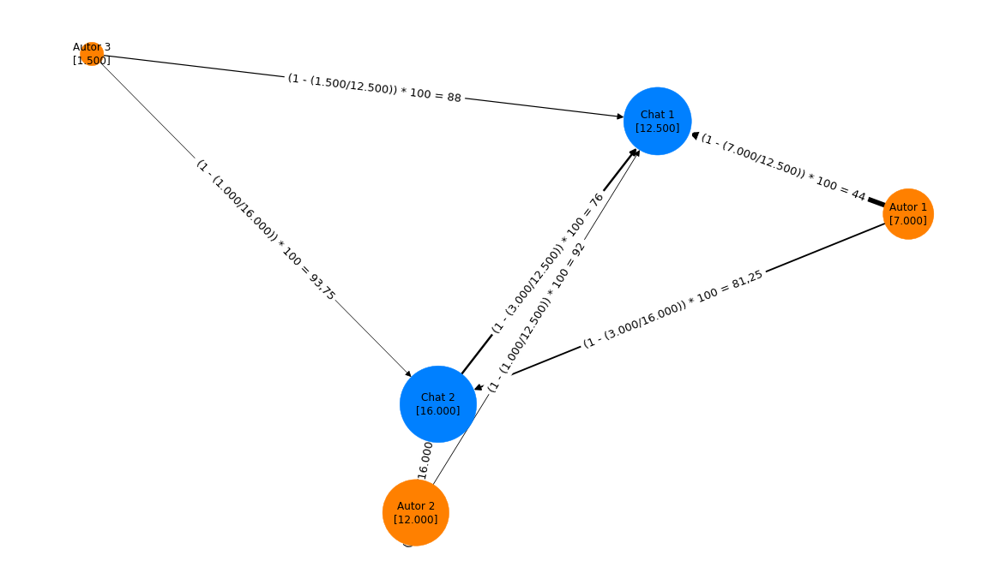

[Stopwatch stopped >>Social Graph Plot<< (0.342s)]

In [74]:
drawSocialGraph(
    G = generatedTestGraph,
    layoutSelector=1,
    configFactorEdge = 10,
    configFactorNode = 2,
    configArrowSize = 15,
    configPlotWidth = 16,
    configPlotHeight = 9,
    outputFilename = "social-graph-s-sample.svg",
    outputTitle = "Test Graph Kamda Kawai Layout"
)

[Stopwatch started >>Social Graph Plot<<]

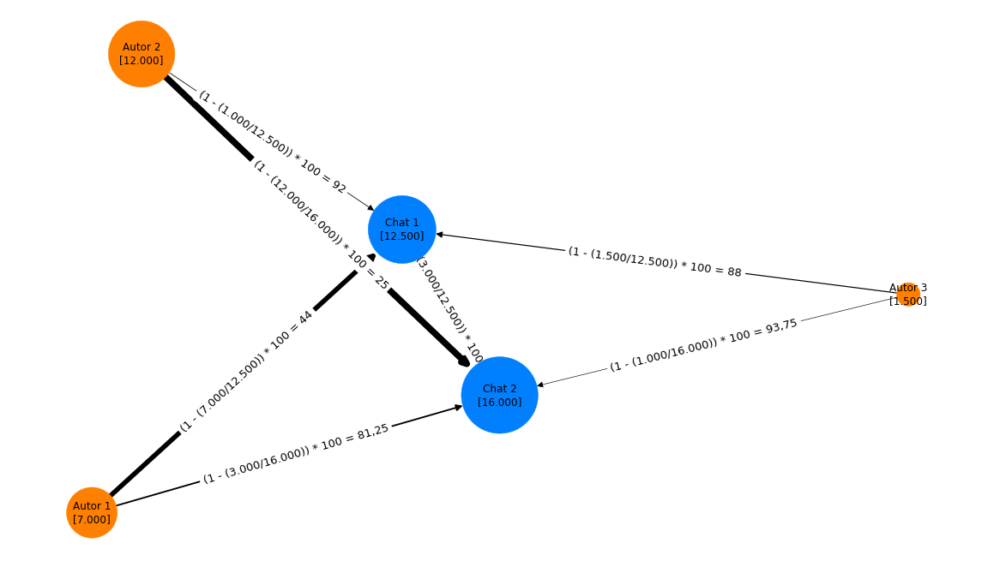

[Stopwatch stopped >>Social Graph Plot<< (0.262s)]

In [75]:
drawSocialGraph(
    G = generatedTestGraph,
    layoutSelector=2,
    configFactorEdge = 10,
    configFactorNode = 2,
    configArrowSize = 15,
    configPlotWidth = 16,
    configPlotHeight = 9,
    outputFilename = "",
    outputTitle = "Test Graph Spring Layout"
)

[Stopwatch started >>Social Graph Plot<<]

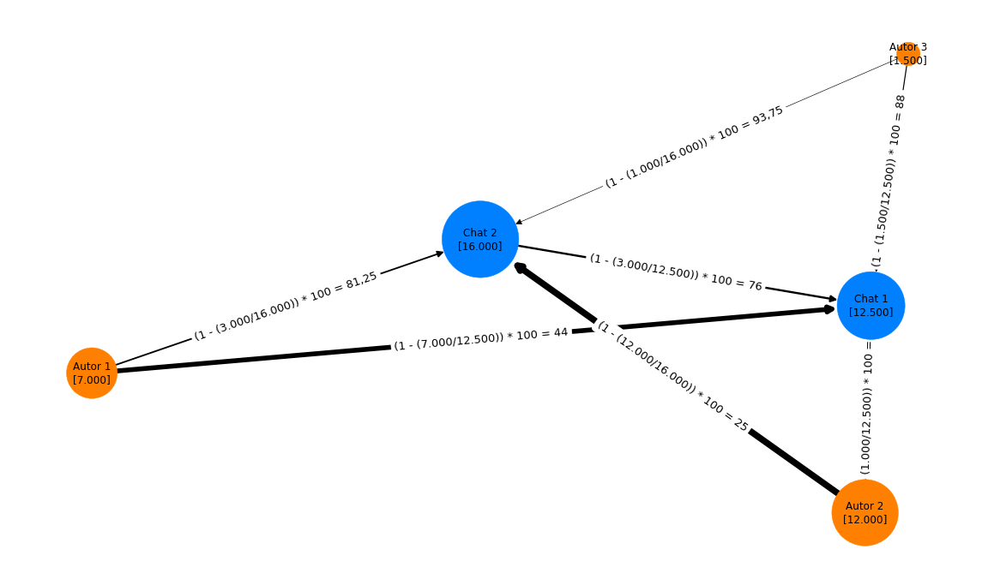

[Stopwatch stopped >>Social Graph Plot<< (0.894s)]

In [76]:
drawSocialGraph(
    G = generatedTestGraph,
    layoutSelector=3,
    configFactorEdge = 10,
    configFactorNode = 2,
    configArrowSize = 15,
    configPlotWidth = 16,
    configPlotHeight = 9,
    outputFilename = "",
    outputTitle = "Test Graph Graphviz Layout"
)

#### Visualisierung-Möglichkeiten von heruntergeladenen Chats

##### Features weiter aufbereiten

Hilfsfunktion für Gewichte

In [77]:
# Add node weight to dict
# Only adds new weight if newWeight > oldWeight
def addSocialGraphNodeWeight(chatName, chatWeight, targetDict):
    
    if(chatName in targetDict):
        oldWeight = targetDict[chatName]
        if(chatWeight > oldWeight):
            targetDict[chatName] = chatWeight
    else:
        targetDict[chatName] = chatWeight

Graph berechnen

- ``configTopNInfluencer``: e.g. For top 10 = 10
- ``configMinRefs``: e.g. 1 must have > 1 % forwarded messages
- ``listFilePaths``: List process filePaths
- ``socialGraphTargetDict``: e.g. forwarded from dict or hashtag dict
- ``socialGraphTargetAttribute``: e.g. ftQrIsForwarded (for calc percent)
- ``configFlagDebugLabel``: e.g. show debug info on label

In [78]:
def generateSocialGraph(configTopNInfluencer, configMinRefs, listFilePaths, socialGraphTargetDict, socialGraphTargetAttribute, configFlagDebugLabel):
    
    # Save node weights to dict
    dictSocialNodeWeights   = dict()

    # Flag downloaded nodes (exact node weight)
    dictExactNodesLabels    = {}
    
    gloStartStopwatch("Social Graph")
    
    # Generate directed graph
    G_weighted = nx.DiGraph()
    
    print("- Add edges")
    for fP in listFilePaths:
        
        # Query own params
        chatName                        = queryChatName(fP)
        chatNumberOfMessages            = queryNumberOfMessages(fP)
        chatNumberOfTargetMessages      = queryNumberOfMessagesByAttEqTrue(fP, socialGraphTargetAttribute)

        gloStartStopwatch("SG-Extract " + chatName + "(" + str(chatNumberOfTargetMessages) + "/" + str(chatNumberOfMessages) + " messages)")
        
        # Add exact node size (chat downloaded) and flag node
        addSocialGraphNodeWeight(chatName, chatNumberOfMessages, dictSocialNodeWeights)
        dictExactNodesLabels[chatName] = str(chatName) + "\n=[" + str(chatNumberOfTargetMessages) + "/" + str(chatNumberOfMessages) + "]"

        # Extract social graph data and get top influencer
        socialGraphData = socialGraphTargetDict[fP]
        socialGraphData = socialGraphData.most_common(configTopNInfluencer)
        
        # Iterate over forwarder
        for oChatName, oChatRefs in socialGraphData:
            
            # Query other params
            oChatName    = gloConvertToSafeChatName(str(oChatName))
            oChatRefs    = oChatRefs

            # If has forwarder
            if(oChatName != "nan"):
        
                # Calc percent (forwarded_messages)
                per = (oChatRefs/chatNumberOfTargetMessages) * 100

                # Filter unimportant forwarders
                if(per > configMinRefs):
                
                    # Add estimanted node size (chat not downloaded)
                    addSocialGraphNodeWeight(oChatName, oChatRefs, dictSocialNodeWeights)

                    # Invert percent (distance)
                    wei = 100 - per

                    # Label
                    if(configFlagDebugLabel):
                        lab = str(round(per, 3)) + "% (" + str(oChatRefs) + "/" + str(chatNumberOfTargetMessages) + "≙" + str(round(wei, 3)) + ")"
                    else:
                        lab = ""

                    # Add edge
                    G_weighted.add_edge(
                        chatName,
                        oChatName,
                        weight=wei,
                        tLabel = lab
                    )

        gloStopStopwatch("SG-Extract " + chatName + "(" + str(chatNumberOfTargetMessages) + "/" + str(chatNumberOfMessages) + " messages)")
        
    print("- Add different nodes")
    for aNode in dictSocialNodeWeights:
        
        # Query node params
        nodeName   = str(aNode)
        nodeWeight = dictSocialNodeWeights[aNode]

        # Set defaults
        tValueColor = "#ff8000"
        tLabel = str(nodeName) + "\n≈[" + str(nodeWeight) + "]"

        # Overwrite (if chat downloaded = exact weight)
        if(nodeName in dictExactNodesLabels):
            tValueColor = "#0080ff"
            tLabel = dictExactNodesLabels[nodeName]
        
        G_weighted.add_node(
            nodeName,
            weight=nodeWeight,
            tLabel = tLabel,
            tColor=tValueColor
        )
        
    gloStopStopwatch("Social Graph")
        
    return G_weighted

##### Visualisierung von verschiedenen Features

Forwarded From

[Stopwatch started >>Social Graph<<]

- Add edges

[Stopwatch started >>SG-Extract ATTILA HILDMANN (9148/37612 messages)<<]

[Stopwatch stopped >>SG-Extract ATTILA HILDMANN (9148/37612 messages)<< (0.013s)]

[Stopwatch started >>SG-Extract Oliver Janich oeffentlich(16856/47026 messages)<<]

[Stopwatch stopped >>SG-Extract Oliver Janich oeffentlich(16856/47026 messages)<< (0.010s)]

[Stopwatch started >>SG-Extract Eva Herman Offiziell(4949/36523 messages)<<]

[Stopwatch stopped >>SG-Extract Eva Herman Offiziell(4949/36523 messages)<< (0.012s)]

[Stopwatch started >>SG-Extract Xavier Naidoo inoffiziell(8934/12214 messages)<<]

[Stopwatch stopped >>SG-Extract Xavier Naidoo inoffiziell(8934/12214 messages)<< (0.013s)]

- Add different nodes

[Stopwatch stopped >>Social Graph<< (0.741s)]

[Stopwatch started >>Social Graph Plot<<]

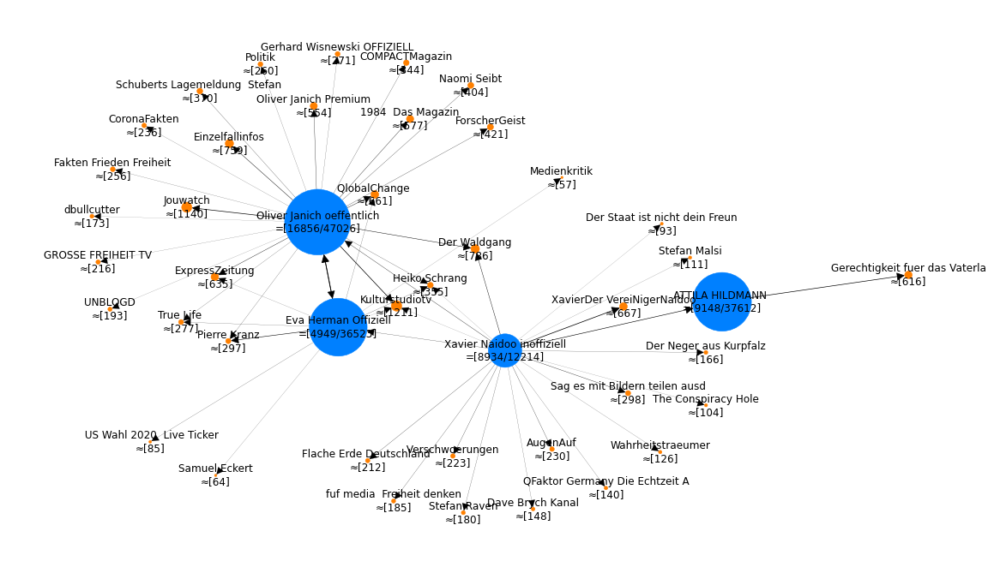

[Stopwatch stopped >>Social Graph Plot<< (1.492s)]

In [79]:
drawSocialGraph(
    generateSocialGraph(
        configTopNInfluencer = 100,  
        configMinRefs = 1,       
        listFilePaths = list(dfInputFiles[dfInputFiles.inputLabel == "dataSet0"].inputPath),
        socialGraphTargetDict = dictSGD_ForwardedFrom,
        socialGraphTargetAttribute = "ftQrIsForwarded",
        configFlagDebugLabel = False
    ),
    layoutSelector = 1,
    configFactorEdge = 10,
    configFactorNode = 8,
    configArrowSize = 20,
    configPlotWidth = 16,
    configPlotHeight = 9,
    outputFilename = "social-graph-dataSet0-forwarded-from.svg",
    outputTitle = "Forwarded From (Top 100 by 1 percent) (dataSet0)"
)

[Stopwatch started >>Social Graph<<]

- Add edges

[Stopwatch started >>SG-Extract Querdenken 089  MUeNCHEN  Disk(23087/82446 messages)<<]

[Stopwatch stopped >>SG-Extract Querdenken 089  MUeNCHEN  Disk(23087/82446 messages)<< (0.012s)]

[Stopwatch started >>SG-Extract QUERDENKEN 591  Emsland  INFOK(129/228 messages)<<]

[Stopwatch stopped >>SG-Extract QUERDENKEN 591  Emsland  INFOK(129/228 messages)<< (0.008s)]

[Stopwatch started >>SG-Extract QUERDENKEN 773  HEGAU  Diskuss(2327/10334 messages)<<]

[Stopwatch stopped >>SG-Extract QUERDENKEN 773  HEGAU  Diskuss(2327/10334 messages)<< (0.012s)]

[Stopwatch started >>SG-Extract QUERDENKEN 773  HEGAU  INFOKan(29/95 messages)<<]

[Stopwatch stopped >>SG-Extract QUERDENKEN 773  HEGAU  INFOKan(29/95 messages)<< (0.002s)]

[Stopwatch started >>SG-Extract Querdenken 711  STUTTGART  Wir(101/4084 messages)<<]

[Stopwatch stopped >>SG-Extract Querdenken 711  STUTTGART  Wir(101/4084 messages)<< (0.003s)]

[Stopwatch started >>SG-Extract QUERDENKEN 711  STUTTGART  INF(377/1332 messages)<<]

[Stopwatch stopped >>SG-Extract QUERDENKEN 711  STUTTGART  INF(377/1332 messages)<< (0.010s)]

[Stopwatch started >>SG-Extract Querdenken 69  FRANKFURT  Disk(7366/47029 messages)<<]

[Stopwatch stopped >>SG-Extract Querdenken 69  FRANKFURT  Disk(7366/47029 messages)<< (0.011s)]

[Stopwatch started >>SG-Extract Querdenken 69 Frankfurt  Info (69/295 messages)<<]

[Stopwatch stopped >>SG-Extract Querdenken 69 Frankfurt  Info (69/295 messages)<< (0.004s)]

- Add different nodes

[Stopwatch stopped >>Social Graph<< (0.753s)]

[Stopwatch started >>Social Graph Plot<<]

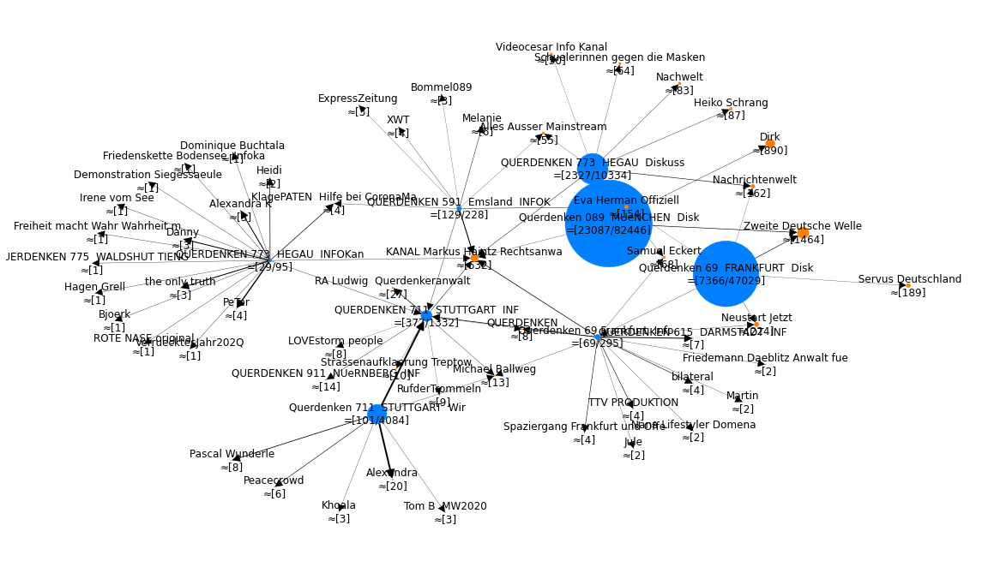

[Stopwatch stopped >>Social Graph Plot<< (1.353s)]

In [80]:
if("dataSet2" in C_LOAD_DATASETS):
    drawSocialGraph(
        generateSocialGraph(
            configTopNInfluencer = 100,  
            configMinRefs = 2,       
            listFilePaths = list(dfInputFiles[dfInputFiles.inputLabel == "dataSet2"].inputPath),
            socialGraphTargetDict = dictSGD_ForwardedFrom,
            socialGraphTargetAttribute = "ftQrIsForwarded",
            configFlagDebugLabel = False
        ),
        layoutSelector = 1,
        configFactorEdge = 10,
        configFactorNode = 8,
        configArrowSize = 20,
        configPlotWidth = 16,
        configPlotHeight = 9,
        outputFilename = "",
        outputTitle = "Forwarded From (Top 100 by 2 percent) (dataSet2)"
    )

Hashtag

[Stopwatch started >>Social Graph<<]

- Add edges

[Stopwatch started >>SG-Extract ATTILA HILDMANN (86/37612 messages)<<]

[Stopwatch stopped >>SG-Extract ATTILA HILDMANN (86/37612 messages)<< (0.001s)]

[Stopwatch started >>SG-Extract Oliver Janich oeffentlich(1476/47026 messages)<<]

[Stopwatch stopped >>SG-Extract Oliver Janich oeffentlich(1476/47026 messages)<< (0.002s)]

[Stopwatch started >>SG-Extract Eva Herman Offiziell(558/36523 messages)<<]

[Stopwatch stopped >>SG-Extract Eva Herman Offiziell(558/36523 messages)<< (0.002s)]

[Stopwatch started >>SG-Extract Xavier Naidoo inoffiziell(1943/12214 messages)<<]

[Stopwatch stopped >>SG-Extract Xavier Naidoo inoffiziell(1943/12214 messages)<< (0.001s)]

- Add different nodes

[Stopwatch stopped >>Social Graph<< (0.461s)]

[Stopwatch started >>Social Graph Plot<<]

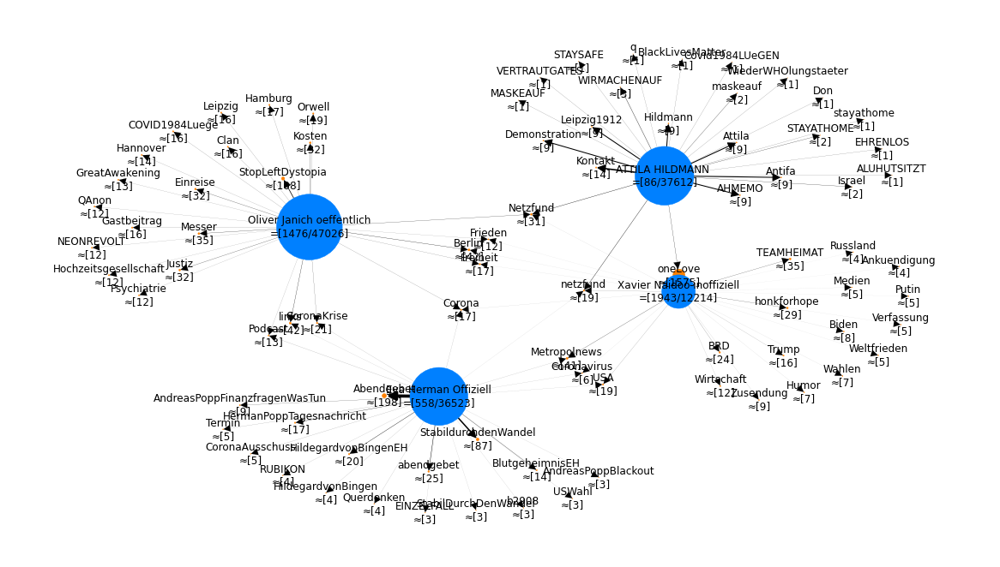

[Stopwatch stopped >>Social Graph Plot<< (2.277s)]

In [81]:
drawSocialGraph(
    generateSocialGraph(
        configTopNInfluencer = 25,  
        configMinRefs = 0,        
        listFilePaths = list(dfInputFiles[dfInputFiles.inputLabel == "dataSet0"].inputPath),
        socialGraphTargetDict = dictSGD_Hashtag,
        socialGraphTargetAttribute = "ftQrCoHashtags",
        configFlagDebugLabel = False
    ),
    layoutSelector = 1,
    configFactorEdge = 10,
    configFactorNode = 8,
    configArrowSize = 20,
    configPlotWidth = 16,
    configPlotHeight = 9,
    outputFilename = "",
    outputTitle = "Hashtags (Top 25 by 0 percent) (dataSet0)"
)

In [82]:
if("dataSet2" in C_LOAD_DATASETS and False): #TODO: Fix Graph
    drawSocialGraph(
        generateSocialGraph(
            configTopNInfluencer = 30,  
            configMinRefs = 4,        
            listFilePaths = list(dfInputFiles[dfInputFiles.inputLabel == "dataSet2"].inputPath),
            socialGraphTargetDict = dictSGD_Hashtag,
            socialGraphTargetAttribute = "ftQrCoHashtags",
            configFlagDebugLabel = False
        ),
        layoutSelector = 1,
        configFactorEdge = 10,
        configFactorNode = 8,
        configArrowSize = 20,
        configPlotWidth = 16,
        configPlotHeight = 9,
        outputFilename = "",
        outputTitle = "Hashtags (Top 30 by 4 percent) (dataSet2)"
    )

Hosts

[Stopwatch started >>Social Graph<<]

- Add edges

[Stopwatch started >>SG-Extract ATTILA HILDMANN (13760/37612 messages)<<]

[Stopwatch stopped >>SG-Extract ATTILA HILDMANN (13760/37612 messages)<< (0.009s)]

[Stopwatch started >>SG-Extract Oliver Janich oeffentlich(31088/47026 messages)<<]

[Stopwatch stopped >>SG-Extract Oliver Janich oeffentlich(31088/47026 messages)<< (0.008s)]

[Stopwatch started >>SG-Extract Eva Herman Offiziell(27327/36523 messages)<<]

[Stopwatch stopped >>SG-Extract Eva Herman Offiziell(27327/36523 messages)<< (0.009s)]

[Stopwatch started >>SG-Extract Xavier Naidoo inoffiziell(4457/12214 messages)<<]

[Stopwatch stopped >>SG-Extract Xavier Naidoo inoffiziell(4457/12214 messages)<< (0.008s)]

- Add different nodes

[Stopwatch stopped >>Social Graph<< (0.574s)]

[Stopwatch started >>Social Graph Plot<<]

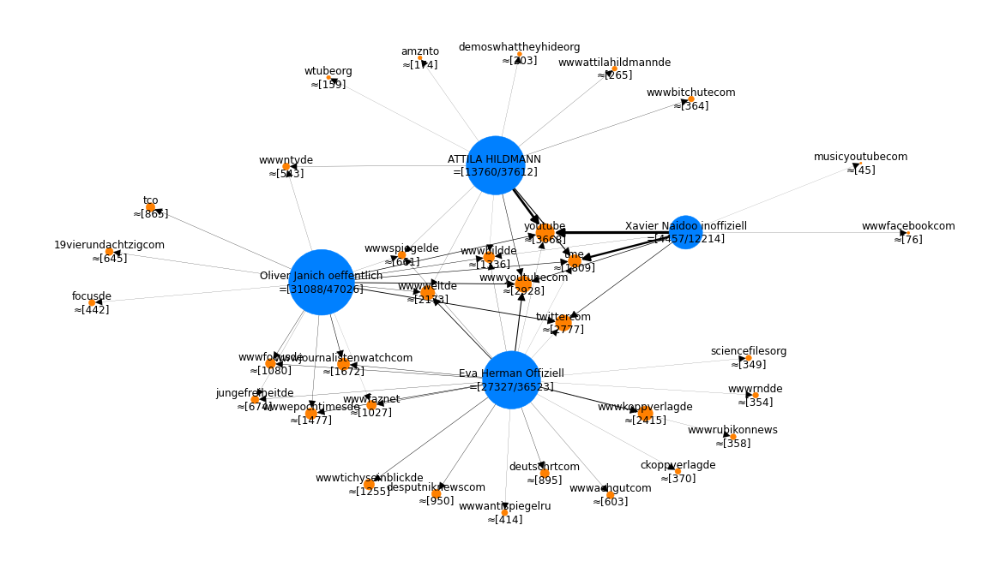

[Stopwatch stopped >>Social Graph Plot<< (0.916s)]

In [83]:
drawSocialGraph(
    generateSocialGraph(
        configTopNInfluencer = 100,  
        configMinRefs = 1,        
        listFilePaths = list(dfInputFiles[dfInputFiles.inputLabel == "dataSet0"].inputPath),
        socialGraphTargetDict = dictSGD_Host,
        socialGraphTargetAttribute = "ftQrCoUrls",
        configFlagDebugLabel = False
    ),
    layoutSelector = 1,
    configFactorEdge = 10,
    configFactorNode = 8,
    configArrowSize = 20,
    configPlotWidth = 16,
    configPlotHeight = 9,
    outputFilename = "",
    outputTitle = "Hosts (Top 100 by 1 percent) (dataSet0)"
)

[Stopwatch started >>Social Graph<<]

- Add edges

[Stopwatch started >>SG-Extract Querdenken 089  MUeNCHEN  Disk(24412/82446 messages)<<]

[Stopwatch stopped >>SG-Extract Querdenken 089  MUeNCHEN  Disk(24412/82446 messages)<< (0.008s)]

[Stopwatch started >>SG-Extract QUERDENKEN 591  Emsland  INFOK(96/228 messages)<<]

[Stopwatch stopped >>SG-Extract QUERDENKEN 591  Emsland  INFOK(96/228 messages)<< (0.003s)]

[Stopwatch started >>SG-Extract QUERDENKEN 773  HEGAU  Diskuss(2666/10334 messages)<<]

[Stopwatch stopped >>SG-Extract QUERDENKEN 773  HEGAU  Diskuss(2666/10334 messages)<< (0.008s)]

[Stopwatch started >>SG-Extract QUERDENKEN 773  HEGAU  INFOKan(19/95 messages)<<]

[Stopwatch stopped >>SG-Extract QUERDENKEN 773  HEGAU  INFOKan(19/95 messages)<< (0.001s)]

[Stopwatch started >>SG-Extract Querdenken 711  STUTTGART  Wir(247/4084 messages)<<]

[Stopwatch stopped >>SG-Extract Querdenken 711  STUTTGART  Wir(247/4084 messages)<< (0.003s)]

[Stopwatch started >>SG-Extract QUERDENKEN 711  STUTTGART  INF(897/1332 messages)<<]

[Stopwatch stopped >>SG-Extract QUERDENKEN 711  STUTTGART  INF(897/1332 messages)<< (0.008s)]

[Stopwatch started >>SG-Extract Querdenken 69  FRANKFURT  Disk(9644/47029 messages)<<]

[Stopwatch stopped >>SG-Extract Querdenken 69  FRANKFURT  Disk(9644/47029 messages)<< (0.008s)]

[Stopwatch started >>SG-Extract Querdenken 69 Frankfurt  Info (111/295 messages)<<]

[Stopwatch stopped >>SG-Extract Querdenken 69 Frankfurt  Info (111/295 messages)<< (0.003s)]

- Add different nodes

[Stopwatch stopped >>Social Graph<< (0.551s)]

[Stopwatch started >>Social Graph Plot<<]

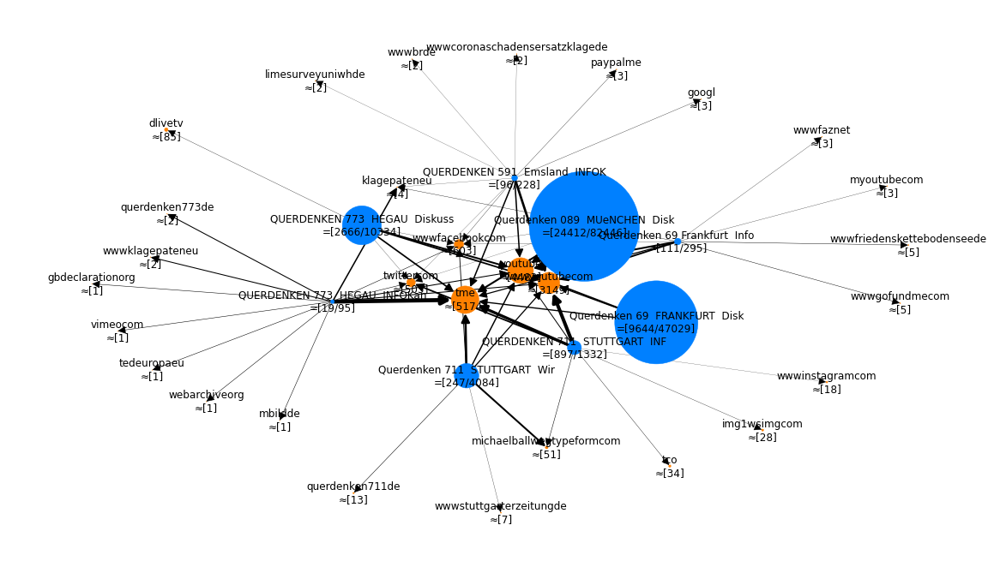

[Stopwatch stopped >>Social Graph Plot<< (0.923s)]

In [84]:
if("dataSet2" in C_LOAD_DATASETS):
    drawSocialGraph(
        generateSocialGraph(
            configTopNInfluencer = 100,  
            configMinRefs = 2,        
            listFilePaths = list(dfInputFiles[dfInputFiles.inputLabel == "dataSet2"].inputPath),
            socialGraphTargetDict = dictSGD_Host,
            socialGraphTargetAttribute = "ftQrCoUrls",
            configFlagDebugLabel = False
        ),
        layoutSelector = 1,
        configFactorEdge = 10,
        configFactorNode = 5,
        configArrowSize = 20,
        configPlotWidth = 16,
        configPlotHeight = 9,
        outputFilename = "",
        outputTitle = "Hosts (Top 100 by 1 percent) (dataSet2)"
    )

Emojis

[Stopwatch started >>Social Graph<<]

- Add edges

[Stopwatch started >>SG-Extract ATTILA HILDMANN (12275/37612 messages)<<]

[Stopwatch stopped >>SG-Extract ATTILA HILDMANN (12275/37612 messages)<< (0.021s)]

[Stopwatch started >>SG-Extract Oliver Janich oeffentlich(4512/47026 messages)<<]

[Stopwatch stopped >>SG-Extract Oliver Janich oeffentlich(4512/47026 messages)<< (0.024s)]

[Stopwatch started >>SG-Extract Eva Herman Offiziell(1998/36523 messages)<<]

[Stopwatch stopped >>SG-Extract Eva Herman Offiziell(1998/36523 messages)<< (0.028s)]

[Stopwatch started >>SG-Extract Xavier Naidoo inoffiziell(4534/12214 messages)<<]

[Stopwatch stopped >>SG-Extract Xavier Naidoo inoffiziell(4534/12214 messages)<< (0.020s)]

- Add different nodes

[Stopwatch stopped >>Social Graph<< (0.563s)]

[Stopwatch started >>Social Graph Plot<<]

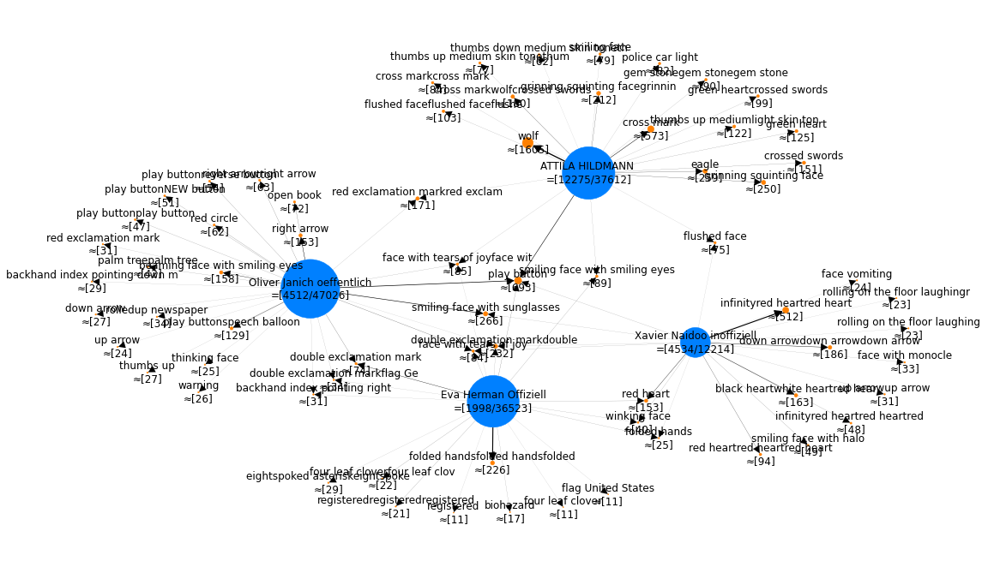

[Stopwatch stopped >>Social Graph Plot<< (1.881s)]

In [85]:
drawSocialGraph(
    generateSocialGraph(
        configTopNInfluencer = 100,  
        configMinRefs = 0.5,        
        listFilePaths = list(dfInputFiles[dfInputFiles.inputLabel == "dataSet0"].inputPath),
        socialGraphTargetDict = dictSGD_Emoji,
        socialGraphTargetAttribute = "ftQrCoEmojis",
        configFlagDebugLabel = False
    ),
    layoutSelector = 1,
    configFactorEdge = 10,
    configFactorNode = 10,
    configArrowSize = 20,
    configPlotWidth = 16,
    configPlotHeight = 9,
    outputFilename = "",
    outputTitle = "Emojis (Top 100 by 0.5 percent) (dataSet0)"
)

[Stopwatch started >>Social Graph<<]

- Add edges

[Stopwatch started >>SG-Extract Querdenken 089  MUeNCHEN  Disk(20262/82446 messages)<<]

[Stopwatch stopped >>SG-Extract Querdenken 089  MUeNCHEN  Disk(20262/82446 messages)<< (0.023s)]

[Stopwatch started >>SG-Extract QUERDENKEN 591  Emsland  INFOK(65/228 messages)<<]

[Stopwatch stopped >>SG-Extract QUERDENKEN 591  Emsland  INFOK(65/228 messages)<< (0.022s)]

[Stopwatch started >>SG-Extract QUERDENKEN 773  HEGAU  Diskuss(2666/10334 messages)<<]

[Stopwatch stopped >>SG-Extract QUERDENKEN 773  HEGAU  Diskuss(2666/10334 messages)<< (0.024s)]

[Stopwatch started >>SG-Extract QUERDENKEN 773  HEGAU  INFOKan(25/95 messages)<<]

[Stopwatch stopped >>SG-Extract QUERDENKEN 773  HEGAU  INFOKan(25/95 messages)<< (0.027s)]

[Stopwatch started >>SG-Extract Querdenken 711  STUTTGART  Wir(125/4084 messages)<<]

[Stopwatch stopped >>SG-Extract Querdenken 711  STUTTGART  Wir(125/4084 messages)<< (0.014s)]

[Stopwatch started >>SG-Extract QUERDENKEN 711  STUTTGART  INF(164/1332 messages)<<]

[Stopwatch stopped >>SG-Extract QUERDENKEN 711  STUTTGART  INF(164/1332 messages)<< (0.050s)]

[Stopwatch started >>SG-Extract Querdenken 69  FRANKFURT  Disk(11739/47029 messages)<<]

[Stopwatch stopped >>SG-Extract Querdenken 69  FRANKFURT  Disk(11739/47029 messages)<< (0.016s)]

[Stopwatch started >>SG-Extract Querdenken 69 Frankfurt  Info (129/295 messages)<<]

[Stopwatch stopped >>SG-Extract Querdenken 69 Frankfurt  Info (129/295 messages)<< (0.038s)]

- Add different nodes

[Stopwatch stopped >>Social Graph<< (0.783s)]

[Stopwatch started >>Social Graph Plot<<]

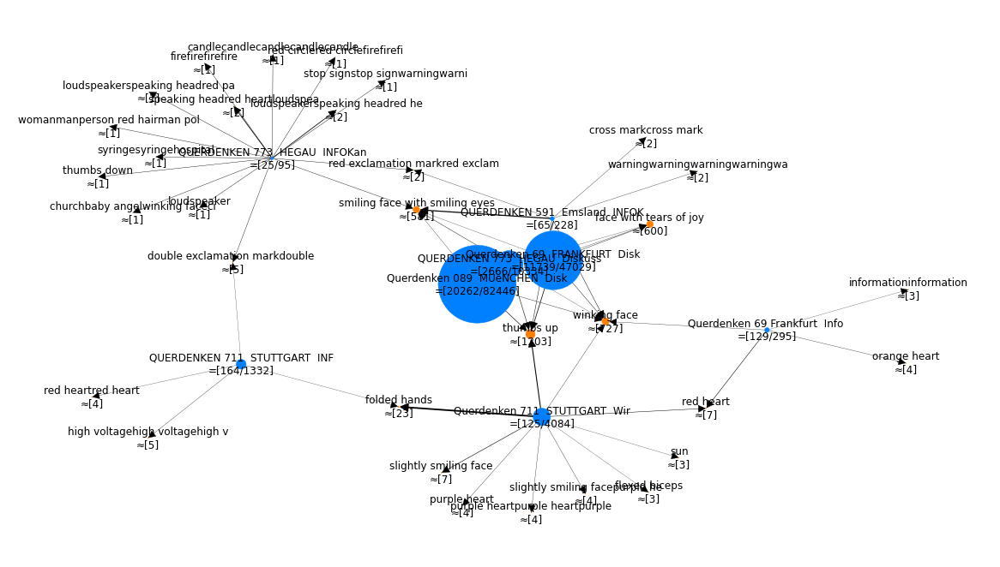

[Stopwatch stopped >>Social Graph Plot<< (0.890s)]

In [86]:
if("dataSet2" in C_LOAD_DATASETS):
    drawSocialGraph(
        generateSocialGraph(
            configTopNInfluencer = 100,  
            configMinRefs = 2,        
            listFilePaths = list(dfInputFiles[dfInputFiles.inputLabel == "dataSet2"].inputPath),
            socialGraphTargetDict = dictSGD_Emoji,
            socialGraphTargetAttribute = "ftQrCoEmojis",
            configFlagDebugLabel = False
        ),
        layoutSelector = 1,
        configFactorEdge = 10,
        configFactorNode = 10,
        configArrowSize = 20,
        configPlotWidth = 16,
        configPlotHeight = 9,
        outputFilename = "",
        outputTitle = "Emojis (Top 100 by 2 percent) (dataSet2)"
    )

From

[Stopwatch started >>Social Graph<<]

- Add edges

[Stopwatch started >>SG-Extract FREIHEITSCHAT(226156/377365 messages)<<]

[Stopwatch stopped >>SG-Extract FREIHEITSCHAT(226156/377365 messages)<< (0.008s)]

[Stopwatch started >>SG-Extract FREIHEITSCHAT  BLITZ(101657/125958 messages)<<]

[Stopwatch stopped >>SG-Extract FREIHEITSCHAT  BLITZ(101657/125958 messages)<< (0.003s)]

[Stopwatch started >>SG-Extract Livestreaming fuer Deutschland(6120/7092 messages)<<]

[Stopwatch stopped >>SG-Extract Livestreaming fuer Deutschland(6120/7092 messages)<< (0.002s)]

- Add different nodes

[Stopwatch stopped >>Social Graph<< (3.359s)]

[Stopwatch started >>Social Graph Plot<<]

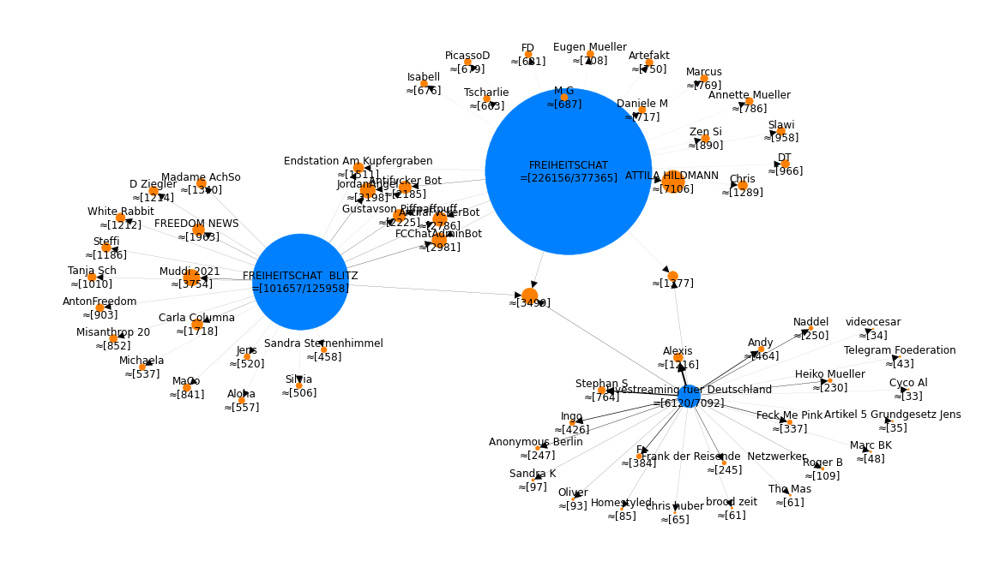

[Stopwatch stopped >>Social Graph Plot<< (2.018s)]

In [87]:
if("dataSet1a" in C_LOAD_DATASETS):
    drawSocialGraph(
        generateSocialGraph(
            configTopNInfluencer = 25,  
            configMinRefs = 0,        
            listFilePaths = list(dfInputFiles[dfInputFiles.inputLabel == "dataSet1a"].inputPath),
            socialGraphTargetDict = dictSGD_From,
            socialGraphTargetAttribute = "ftQrIsValidText", #TODO: Improve
            configFlagDebugLabel = False
        ),
        layoutSelector = 1,
        configFactorEdge = 10,
        configFactorNode = 10,
        configArrowSize = 20,
        configPlotWidth = 16,
        configPlotHeight = 9,
        outputFilename = "social-graph-dataSet1a-from.svg",
        outputTitle = "From (Top 25 by 0 percent) (dataSet1a)"
    )

[Stopwatch started >>Social Graph<<]

- Add edges

[Stopwatch started >>SG-Extract Querdenken 089  MUeNCHEN  Disk(63729/82446 messages)<<]

[Stopwatch stopped >>SG-Extract Querdenken 089  MUeNCHEN  Disk(63729/82446 messages)<< (0.004s)]

[Stopwatch started >>SG-Extract Querdenken 69  FRANKFURT  Disk(39733/47029 messages)<<]

[Stopwatch stopped >>SG-Extract Querdenken 69  FRANKFURT  Disk(39733/47029 messages)<< (0.004s)]

[Stopwatch started >>SG-Extract QUERDENKEN 773  HEGAU  Diskuss(7909/10334 messages)<<]

[Stopwatch stopped >>SG-Extract QUERDENKEN 773  HEGAU  Diskuss(7909/10334 messages)<< (0.003s)]

[Stopwatch started >>SG-Extract Querdenken 711  STUTTGART  Wir(599/4084 messages)<<]

[Stopwatch stopped >>SG-Extract Querdenken 711  STUTTGART  Wir(599/4084 messages)<< (0.003s)]

- Add different nodes

[Stopwatch stopped >>Social Graph<< (0.553s)]

[Stopwatch started >>Social Graph Plot<<]

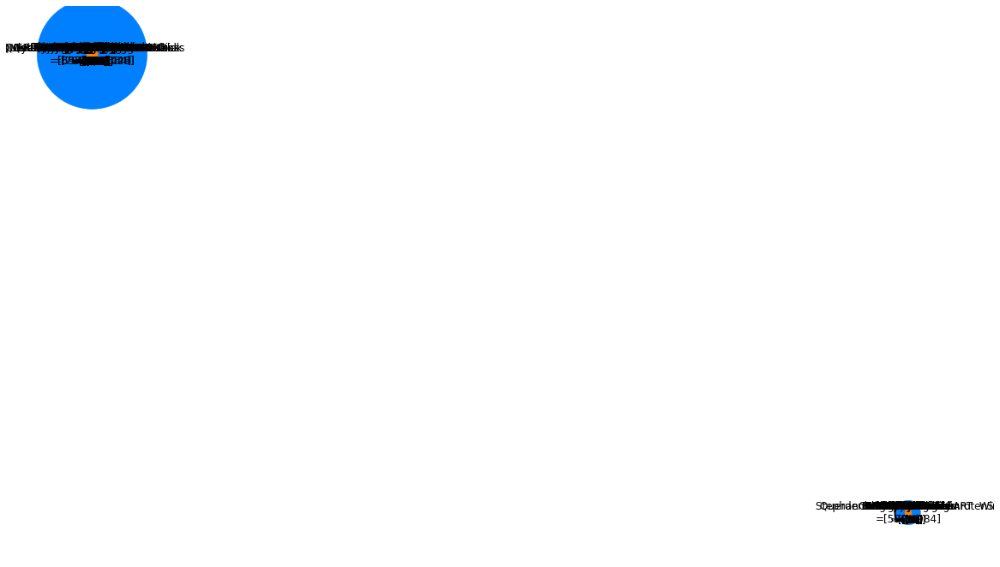

[Stopwatch stopped >>Social Graph Plot<< (15.575s)]

In [88]:
if("dataSet2" in C_LOAD_DATASETS):
    drawSocialGraph(
        generateSocialGraph(
            configTopNInfluencer = 50,  
            configMinRefs = 0,        
            listFilePaths = [
                "DS-13-01-2021/ChatExport_2021-01-13-querdenken089",
                "DS-13-01-2021/ChatExport_2021-01-13-querdenken69",
                "DS-13-01-2021/ChatExport_2021-01-13-querdenken773",
                "DS-13-01-2021/ChatExport_2021-01-13-querdenken711"
                ],
            socialGraphTargetDict = dictSGD_From,
            socialGraphTargetAttribute = "ftQrIsValidText", #TODO: Improve
            configFlagDebugLabel = False
        ),
        layoutSelector = 1,
        configFactorEdge = 10,
        configFactorNode = 5,
        configArrowSize = 20,
        configPlotWidth = 16,
        configPlotHeight = 9,
        outputFilename = "social-graph-groups-dataSet2-from.svg",
        outputTitle = "From (Top 25 by 0 percent) (dataSet2-groups)"
    )

### Dimension Zeit

#### Wie aufbereiten?

##### Anzahl Nachrichten bis zu Stichtach (mit Term-Filter)

- ``targetDate``: e.g. 1970-01-01
- ``fP``: filePath
- ``highlightWord``: set "" = no filter

In [89]:
def queryNumberOfMessagesByDate(targetDate, fP, highlightWord):

    df = dictMessages[fP].copy()

    df = df[df.ftQrIsValidText == True]

    df["date"] = pd.to_datetime(df["date"])
    
    df = df[df.date <= targetDate]

    if(highlightWord != ""):
        df = df[df.ftTdSafeLowerText.str.contains(highlightWord)]

    l = len(df.index)

    if(l > 0):
        return l
    else:
        return np.nan

##### MatPlot-Umsetzung

- ``filePathList``: filePathList
- ``outputFilename``: set "" = no output file
- ``highlightWords``: list of highlight words (leave empty if not used)
- ``configFrequency``: e.g. 1D or 1M

In [90]:
# TODO: Add percent to label

def drawTimePlot(filePathList, outputFilename, highlightWords, configFrequency):

    gloStartStopwatch("Time Plot")

    plt.figure(figsize=(16, 9))

    df = pd.DataFrame(
        index=pd.date_range( #m/d/y
            start='9/1/2018',
            end='2/1/2021',
            freq=configFrequency
            )
        )

    # Add date to process
    df["date"] = df.index

    vLineHeight = -1

    for fP in filePathList:
        gloStartStopwatch("Time Plot >>" + fP + "<<")

        # Plot Graph Var 1
        if not highlightWords:
            # Plot
            plt.plot(
                df.index, #x
                df.apply(lambda x: queryNumberOfMessagesByDate(x.date, fP, highlightWord = ""), axis=1), #y
                label = queryChatName(fP) #label
            )
            # Set vline height
            currentHeight = queryNumberOfMessagesByAttEqTrue(fP, "ftQrIsValidText")
            if(currentHeight > vLineHeight):
                vLineHeight = currentHeight

        # Plot High Light Word Graph / Var 2
        for hWord in highlightWords:
            y = df.apply(lambda x: queryNumberOfMessagesByDate(x.date, fP, highlightWord = hWord), axis=1)
            # Plot
            plt.plot(
                df.index, #x
                y, #y
                label = queryChatName(fP) + " usages of '" + hWord + "'" #label
            )
            # Set vline height
            currentHeight = y.max()
            if(currentHeight > vLineHeight):
                vLineHeight = currentHeight

        gloStopStopwatch("Time Plot >>" + fP + "<<")

    # yy - mm - dd
    # TODO: Double check https://www.bundesgesundheitsministerium.de/coronavirus/chronik-coronavirus.html?stand=20210104
    plt.vlines(x = ["2018-12-10"], ymin=0, ymax=vLineHeight, color="orange", ls='--', label="Global Compact for Migration (2018-12-10)")
    plt.vlines(x = ["2020-01-27"], ymin=0, ymax=vLineHeight, color="grey", ls='--', label="Corona Patient Zero Germany")
    plt.vlines(x = ["2020-03-23"], ymin=0, ymax=vLineHeight, color="purple", ls='--', label="1. Lockdown Germany (2020-03-23)")
    plt.vlines(x = ["2020-11-02"], ymin=0, ymax=vLineHeight, color="purple", ls='--', label="2. Lockdown light Germany (2020-11-02)")
    plt.vlines(x = ["2020-12-16"], ymin=0, ymax=vLineHeight, color="purple", ls='--', label="3. Lockdown Germany (2020-12-16)")

    plt.gcf().autofmt_xdate()
    _ = plt.legend()

    if(outputFilename != ""):
        plt.savefig(dir_var_output + outputFilename)

    gloStopStopwatch("Time Plot")

#### Normaler Time Plot

[Stopwatch started >>Time Plot<<]

[Stopwatch started >>Time Plot >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<<< (0.928s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021/ChatExport_2021-01-05-janich<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021/ChatExport_2021-01-05-janich<<<< (1.208s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<<< (0.723s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<<< (0.293s)]

[Stopwatch stopped >>Time Plot<< (3.417s)]

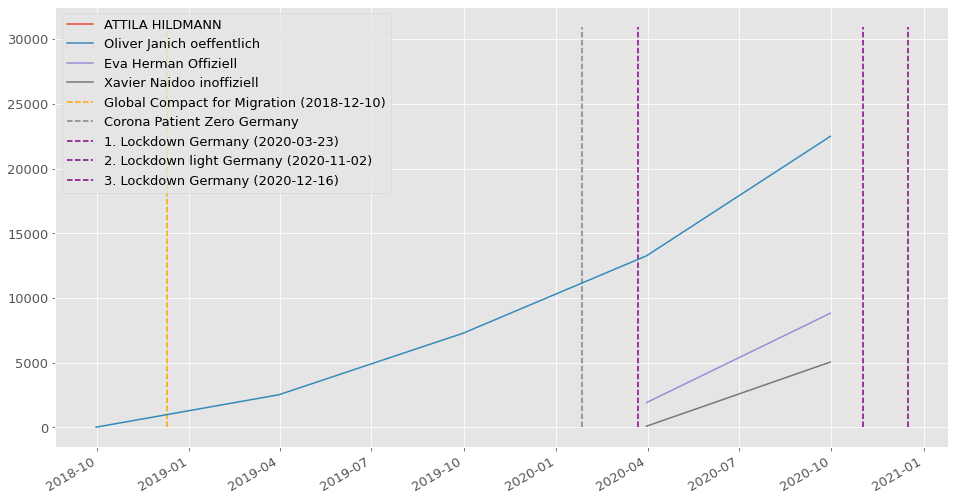

In [91]:
if(C_SHORT_RUN == False):
    drawTimePlot(
        filePathList = list(dfInputFiles[dfInputFiles.inputLabel == "dataSet0"].inputPath),
        outputFilename = "time-plot-dataSet0.svg",
        highlightWords = [],
        configFrequency=C_TIME_PLOT_FREQ
    )

[Stopwatch started >>Time Plot<<]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-gerechtigkeitVaterland<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-gerechtigkeitVaterland<<<< (0.056s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-aktuelleKarikaturen<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-aktuelleKarikaturen<<<< (0.056s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-drHeinrichFiechtnerInfo<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-drHeinrichFiechtnerInfo<<<< (0.029s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-michaelWendler<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-michaelWendler<<<< (0.041s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-laserLurch<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-laserLurch<<<< (0.027s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-dawidSnowden<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-dawidSnowden<<<< (0.043s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-kenJebsen<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-kenJebsen<<<< (0.056s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-nachrichtenWelt<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-nachrichtenWelt<<<< (0.058s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-qAnonAussteiger<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-qAnonAussteiger<<<< (0.062s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-whatTheyHide<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-whatTheyHide<<<< (0.034s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-kulturStudio<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-kulturStudio<<<< (0.176s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-jouwatch<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-jouwatch<<<< (0.510s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-derWaldgang<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-derWaldgang<<<< (0.142s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-einzelfallInfos<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-einzelfallInfos<<<< (1.296s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-qLobalChange<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-qLobalChange<<<< (0.332s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-expressZeitung<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-expressZeitung<<<< (0.111s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-1984DasMagazin<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-1984DasMagazin<<<< (0.067s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-forscherGeist<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-forscherGeist<<<< (0.098s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-schubertsLagemeldung<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-schubertsLagemeldung<<<< (0.057s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-coronaFakten<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-coronaFakten<<<< (0.028s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-coronaVirusInfo<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-coronaVirusInfo<<<< (0.093s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-epochTimesDeutschland<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-epochTimesDeutschland<<<< (0.167s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-translatedVideosWahlbetrug<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-translatedVideosWahlbetrug<<<< (0.041s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-checkMateNews<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-checkMateNews<<<< (0.626s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-markusHaintz<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-markusHaintz<<<< (0.068s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-connectivEvents<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-connectivEvents<<<< (0.066s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-pierreKranz<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-pierreKranz<<<< (0.046s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-heikoSchrang<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-heikoSchrang<<<< (0.078s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-usWahl2020LiveTicker<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-usWahl2020LiveTicker<<<< (0.029s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-trueLife<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-trueLife<<<< (0.106s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-samuelEckert<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-samuelEckert<<<< (0.045s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-medienKritik<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-medienKritik<<<< (0.056s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-rabbitResearch<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-rabbitResearch<<<< (0.046s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-nuoviso<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-nuoviso<<<< (0.039s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-haunsiAppmann<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-haunsiAppmann<<<< (0.033s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-friedlicheHandtuchRevolution<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-friedlicheHandtuchRevolution<<<< (0.029s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-sagEsMitBildern<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-sagEsMitBildern<<<< (0.217s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-augenAuf<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-augenAuf<<<< (0.314s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-verschwoerungen<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-verschwoerungen<<<< (0.131s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-flacheErdeDeutschland<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-flacheErdeDeutschland<<<< (0.064s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-fufMedia<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-fufMedia<<<< (0.182s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-coachCecil<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-coachCecil<<<< (0.031s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-qanonAustria<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-qanonAustria<<<< (0.188s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-honkForHope<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-honkForHope<<<< (0.035s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-dasPrinzTelegram<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-dasPrinzTelegram<<<< (0.047s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-demoTermine<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-demoTermine<<<< (0.106s)]

[Stopwatch stopped >>Time Plot<< (7.409s)]

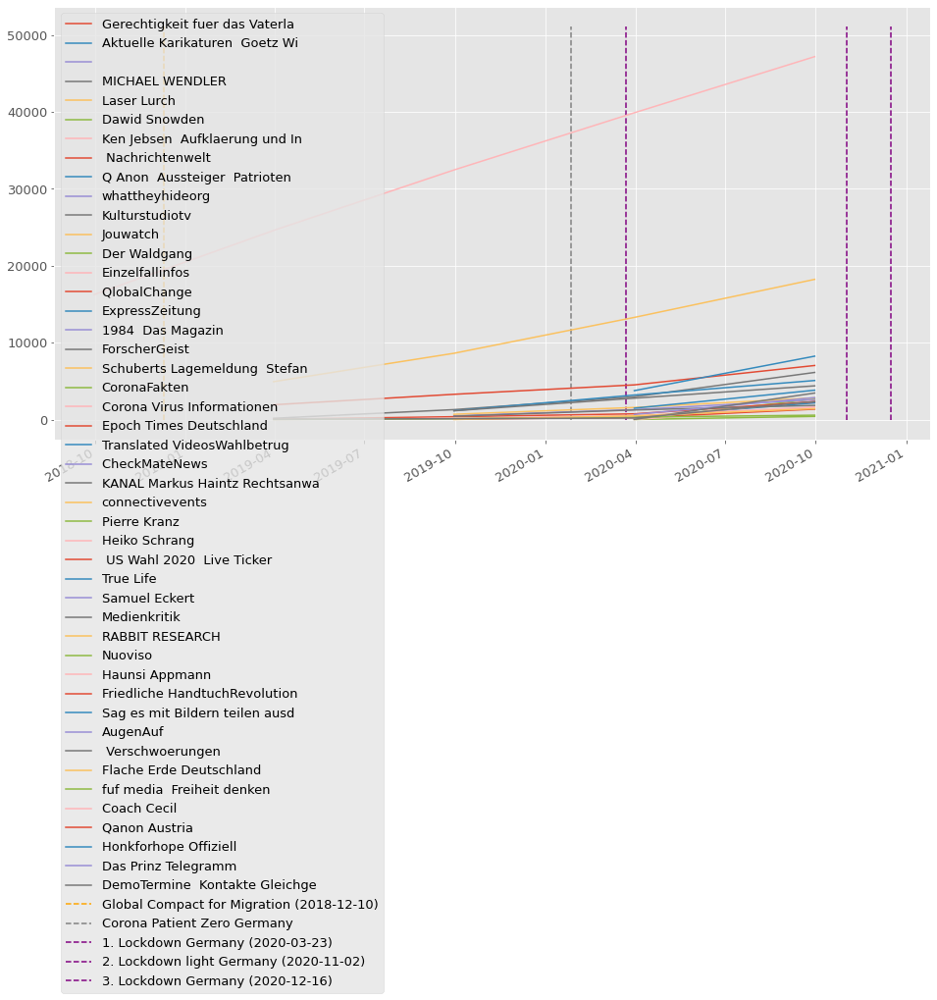

In [92]:
if(C_SHORT_RUN == False):
    if("dataSet1" in C_LOAD_DATASETS):
        drawTimePlot(
            filePathList = list(dfInputFiles[dfInputFiles.inputLabel == "dataSet1"].inputPath),
            outputFilename = "time-plot-dataSet1.svg",
            highlightWords = [],
            configFrequency=C_TIME_PLOT_FREQ
        )

[Stopwatch started >>Time Plot<<]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-freiheitsChat<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-freiheitsChat<<<< (12.979s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-freiheitsChatBlitz<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-freiheitsChatBlitz<<<< (4.073s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-liveFuerDeOsSc<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-liveFuerDeOsSc<<<< (0.110s)]

[Stopwatch stopped >>Time Plot<< (17.400s)]

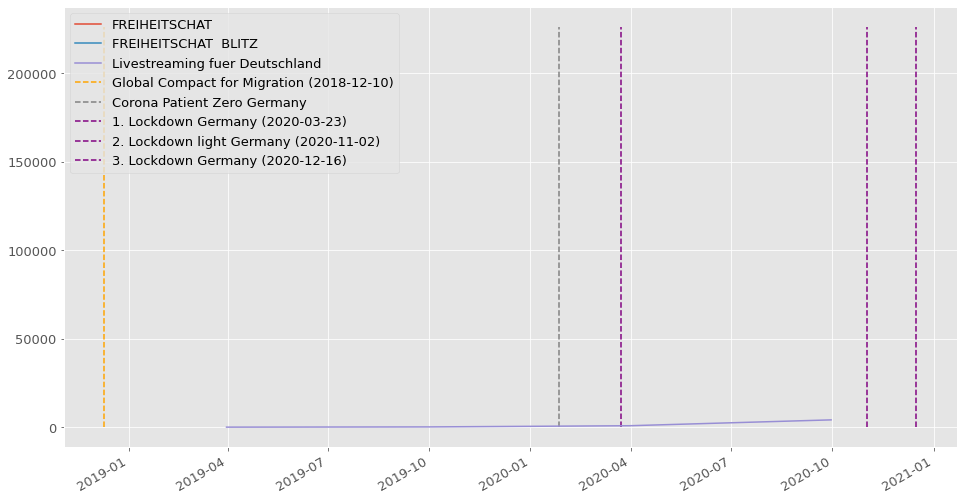

In [93]:
if(C_SHORT_RUN == False):
    if("dataSet1a" in C_LOAD_DATASETS):
        drawTimePlot(
            filePathList = list(dfInputFiles[dfInputFiles.inputLabel == "dataSet1a"].inputPath),
            outputFilename = "time-plot-dataSet1a.svg",
            highlightWords = [],
            configFrequency=C_TIME_PLOT_FREQ
        )

[Stopwatch started >>Time Plot<<]

[Stopwatch started >>Time Plot >>DS-13-01-2021/ChatExport_2021-01-13-querdenken089<<<<]

[Stopwatch stopped >>Time Plot >>DS-13-01-2021/ChatExport_2021-01-13-querdenken089<<<< (2.059s)]

[Stopwatch started >>Time Plot >>DS-13-01-2021/ChatExport_2021-01-13-querdenken591Info<<<<]

[Stopwatch stopped >>Time Plot >>DS-13-01-2021/ChatExport_2021-01-13-querdenken591Info<<<< (0.024s)]

[Stopwatch started >>Time Plot >>DS-13-01-2021/ChatExport_2021-01-13-querdenken773<<<<]

[Stopwatch stopped >>Time Plot >>DS-13-01-2021/ChatExport_2021-01-13-querdenken773<<<< (0.208s)]

[Stopwatch started >>Time Plot >>DS-13-01-2021/ChatExport_2021-01-13-querdenken773Info<<<<]

[Stopwatch stopped >>Time Plot >>DS-13-01-2021/ChatExport_2021-01-13-querdenken773Info<<<< (0.023s)]

[Stopwatch started >>Time Plot >>DS-13-01-2021/ChatExport_2021-01-13-querdenken711<<<<]

[Stopwatch stopped >>Time Plot >>DS-13-01-2021/ChatExport_2021-01-13-querdenken711<<<< (0.056s)]

[Stopwatch started >>Time Plot >>DS-13-01-2021/ChatExport_2021-01-13-querdenken711Info<<<<]

[Stopwatch stopped >>Time Plot >>DS-13-01-2021/ChatExport_2021-01-13-querdenken711Info<<<< (0.038s)]

[Stopwatch started >>Time Plot >>DS-13-01-2021/ChatExport_2021-01-13-querdenken69<<<<]

[Stopwatch stopped >>Time Plot >>DS-13-01-2021/ChatExport_2021-01-13-querdenken69<<<< (1.159s)]

[Stopwatch started >>Time Plot >>DS-13-01-2021/ChatExport_2021-01-13-querdenken69Info<<<<]

[Stopwatch stopped >>Time Plot >>DS-13-01-2021/ChatExport_2021-01-13-querdenken69Info<<<< (0.025s)]

[Stopwatch stopped >>Time Plot<< (3.909s)]

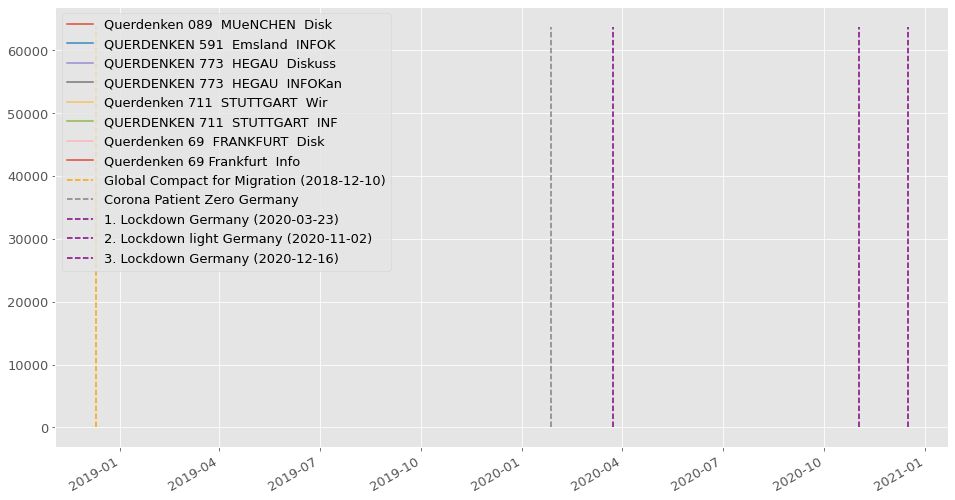

In [94]:
if(C_SHORT_RUN == False):
    if("dataSet2" in C_LOAD_DATASETS):
        drawTimePlot(
            filePathList = list(dfInputFiles[dfInputFiles.inputLabel == "dataSet2"].inputPath),
            outputFilename = "time-plot-dataSet2.svg",
            highlightWords = [],
            configFrequency=C_TIME_PLOT_FREQ
        )

#### Word Tracer

In [95]:
# https://www.bundestag.de/parlament/plenum/sitzverteilung_19wp
highlightwords = ["cdu", "spd", "afd", "fdp", "linke", "gruenen", "merkel"]

[Stopwatch started >>Time Plot<<]

[Stopwatch started >>Time Plot >>DS-05-01-2021/ChatExport_2021-01-05-janich<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021/ChatExport_2021-01-05-janich<<<< (7.486s)]

[Stopwatch stopped >>Time Plot<< (7.837s)]

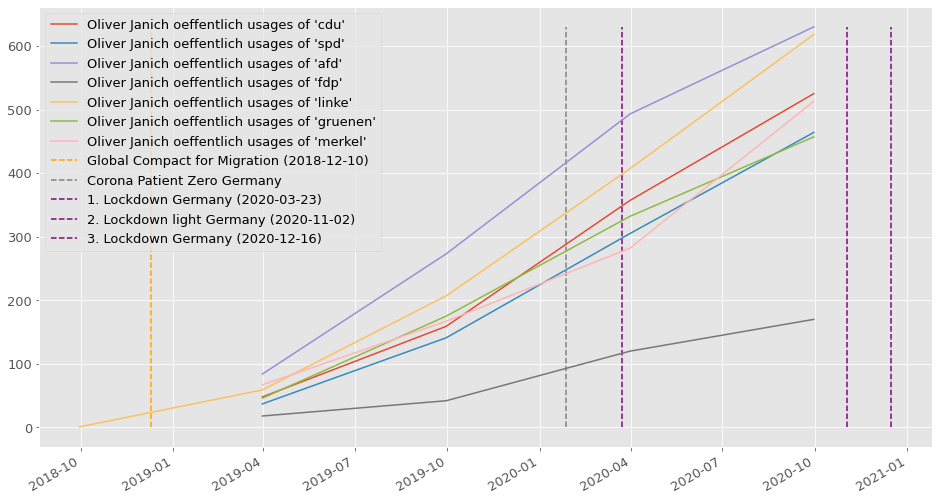

In [96]:
if(C_SHORT_RUN == False):
    drawTimePlot(
        filePathList = list(["DS-05-01-2021/ChatExport_2021-01-05-janich"]),
        outputFilename = "word-tracer-oliver-janich.svg",
        highlightWords = highlightwords,
        configFrequency=C_TIME_PLOT_FREQ
    )

[Stopwatch started >>Time Plot<<]

[Stopwatch started >>Time Plot >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<<< (5.656s)]

[Stopwatch stopped >>Time Plot<< (5.964s)]

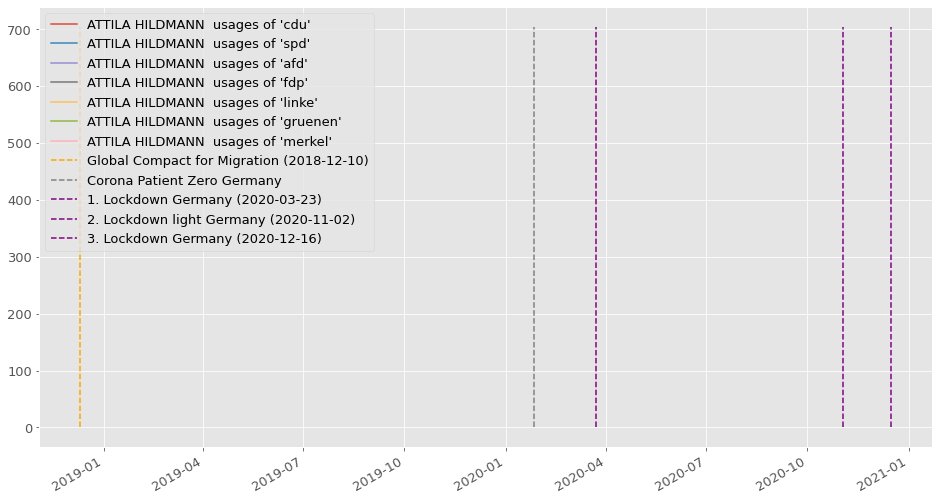

In [97]:
if(C_SHORT_RUN == False):
    drawTimePlot(
        filePathList = list(["DS-05-01-2021/ChatExport_2021-01-05-hildmann"]),
        outputFilename = "word-tracer-attila-hildmann.svg",
        highlightWords = highlightwords,
        configFrequency=C_TIME_PLOT_FREQ
    )

[Stopwatch started >>Time Plot<<]

[Stopwatch started >>Time Plot >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<<< (4.603s)]

[Stopwatch stopped >>Time Plot<< (4.886s)]

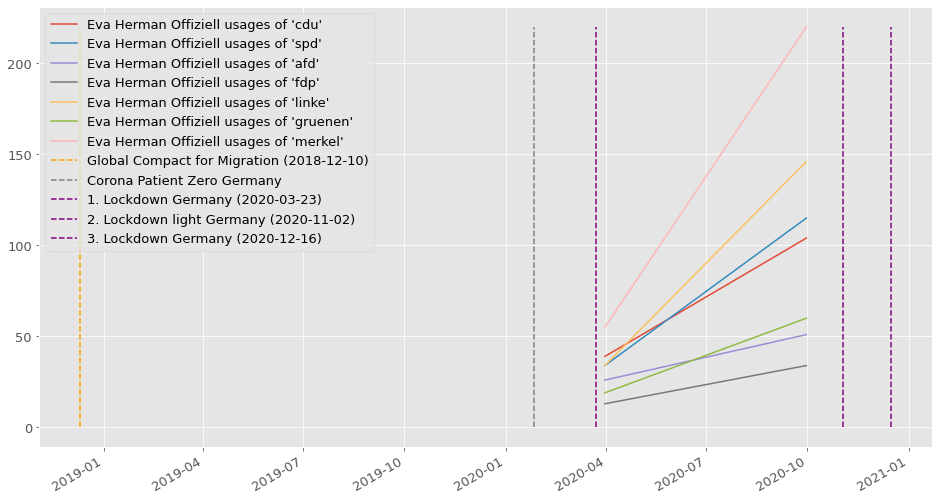

In [98]:
if(C_SHORT_RUN == False):
    drawTimePlot(
        filePathList = list(["DS-05-01-2021/ChatExport_2021-01-05-evaherman"]),
        outputFilename = "word-tracer-eva-herman.svg",
        highlightWords = highlightwords,
        configFrequency=C_TIME_PLOT_FREQ
    )

[Stopwatch started >>Time Plot<<]

[Stopwatch started >>Time Plot >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<<< (1.779s)]

[Stopwatch stopped >>Time Plot<< (2.075s)]

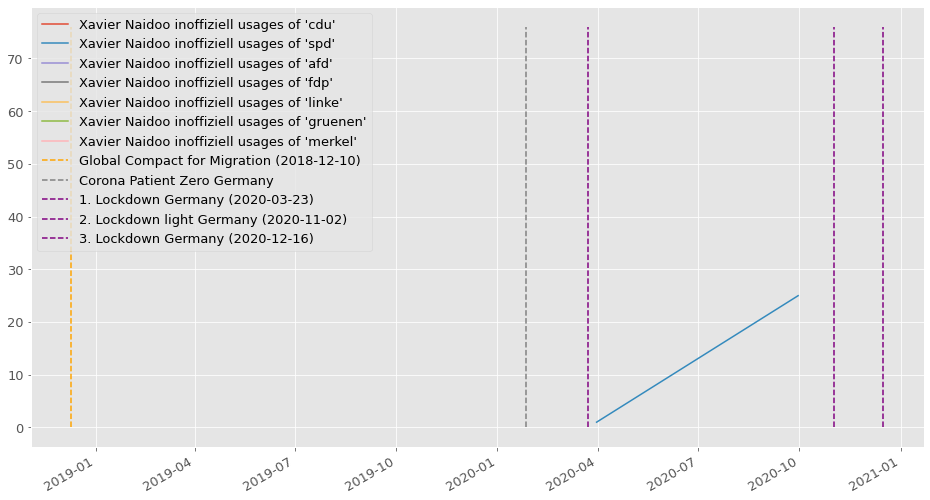

In [99]:
if(C_SHORT_RUN == False):
    drawTimePlot(
        filePathList = list(["DS-05-01-2021/ChatExport_2021-01-05-xavier"]),
        outputFilename = "word-tracer-xavier-naidoo.svg",
        highlightWords = highlightwords,
        configFrequency=C_TIME_PLOT_FREQ
    )

## Text Mining

### Welche Text-Nachrichten sind verwertbar?

In [100]:
def removeTextLengthOutliersFromDataFrame(df, interval, maxTextLength):
    df = df.copy()
    df = df[df.ftTdTextLength < maxTextLength]
    # https://stackoverflow.com/questions/23199796/detect-and-exclude-outliers-in-pandas-data-frame
    # keep only the ones that are within <interval> to -<interval> standard deviations in the column 'Data'.
    return df[np.abs(df.ftTdTextLength-df.ftTdTextLength.mean()) <= (interval*df.ftTdTextLength.std())]

In [101]:
# param outputFilename set "" == no output file
def textLengthHistPlotter(outputFilename):
    dfMessages = dfAllDataMessages.copy()
    print("Number of all messages:\t\t\t\t\t\t" + str(len(dfMessages.index)))

    dfMessages = dfMessages[dfMessages.ftQrIsValidText == True]
    print("Number of valid text messages:\t\t\t\t\t" + str(len(dfMessages.index)))

    dfMessagesOT = removeTextLengthOutliersFromDataFrame(
        dfMessages,
        interval = 3,               #Default is 3
        maxTextLength = 999999999   #TODO: Maybe enable max text length
        )
    print("Number of valid text messages (after outliers filtering):\t" + str(len(dfMessagesOT.index)))

    print()
    print("Text Length Hist (after normalization)")
    plt.figure(figsize=(16,9))
    _ = dfMessagesOT.ftTdTextLength.hist(bins=20)
    plt.title('Histogram Text Length (after normalization - global) (20 bins)')

    if(outputFilename != ""):
        plt.savefig(dir_var_output + outputFilename)

Number of all messages:						1088996

Number of valid text messages:					741277

Number of valid text messages (after outliers filtering):	725684

Text Length Hist (after normalization)

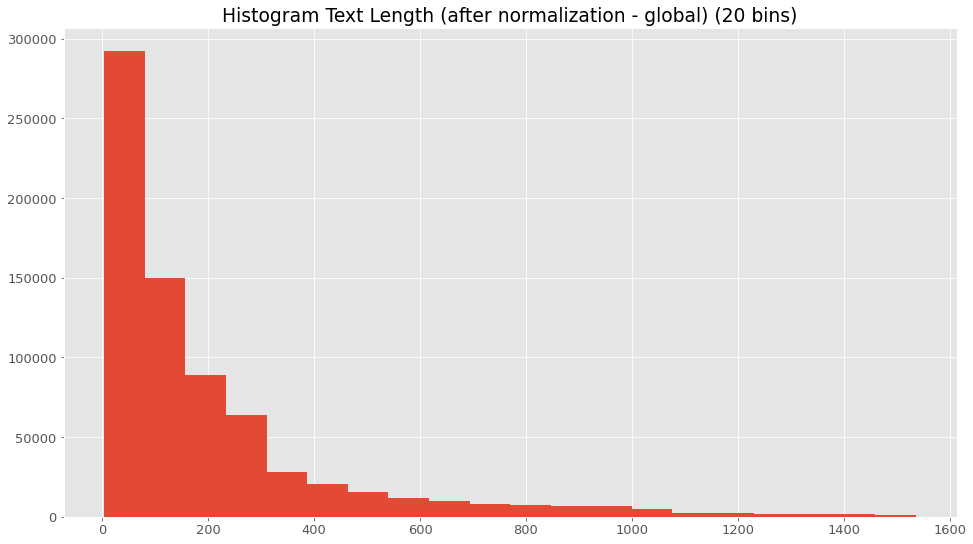

In [102]:
textLengthHistPlotter(outputFilename = "meta-text-length-hist.svg")

### Word Clouds

- ``targetDataFrame``: DataFrame
- ``outputFilename``: filename in outputdir (set "" == no output file)
- ``filterList``: Exclude list
- ``flagShow``: Set true == show wordcloud
- ``configPlotWidth``: e.g. 1920
- ``configPlotHeight``: e.g. 1080

In [103]:
# param rowID e.g. ftTdSafeText
def gloGenerateTextFromChat(df, rowID):
    df = df.copy()
    df = df[df.ftQrIsValidText == True]
    
    # Iterate over text (global text from group)
    textList = []
    for index, row in df.iterrows():
        textList.append(" " + row[rowID])
        
    textString = ''.join(textList)

    return textString

In [104]:
# TODO: Context?
# TODO: Improve stop words

def generateWordCloud(targetDataFrame, outputFilename, filterList, flagShow, configPlotWidth, configPlotHeight):
    

    dfMessages = targetDataFrame.copy()
    
    textString = gloGenerateTextFromChat(dfMessages, rowID="ftTdSafeText")
    
    stopWordsList = gloGetStopWordsList(filterList)
    
    # Generate word cloud and save it to file
    wordcloud = WordCloud(
                background_color="black",
                width=configPlotWidth,
                height=configPlotHeight,
                stopwords=stopWordsList
            ).generate(textString)

    if(outputFilename != ""):
        wordcloud.to_file(dir_var_output + outputFilename)
    
    if(flagShow):
        # Show top 20
        print()
        print("Top 20 occ:\n" + str(pd.Series(wordcloud.words_).head(20)))
        print()
        
        # Show word cloud
        print("- Start generate figure")
        plt.figure(figsize=(14, 14))
        plt.imshow(wordcloud, interpolation="bilinear")
        plt.show()
    

#### Über gesamten Chat

Top 20 occ:
Deutschland    1.000000
Menschen       0.819646
Video          0.799214
sagte          0.781532
gibt           0.712770
Polizei        0.600000
Trump          0.598035
geht           0.567387
bereit         0.565029
Corona         0.525344
muessen        0.475049
Berlin         0.467976
ja             0.466012
Wer            0.458939
viele          0.433399
neue           0.426326
sollen         0.425540
Prozent        0.421218
wegen          0.410216
heute          0.409823
dtype: float64

- Start generate figure

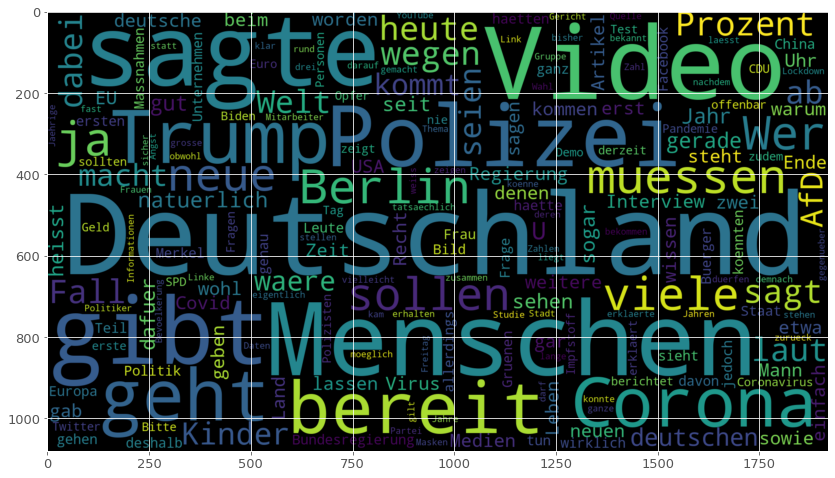

In [105]:
# Oliver Janich öffentlich (public_channel - dataSet0)
generateWordCloud(
    dictMessages["DS-05-01-2021/ChatExport_2021-01-05-janich"],
    "wordcloud-oliver-janich.png",
    [],
    flagShow = True,
    configPlotWidth = 1920,
    configPlotHeight = 1080
)

Top 20 occ:
Folgen ATTILAHILDMANN    1.000000
Deutschland              0.913401
Wolf ATTILAHILDMANN      0.826318
Folg                     0.682632
Menschen                 0.578133
ATTILAHILDMANN           0.522013
Merkel                   0.492501
Corona                   0.441703
NWO                      0.404935
heute                    0.356072
macht                    0.353653
Deutschen                0.352685
gibt                     0.347847
geht                     0.345428
Video                    0.338171
Gate                     0.337687
Korona                   0.330914
ja                       0.324625
China                    0.298984
kommt                    0.284470
dtype: float64

- Start generate figure

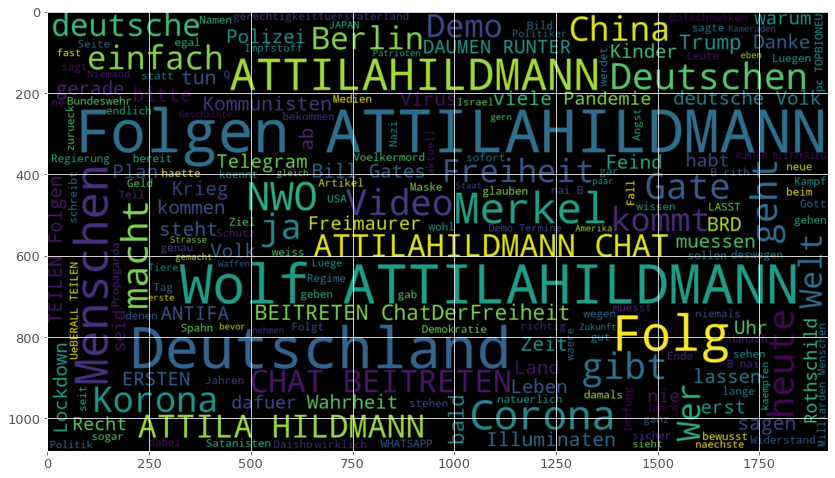

In [106]:
# ATTILA HILDMANN OFFICIAL (public_channel - dataSet0)
if(C_SHORT_RUN == False):
    generateWordCloud(
        dictMessages["DS-05-01-2021/ChatExport_2021-01-05-hildmann"],
        "wordcloud-attila-hildmann.png",
        [],
        flagShow = True,
        configPlotWidth = 1920,
        configPlotHeight = 1080
    )

Top 20 occ:
Menschen       1.000000
Deutschland    0.685354
heute          0.661616
gibt           0.625253
Corona         0.548485
sagte          0.532323
viele          0.498990
Welt           0.495455
geht           0.456566
bereit         0.445455
Zeit           0.442424
Liebe Eva      0.439899
muessen        0.432323
Kinder         0.432323
Video          0.411616
Leben          0.410606
ja             0.376768
Trump          0.340909
macht          0.333333
gerade         0.323737
dtype: float64

- Start generate figure

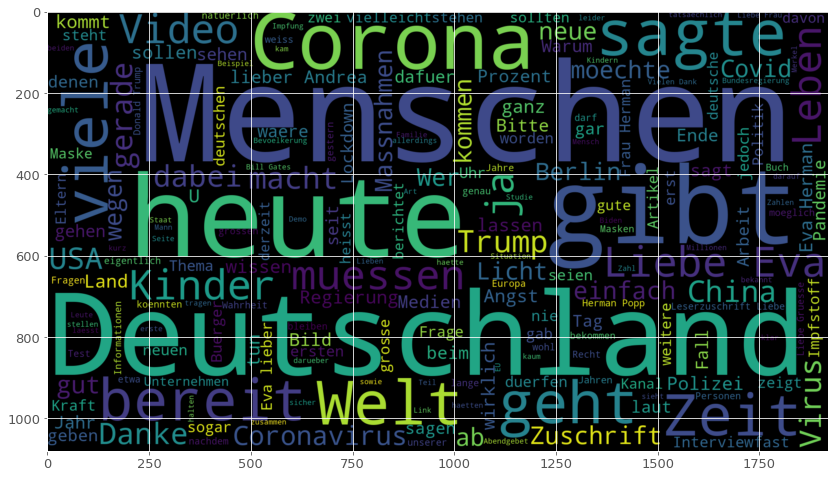

In [107]:
# Eva Herman Offiziell (public_channel - dataSet0)
if(C_SHORT_RUN == False):
    generateWordCloud(
        dictMessages["DS-05-01-2021/ChatExport_2021-01-05-evaherman"],
        "wordcloud-eva-herman.png",
        [],
        flagShow = True,
        configPlotWidth = 1920,
        configPlotHeight = 1080
    )

Top 20 occ:
Xavier Naidoo                1.000000
oneLove Xavier               0.592078
naidoo OneLove               0.437457
Menschen                     0.249131
gibt                         0.173037
Deutschland                  0.165740
Wer                          0.163308
Video                        0.153231
Wahrheit                     0.145240
ja                           0.131689
Liebe                        0.130646
Kinder                       0.128214
Danke                        0.125782
Corona                       0.125434
geht                         0.125087
Bitte                        0.123350
politische bildersprueche    0.120570
Kanaele                      0.104934
heute                        0.104587
viele                        0.103544
dtype: float64

- Start generate figure

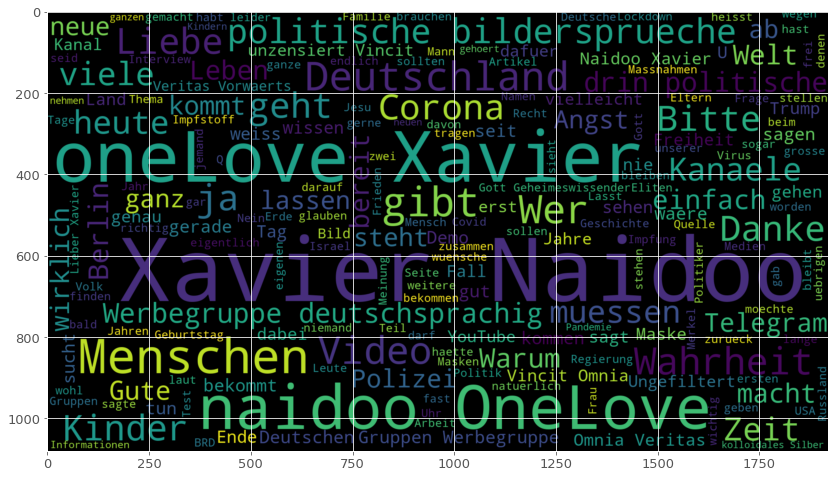

In [108]:
# Xavier Naidoo (public_channel - dataSet0)
if(C_SHORT_RUN == False):
    generateWordCloud(
        dictMessages["DS-05-01-2021/ChatExport_2021-01-05-xavier"],
        "wordcloud-xavier-naidoo.png",
        [],
        flagShow = True,
        configPlotWidth = 1920,
        configPlotHeight = 1080
    )

Top 20 occ:
ja          1.000000
gibt        0.772868
Menschen    0.740310
Demo        0.669767
geht        0.651938
Bitte       0.554070
Wer         0.488953
Berlin      0.481008
Video       0.439922
heute       0.417636
einfach     0.411434
Corona      0.410659
viele       0.400388
muessen     0.396512
Danke       0.391085
Polizei     0.376744
Maske       0.365310
Muenchen    0.352519
kommt       0.352519
gut         0.351744
dtype: float64

- Start generate figure

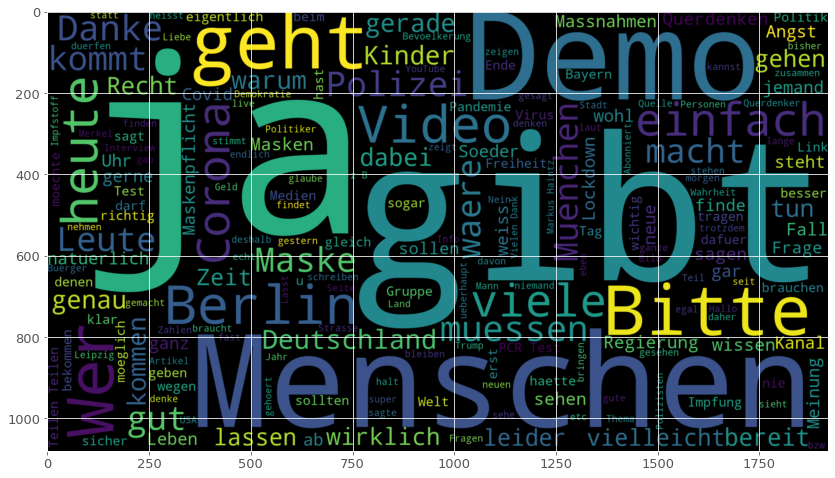

In [109]:
if(C_SHORT_RUN == False):
    if("dataSet2" in C_LOAD_DATASETS):
        generateWordCloud(
            dictMessages["DS-13-01-2021/ChatExport_2021-01-13-querdenken089"],
            "wordcloud-querdenken-089-group.png",
            [],
            flagShow = True,
            configPlotWidth = 1920,
            configPlotHeight = 1080
        )

Top 20 occ:
Bitte          1.000000
Demo           0.755556
Polizei        0.644444
Berlin         0.555556
Uhr            0.511111
Maske          0.466667
Querdenken     0.444444
Corona         0.422222
Video          0.422222
heute          0.400000
Versammlung    0.355556
geht           0.355556
Flyer          0.333333
Eltern         0.333333
gibt           0.333333
Schule         0.311111
Dr             0.311111
ja             0.311111
Attest         0.311111
Wer            0.288889
dtype: float64

- Start generate figure

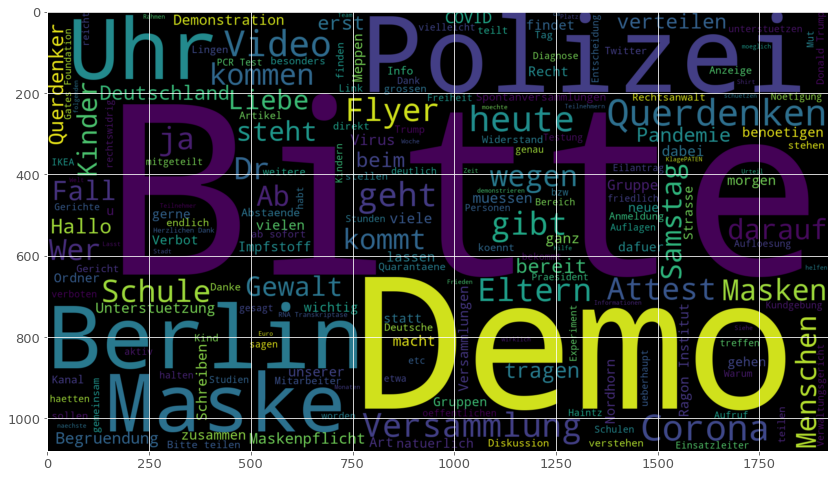

In [110]:
if(C_SHORT_RUN == False):
    if("dataSet2" in C_LOAD_DATASETS):
        generateWordCloud(
            dictMessages["DS-13-01-2021/ChatExport_2021-01-13-querdenken591Info"],
            "wordcloud-querdenken-591-info.png",
            [],
            flagShow = True,
            configPlotWidth = 1920,
            configPlotHeight = 1080
        )

Top 20 occ:
ja            1.000000
bitte         0.920518
Demo          0.918669
gibt          0.916821
Hallo         0.726433
Menschen      0.724584
geht          0.722736
Danke         0.683919
Berlin        0.682070
Corona        0.632163
Wer           0.609982
Gruppe        0.585952
Video         0.552680
heute         0.517560
Uhr           0.497227
gerne         0.486137
dabei         0.441774
gut           0.439926
Querdenken    0.434381
viele         0.428835
dtype: float64

- Start generate figure

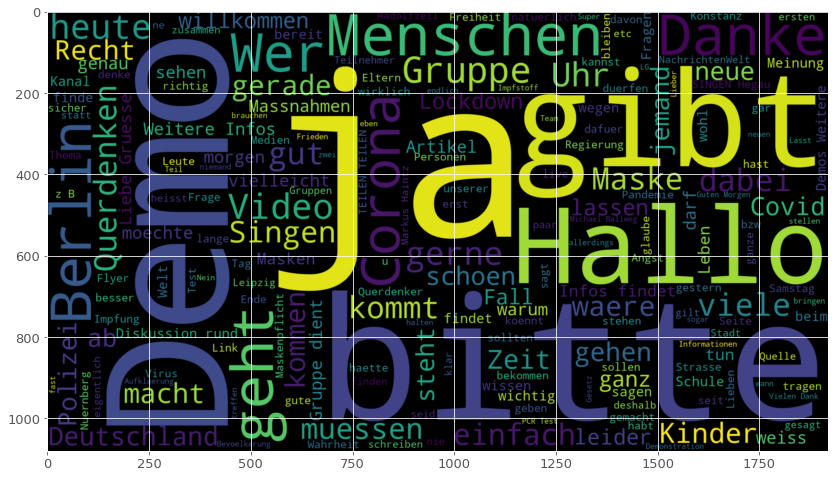

In [111]:
if(C_SHORT_RUN == False):
    if("dataSet2" in C_LOAD_DATASETS):
        generateWordCloud(
            dictMessages["DS-13-01-2021/ChatExport_2021-01-13-querdenken773"],
            "wordcloud-querdenken-773-group.png",
            [],
            flagShow = True,
            configPlotWidth = 1920,
            configPlotHeight = 1080
        )

Top 20 occ:
Bitte            1.000000
Singen           0.809524
Danke            0.714286
Wer              0.666667
Info             0.523810
Flyer            0.523810
gibt             0.523810
Kanal            0.476190
Uhr              0.476190
Liebe Gruesse    0.476190
Maske            0.428571
Menschen         0.428571
Aktionen         0.380952
Aktion           0.380952
Hallo            0.380952
Corona           0.380952
TEILEN           0.380952
Kerzen           0.380952
unserer          0.333333
moechte          0.333333
dtype: float64

- Start generate figure

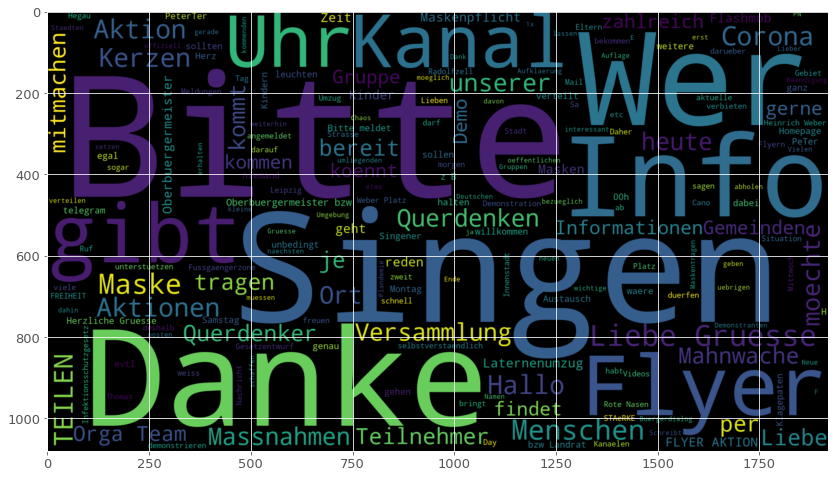

In [112]:
if(C_SHORT_RUN == False):
    if("dataSet2" in C_LOAD_DATASETS):
        generateWordCloud(
            dictMessages["DS-13-01-2021/ChatExport_2021-01-13-querdenken773Info"],
            "wordcloud-querdenken-773-info.png",
            [],
            flagShow = True,
            configPlotWidth = 1920,
            configPlotHeight = 1080
        )

Top 20 occ:
Demo          1.000000
bitte         0.746988
Stuttgart     0.409639
Ordner        0.409639
heute         0.403614
QUERDENKEN    0.373494
Samstag       0.301205
Gruppe        0.283133
Danke         0.283133
gerne         0.265060
morgen        0.259036
Video         0.259036
Berlin        0.234940
Menschen      0.222892
gibt          0.222892
Info          0.216867
dabei         0.210843
ja            0.204819
Hallo         0.204819
Teilnehmer    0.204819
dtype: float64

- Start generate figure

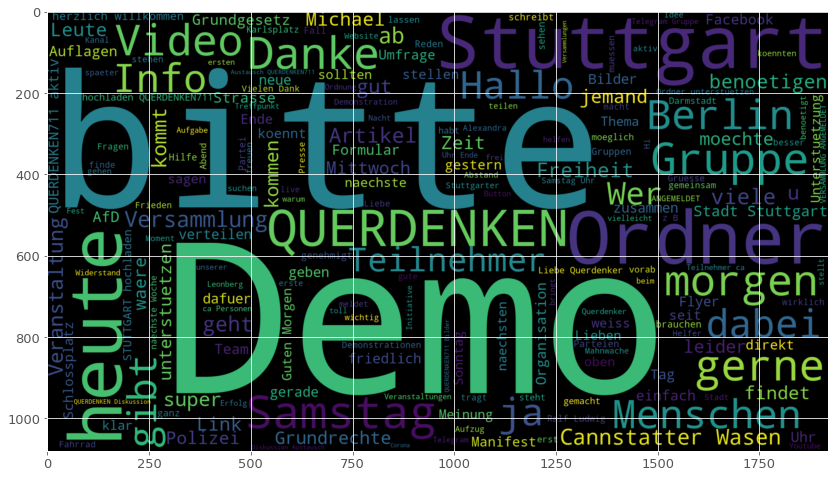

In [113]:
if(C_SHORT_RUN == False):
    if("dataSet2" in C_LOAD_DATASETS):
        generateWordCloud(
            dictMessages["DS-13-01-2021/ChatExport_2021-01-13-querdenken711"],
            "wordcloud-querdenken-711-group.png",
            [],
            flagShow = True,
            configPlotWidth = 1920,
            configPlotHeight = 1080
        )

Top 20 occ:
Demo                       1.000000
Video                      0.834875
QUERDENKEN711 aktiv        0.742404
STUTTGART hochladen        0.741083
hochladen QUERDENKEN711    0.739762
QUERDENKEN Diskussion      0.684280
Diskussion Austausch       0.684280
Austausch QUERDENKEN711    0.684280
QUERDENKEN711 Bilder       0.684280
via QUERDENKEN             0.371202
STUTTGART                  0.191546
Bitte                      0.174373
aktiv QUERDENKEN           0.138705
Berlin                     0.117569
Michael Ballweg            0.114927
Uhr                        0.104359
aktiv edited               0.103038
Freiheit                   0.095112
Grundgesetz                0.087186
Menschen                   0.087186
dtype: float64

- Start generate figure

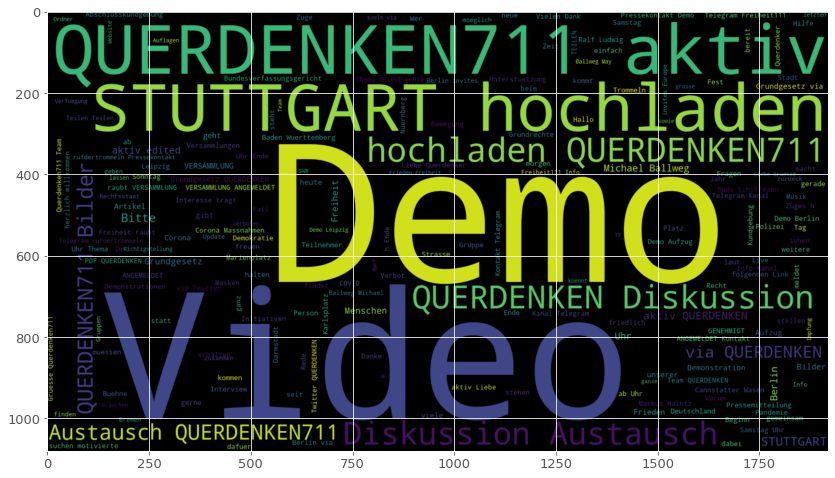

In [114]:
if(C_SHORT_RUN == False):
    if("dataSet2" in C_LOAD_DATASETS):
        generateWordCloud(
            dictMessages["DS-13-01-2021/ChatExport_2021-01-13-querdenken711Info"],
            "wordcloud-querdenken-711-info.png",
            [],
            flagShow = True,
            configPlotWidth = 1920,
            configPlotHeight = 1080
        )

Top 20 occ:
ja           1.000000
Menschen     0.659995
gibt         0.616493
Demo         0.512677
geht         0.508140
Berlin       0.386442
Wer          0.376568
Frankfurt    0.370163
Danke        0.362423
Polizei      0.355218
muessen      0.337337
heute        0.334401
gut          0.330931
einfach      0.329597
Bitte        0.326128
viele        0.323459
Leute        0.321324
Corona       0.310115
macht        0.294102
kommt        0.286096
dtype: float64

- Start generate figure

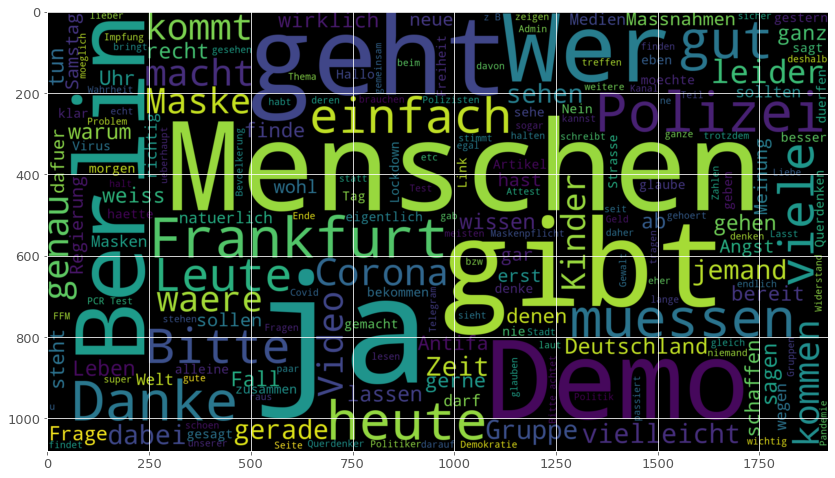

In [115]:
if(C_SHORT_RUN == False):
    if("dataSet2" in C_LOAD_DATASETS):
        generateWordCloud(
            dictMessages["DS-13-01-2021/ChatExport_2021-01-13-querdenken69"],
            "wordcloud-querdenken-69-group.png",
            [],
            flagShow = True,
            configPlotWidth = 1920,
            configPlotHeight = 1080
        )

Top 20 occ:
Frankfurt      1.000000
bitte          0.951220
Demo           0.914634
Uhr            0.841463
Querdenken     0.707317
Berlin         0.512195
Samstag        0.500000
gemeinsam      0.414634
freuen         0.365854
Info           0.304878
unserer        0.304878
Stadt          0.292683
Corona         0.292683
Lieben         0.292683
Versammlung    0.256098
Flyer          0.256098
beim           0.256098
Polizei        0.256098
ab             0.243902
Ordner         0.243902
dtype: float64

- Start generate figure

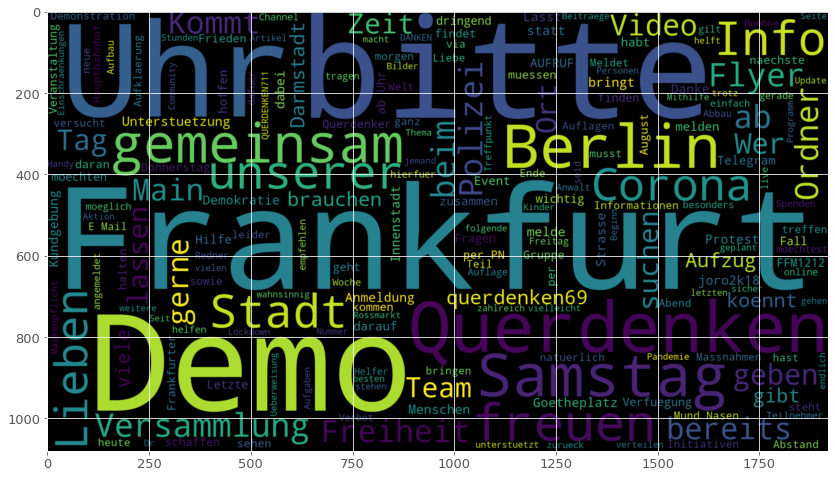

In [116]:
if(C_SHORT_RUN == False):
    if("dataSet2" in C_LOAD_DATASETS):
        generateWordCloud(
            dictMessages["DS-13-01-2021/ChatExport_2021-01-13-querdenken69Info"],
            "wordcloud-querdenken-69-info.png",
            [],
            flagShow = True,
            configPlotWidth = 1920,
            configPlotHeight = 1080
        )

#### Zeitlicher Verlauf

##### Bestimmter Zeitraum aus DataFrame und Perioden berechnen

In [117]:
def extractTimePeriodDataFrame(df, timeStart, timeStop):

    #print("- Got Start " + str(timeStart) + " and Stop " + str(timeStop))

    df = df.copy()
    df["date"] = pd.to_datetime(df["date"])
    
    dfNew = df[df.date <= timeStop]
    dfNew = dfNew[dfNew.date >= timeStart]

    dfNew = dfNew.set_index("date")
    dfNew = dfNew.sort_index()

    return dfNew

##### Perioden berechnen

In [118]:
def generateWCPeriod():
    return list(pd.date_range( #m/d/y
            start='1/1/2018',
            end='2/1/2021',
            #freq="W-MON",
            freq="1M"
            ))

##### Wrapper

- ``fP``: filePath
- ``label``: e.g. chatName
- ``filterList``: additional stopWords

In [119]:
def generateWordCloudAuto(fP, label, filterList):

    gloStartStopwatch("Generate World Cloud Auto >>" + fP + "<<")

    periods = generateWCPeriod()

    dictSaved = {}

    prevStart = periods[0]

    for period in periods:

        stop = period

        e = extractTimePeriodDataFrame(dictMessages[fP], timeStart = prevStart, timeStop = stop)

        if(prevStart != stop and len(e.index) > 0):
            fileName = "autoWordCloud/" + queryChatName(fP) + "-" + str(prevStart) + "-" + str(stop) + ".png"
            generateWordCloud(
                e,
                fileName,
                filterList,
                flagShow = False,
                configPlotWidth = 1280,
                configPlotHeight = 720
            )
            #print("- Save file " + fileName)
            dictSaved[fileName] = str(prevStart) + " - " + str(stop)

        """
        else:
            print("- Start and Stop equal or no message found")
        """

        prevStart = stop

    gloWriteDictToFile("auto-wordcloud-" + label + ".csv", dictSaved)

    gloStopStopwatch("Generate World Cloud Auto >>" + fP + "<<")

##### Anwenden auf DataSet0

In [120]:
if(C_SHORT_RUN == False):
    generateWordCloudAuto(
        fP = "DS-05-01-2021/ChatExport_2021-01-05-janich",
        label = "oliver-janich",
        filterList = []
    )

[Stopwatch started >>Generate World Cloud Auto >>DS-05-01-2021/ChatExport_2021-01-05-janich<<<<]

[Stopwatch stopped >>Generate World Cloud Auto >>DS-05-01-2021/ChatExport_2021-01-05-janich<<<< (76.026s)]

In [121]:
if(C_SHORT_RUN == False):
    generateWordCloudAuto(
        fP = "DS-05-01-2021/ChatExport_2021-01-05-hildmann",
        label = "attila-hildmann",
        filterList = []
    )

[Stopwatch started >>Generate World Cloud Auto >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<<<]

[Stopwatch stopped >>Generate World Cloud Auto >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<<< (29.726s)]

In [122]:
if(C_SHORT_RUN == False):
    generateWordCloudAuto(
        fP = "DS-05-01-2021/ChatExport_2021-01-05-evaherman",
        label = "eva-herman",
        filterList = []
    )

[Stopwatch started >>Generate World Cloud Auto >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<<<]

[Stopwatch stopped >>Generate World Cloud Auto >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<<< (42.969s)]

In [123]:
if(C_SHORT_RUN == False):
    generateWordCloudAuto(
        fP = "DS-05-01-2021/ChatExport_2021-01-05-xavier",
        label = "xavier-naidoo",
        filterList = []
    )

[Stopwatch started >>Generate World Cloud Auto >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<<<]

[Stopwatch stopped >>Generate World Cloud Auto >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<<< (25.080s)]

### N Grams

#### Text zu N Gram

In [124]:
def generateNGram(text, n):
    # https://albertauyeung.github.io/2018/06/03/generating-ngrams.html
    text = text.lower()
    text = re.sub(r'[^a-zA-Z0-9\s]', ' ', text)
    tokens = [token for token in text.split(" ") if token != ""]
    
    return list(ngrams(tokens, n))

##### Beispiele (1-3)

In [125]:
sampleText = "Mir geht es heute gut!"
sampleText

'Mir geht es heute gut!'

In [126]:
generateNGram(sampleText, 1)

[('mir',), ('geht',), ('es',), ('heute',), ('gut',)]

In [127]:
generateNGram(sampleText, 2)

[('mir', 'geht'), ('geht', 'es'), ('es', 'heute'), ('heute', 'gut')]

In [128]:
generateNGram(sampleText, 3)

[('mir', 'geht', 'es'), ('geht', 'es', 'heute'), ('es', 'heute', 'gut')]

#### Top N grams pro Chat

##### Implementierung

In [129]:
def generateNGramChat(fP, n, mostCommon):
    return Counter(
        generateNGram(
            gloGenerateTextFromChat(dictMessages[fP], rowID="ftTdSafeText"),
            n = n
        )
    ).most_common(mostCommon)

In [130]:
def generateNGramAuto(filePathList, n, mostCommon):
    for fP in filePathList:

        print()
        print("Analyse now >>" + fP + "<<")

        c = generateNGramChat(
            fP,
            n = n,
            mostCommon = mostCommon
        )

        print ("\n".join(map(str, c)))

##### Angwendet auf DataSet 0

In [131]:
generateNGramAuto(
    dfInputFiles[dfInputFiles.inputLabel == "dataSet0"].inputPath,
    n = 2,
    mostCommon = 10
)

Analyse now >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<

(('folgen', 'attilahildmann'), 2066)
(('dem', 'wolf'), 1709)
(('wolf', 'attilahildmann'), 1708)
(('folg', 'dem'), 1707)
(('in', 'der'), 1339)
(('und', 'die'), 998)
(('fuer', 'die'), 806)
(('in', 'den'), 805)
(('es', 'ist'), 797)
(('auf', 'die'), 563)

Analyse now >>DS-05-01-2021/ChatExport_2021-01-05-janich<<

(('in', 'der'), 4109)
(('in', 'den'), 2352)
(('fuer', 'die'), 2182)
(('dass', 'die'), 1621)
(('und', 'die'), 1611)
(('von', 'der'), 1368)
(('auf', 'die'), 1338)
(('mit', 'dem'), 1265)
(('mit', 'der'), 1251)
(('in', 'deutschland'), 1212)

Analyse now >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<

(('in', 'der'), 3068)
(('in', 'den'), 1785)
(('fuer', 'die'), 1508)
(('und', 'die'), 1284)
(('auf', 'die'), 1084)
(('mit', 'dem'), 1001)
(('dass', 'die'), 980)
(('von', 'der'), 952)
(('ueber', 'die'), 876)
(('liebe', 'eva'), 871)

Analyse now >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<

(('xavier', 'naidoo'), 2876)
(('onelove', 'xavier'), 1704)
(('naidoo', 'onelove'), 1259)
(('in', 'der'), 714)
(('in', 'den'), 398)
(('und', 'die'), 367)
(('fuer', 'die'), 365)
(('es', 'ist'), 363)
(('politische', 'bildersprueche'), 347)
(('das', 'ist'), 320)

In [132]:
generateNGramAuto(
    dfInputFiles[dfInputFiles.inputLabel == "dataSet0"].inputPath,
    n = 3,
    mostCommon = 10
)

Analyse now >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<

(('dem', 'wolf', 'attilahildmann'), 1708)
(('folg', 'dem', 'wolf'), 1707)
(('attilahildmann', 'chat', 'beitreten'), 505)
(('wolf', 'attilahildmann', 'chat'), 501)
(('chat', 'beitreten', 'chatderfreiheit'), 499)
(('das', 'deutsche', 'volk'), 340)
(('teilen', 'folgen', 'attilahildmann'), 326)
(('folgt', 'uns', 'auf'), 211)
(('uns', 'auf', 'gerechtigkeitfuersvaterland'), 207)
(('auf', 'die', 'strasse'), 184)

Analyse now >>DS-05-01-2021/ChatExport_2021-01-05-janich<<

(('in', 'den', 'usa'), 247)
(('im', 'premium', 'kanal'), 203)
(('kommentierung', 'meiner', 'videos'), 198)
(('und', 'kommentierung', 'meiner'), 194)
(('meiner', 'videos', 'im'), 194)
(('videos', 'im', 'premium'), 194)
(('fruehzugriff', 'und', 'kommentierung'), 192)
(('sars', 'cov', '2'), 190)
(('die', 'zahl', 'der'), 181)
(('exklusive', 'inhalte', 'fruehzugriff'), 181)

Analyse now >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<

(('eva', 'lieber', 'andreas'), 384)
(('liebe', 'eva', 'lieber'), 383)
(('zuschrift', 'einer', 'leserin'), 313)
(('leserzuschrift', 'liebe', 'eva'), 250)
(('in', 'den', 'usa'), 226)
(('liebe', 'frau', 'herman'), 216)
(('vielen', 'dank', 'fuer'), 191)
(('um', '21', '30'), 185)
(('einer', 'leserin', 'liebe'), 168)
(('im', 'lichte', 'der'), 165)

Analyse now >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<

(('onelove', 'xavier', 'naidoo'), 1697)
(('xavier', 'naidoo', 'onelove'), 1259)
(('naidoo', 'onelove', 'xavier'), 494)
(('kanaele', 'und', 'gruppen'), 271)
(('einmal', 'hin', 'alles'), 271)
(('hin', 'alles', 'drin'), 271)
(('unsere', 'kanaele', 'und'), 270)
(('alles', 'drin', 'politische'), 270)
(('drin', 'politische', 'bildersprueche'), 270)
(('und', 'gruppen', 'werbegruppe'), 212)

In [133]:
generateNGramAuto(
    dfInputFiles[dfInputFiles.inputLabel == "dataSet0"].inputPath,
    n = 4,
    mostCommon = 10
)

Analyse now >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<

(('folg', 'dem', 'wolf', 'attilahildmann'), 1707)
(('dem', 'wolf', 'attilahildmann', 'chat'), 501)
(('wolf', 'attilahildmann', 'chat', 'beitreten'), 501)
(('attilahildmann', 'chat', 'beitreten', 'chatderfreiheit'), 497)
(('folgt', 'uns', 'auf', 'gerechtigkeitfuersvaterland'), 207)
(('b', 'nai', 'b', 'rith'), 179)
(('zum', 'ersten', 'mal', 'bei'), 166)
(('ersten', 'mal', 'bei', 'mir'), 166)
(('die', 'zum', 'ersten', 'mal'), 153)
(('5', 'gutschein', 'fuer', 'alle'), 152)

Analyse now >>DS-05-01-2021/ChatExport_2021-01-05-janich<<

(('und', 'kommentierung', 'meiner', 'videos'), 194)
(('kommentierung', 'meiner', 'videos', 'im'), 194)
(('meiner', 'videos', 'im', 'premium'), 194)
(('videos', 'im', 'premium', 'kanal'), 194)
(('fruehzugriff', 'und', 'kommentierung', 'meiner'), 191)
(('exklusive', 'inhalte', 'fruehzugriff', 'und'), 179)
(('inhalte', 'fruehzugriff', 'und', 'kommentierung'), 179)
(('meinen', 'neuen', 'telegram', 'kanal'), 155)
(('abonniert', 'bitte', 'meinen', 'neuen'), 153)
(('bitte', 'meinen', 'neuen', 'telegram'), 153)

Analyse now >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<

(('liebe', 'eva', 'lieber', 'andreas'), 380)
(('zuschrift', 'einer', 'leserin', 'liebe'), 168)
(('im', 'lichte', 'der', 'wahrheit'), 164)
(('einer', 'leserin', 'liebe', 'eva'), 128)
(('um', '21', '30', 'uhr'), 128)
(('leserzuschrift', 'liebe', 'eva', 'lieber'), 123)
(('danke', 'fuer', 'euer', 'licht'), 86)
(('sehr', 'geehrte', 'frau', 'herman'), 81)
(('us', 'praesident', 'donald', 'trump'), 79)
(('eva', 'lieber', 'andreas', 'ich'), 76)

Analyse now >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<

(('xavier', 'naidoo', 'onelove', 'xavier'), 494)
(('naidoo', 'onelove', 'xavier', 'naidoo'), 487)
(('onelove', 'xavier', 'naidoo', 'onelove'), 469)
(('einmal', 'hin', 'alles', 'drin'), 271)
(('unsere', 'kanaele', 'und', 'gruppen'), 270)
(('hin', 'alles', 'drin', 'politische'), 270)
(('alles', 'drin', 'politische', 'bildersprueche'), 270)
(('kanaele', 'und', 'gruppen', 'werbegruppe'), 212)
(('und', 'gruppen', 'werbegruppe', 'deutschsprachig'), 212)
(('gruppen', 'werbegruppe', 'deutschsprachig', 'einmal'), 212)

In [134]:
generateNGramAuto(
    dfInputFiles[dfInputFiles.inputLabel == "dataSet0"].inputPath,
    n = 5,
    mostCommon = 10
)

Analyse now >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<

(('folg', 'dem', 'wolf', 'attilahildmann', 'chat'), 501)
(('dem', 'wolf', 'attilahildmann', 'chat', 'beitreten'), 501)
(('wolf', 'attilahildmann', 'chat', 'beitreten', 'chatderfreiheit'), 493)
(('zum', 'ersten', 'mal', 'bei', 'mir'), 166)
(('die', 'zum', 'ersten', 'mal', 'bei'), 152)
(('gutschein', 'fuer', 'alle', 'die', 'zum'), 149)
(('fuer', 'alle', 'die', 'zum', 'ersten'), 149)
(('alle', 'die', 'zum', 'ersten', 'mal'), 149)
(('5', 'gutschein', 'fuer', 'alle', 'die'), 148)
(('ersten', 'mal', 'bei', 'mir', 'bestellen'), 145)

Analyse now >>DS-05-01-2021/ChatExport_2021-01-05-janich<<

(('kommentierung', 'meiner', 'videos', 'im', 'premium'), 194)
(('meiner', 'videos', 'im', 'premium', 'kanal'), 194)
(('fruehzugriff', 'und', 'kommentierung', 'meiner', 'videos'), 191)
(('und', 'kommentierung', 'meiner', 'videos', 'im'), 190)
(('exklusive', 'inhalte', 'fruehzugriff', 'und', 'kommentierung'), 179)
(('inhalte', 'fruehzugriff', 'und', 'kommentierung', 'meiner'), 179)
(('abonniert', 'bitte', 'meinen', 'neuen', 'telegram'), 153)
(('bitte', 'meinen', 'neuen', 'telegram', 'kanal'), 153)
(('denkt', 'dran', 'denkt', 'selbst', 'faktenfriedenfreiheit'), 83)
(('traumurlaub', 'auf', 'den', 'philippinen', 'mit'), 45)

Analyse now >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<

(('zuschrift', 'einer', 'leserin', 'liebe', 'eva'), 128)
(('leserzuschrift', 'liebe', 'eva', 'lieber', 'andreas'), 122)
(('liebe', 'eva', 'lieber', 'andreas', 'ich'), 75)
(('euer', 'licht', 'und', 'eure', 'liebe'), 67)
(('danke', 'fuer', 'euer', 'licht', 'und'), 63)
(('fuer', 'euer', 'licht', 'und', 'eure'), 63)
(('liebe', 'frau', 'herman', 'lieber', 'herr'), 55)
(('frau', 'herman', 'lieber', 'herr', 'popp'), 55)
(('leserin', 'liebe', 'eva', 'lieber', 'andreas'), 54)
(('werk', 'im', 'lichte', 'der', 'wahrheit'), 54)

Analyse now >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<

(('xavier', 'naidoo', 'onelove', 'xavier', 'naidoo'), 487)
(('onelove', 'xavier', 'naidoo', 'onelove', 'xavier'), 379)
(('einmal', 'hin', 'alles', 'drin', 'politische'), 270)
(('hin', 'alles', 'drin', 'politische', 'bildersprueche'), 270)
(('naidoo', 'onelove', 'xavier', 'naidoo', 'onelove'), 259)
(('unsere', 'kanaele', 'und', 'gruppen', 'werbegruppe'), 212)
(('kanaele', 'und', 'gruppen', 'werbegruppe', 'deutschsprachig'), 212)
(('und', 'gruppen', 'werbegruppe', 'deutschsprachig', 'einmal'), 212)
(('gruppen', 'werbegruppe', 'deutschsprachig', 'einmal', 'hin'), 212)
(('werbegruppe', 'deutschsprachig', 'einmal', 'hin', 'alles'), 212)

In [135]:
generateNGramAuto(
    dfInputFiles[dfInputFiles.inputLabel == "dataSet0"].inputPath,
    n = 6,
    mostCommon = 10
)

Analyse now >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<

(('folg', 'dem', 'wolf', 'attilahildmann', 'chat', 'beitreten'), 501)
(('dem', 'wolf', 'attilahildmann', 'chat', 'beitreten', 'chatderfreiheit'), 493)
(('die', 'zum', 'ersten', 'mal', 'bei', 'mir'), 152)
(('gutschein', 'fuer', 'alle', 'die', 'zum', 'ersten'), 149)
(('fuer', 'alle', 'die', 'zum', 'ersten', 'mal'), 149)
(('5', 'gutschein', 'fuer', 'alle', 'die', 'zum'), 148)
(('alle', 'die', 'zum', 'ersten', 'mal', 'bei'), 148)
(('zum', 'ersten', 'mal', 'bei', 'mir', 'bestellen'), 145)
(('ersten', 'mal', 'bei', 'mir', 'bestellen', 'pc'), 125)
(('mal', 'bei', 'mir', 'bestellen', 'pc', 'topbioneu'), 125)

Analyse now >>DS-05-01-2021/ChatExport_2021-01-05-janich<<

(('kommentierung', 'meiner', 'videos', 'im', 'premium', 'kanal'), 194)
(('und', 'kommentierung', 'meiner', 'videos', 'im', 'premium'), 190)
(('fruehzugriff', 'und', 'kommentierung', 'meiner', 'videos', 'im'), 187)
(('exklusive', 'inhalte', 'fruehzugriff', 'und', 'kommentierung', 'meiner'), 179)
(('inhalte', 'fruehzugriff', 'und', 'kommentierung', 'meiner', 'videos'), 179)
(('abonniert', 'bitte', 'meinen', 'neuen', 'telegram', 'kanal'), 153)
(('traumurlaub', 'auf', 'den', 'philippinen', 'mit', 'gutscheincode'), 45)
(('auf', 'den', 'philippinen', 'mit', 'gutscheincode', 'oliver'), 45)
(('den', 'philippinen', 'mit', 'gutscheincode', 'oliver', 'erhaltet'), 45)
(('philippinen', 'mit', 'gutscheincode', 'oliver', 'erhaltet', 'ihr'), 45)

Analyse now >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<

(('fuer', 'euer', 'licht', 'und', 'eure', 'liebe'), 63)
(('danke', 'fuer', 'euer', 'licht', 'und', 'eure'), 61)
(('liebe', 'frau', 'herman', 'lieber', 'herr', 'popp'), 55)
(('zuschrift', 'einer', 'leserin', 'liebe', 'eva', 'lieber'), 53)
(('einer', 'leserin', 'liebe', 'eva', 'lieber', 'andreas'), 53)
(('werk', 'im', 'lichte', 'der', 'wahrheit', 'gralsbotschaft'), 52)
(('des', 'werkes', 'im', 'lichte', 'der', 'wahrheit'), 51)
(('das', 'dreibaendige', 'werk', 'im', 'lichte', 'der'), 51)
(('dreibaendige', 'werk', 'im', 'lichte', 'der', 'wahrheit'), 51)
(('im', 'lichte', 'der', 'wahrheit', 'gralsbotschaft', 'von'), 50)

Analyse now >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<

(('onelove', 'xavier', 'naidoo', 'onelove', 'xavier', 'naidoo'), 376)
(('einmal', 'hin', 'alles', 'drin', 'politische', 'bildersprueche'), 270)
(('xavier', 'naidoo', 'onelove', 'xavier', 'naidoo', 'onelove'), 259)
(('unsere', 'kanaele', 'und', 'gruppen', 'werbegruppe', 'deutschsprachig'), 212)
(('kanaele', 'und', 'gruppen', 'werbegruppe', 'deutschsprachig', 'einmal'), 212)
(('und', 'gruppen', 'werbegruppe', 'deutschsprachig', 'einmal', 'hin'), 212)
(('gruppen', 'werbegruppe', 'deutschsprachig', 'einmal', 'hin', 'alles'), 212)
(('werbegruppe', 'deutschsprachig', 'einmal', 'hin', 'alles', 'drin'), 212)
(('deutschsprachig', 'einmal', 'hin', 'alles', 'drin', 'politische'), 212)
(('naidoo', 'onelove', 'xavier', 'naidoo', 'onelove', 'xavier'), 169)

### POS-Tagging (Eigennamen)

#### Implementierung

In [136]:
# param outputFilename, if "" - no output
def plotFreqNouns(inputText, outputFilename, mostCommon, flagRemoveStopwords):
    # https://textmining.wp.hs-hannover.de/Preprocessing.html
    nouns = []
    sentences_tok = [nltk.tokenize.word_tokenize(sent) for sent in getTokenFromText(inputText)]

    for sent in sentences_tok:
        tags = hanoverTagger.tag_sent(sent) 
        nouns_from_sent = [lemma for (word,lemma,pos) in tags if pos == "NE"] # pos == "NN" or 
        nouns.extend(nouns_from_sent)

    pNouns = list()

    if(flagRemoveStopwords):

        print("- Warn: remove stopWords")
        stopWords = gloGetStopWordsList(filterList = list())
        for n in nouns:
            if n.lower() not in stopWords:
                pNouns.append(n)

    else:
        pNouns = nouns

    # Thank you https://stackoverflow.com/questions/52908305/how-to-save-a-nltk-freqdist-plot
    fig = plt.figure(figsize = (16,9))
    plt.gcf().subplots_adjust(bottom=0.15)

    fdist = nltk.FreqDist(pNouns)    

    fdist.plot(mostCommon,cumulative=False)

    _ = plt.show()

    if(outputFilename != ""):
        fig.savefig(dir_var_output + outputFilename, bbox_inches="tight")

##### Beispiel

In [137]:
sampleText = "Ich denke an Eis in München. Das ist ein guter Beispielstext aus München. An diesem tollen Text werde ich nun einige Verfahren anwenden! Ich wohne in der Nähe von München und esse gerne Eis."
sampleText

'Ich denke an Eis in München. Das ist ein guter Beispielstext aus München. An diesem tollen Text werde ich nun einige Verfahren anwenden! Ich wohne in der Nähe von München und esse gerne Eis.'

- Warn: remove stopWords

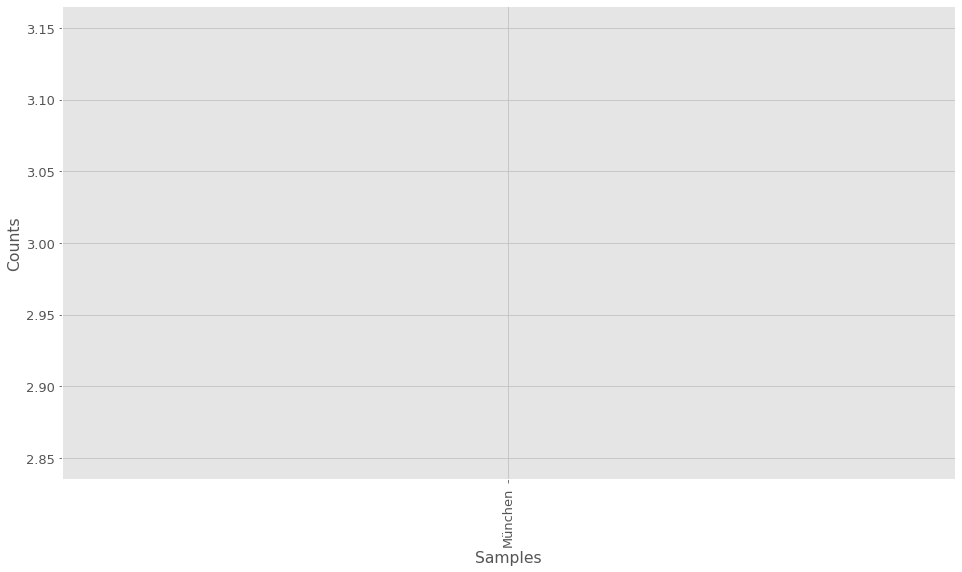

In [138]:
plotFreqNouns(sampleText, outputFilename = "", mostCommon = 10, flagRemoveStopwords = True)

#### Über einen gesamten Chat

In [139]:
def generateFreqNounsPlot(fP, mostCommon, outputFilename):

    gloStartStopwatch("Generate text")
    df = dictMessages[fP].copy()
    inputText = gloGenerateTextFromChat(df, "ftTdCleanText")
    gloStopStopwatch("Generate text")

    gloStartStopwatch("Process data")
    plotFreqNouns(inputText, outputFilename=outputFilename, mostCommon=mostCommon, flagRemoveStopwords=True)
    gloStopStopwatch("Process data")

##### Angewendet auf DataSet0

[Stopwatch started >>Generate text<<]

[Stopwatch stopped >>Generate text<< (3.585s)]

[Stopwatch started >>Process data<<]

- Warn: remove stopWords

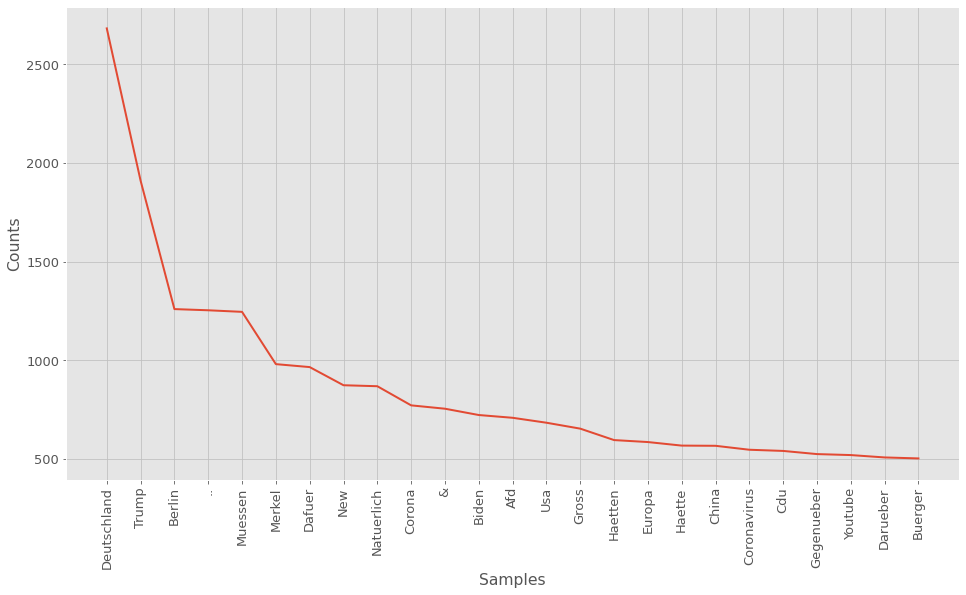

[Stopwatch stopped >>Process data<< (939.289s)]

In [140]:
if(C_SHORT_RUN == False):
    generateFreqNounsPlot("DS-05-01-2021/ChatExport_2021-01-05-janich", mostCommon=25, outputFilename = "freq-nouns-oliver-janich.svg")

[Stopwatch started >>Generate text<<]

[Stopwatch stopped >>Generate text<< (2.685s)]

[Stopwatch started >>Process data<<]

- Warn: remove stopWords

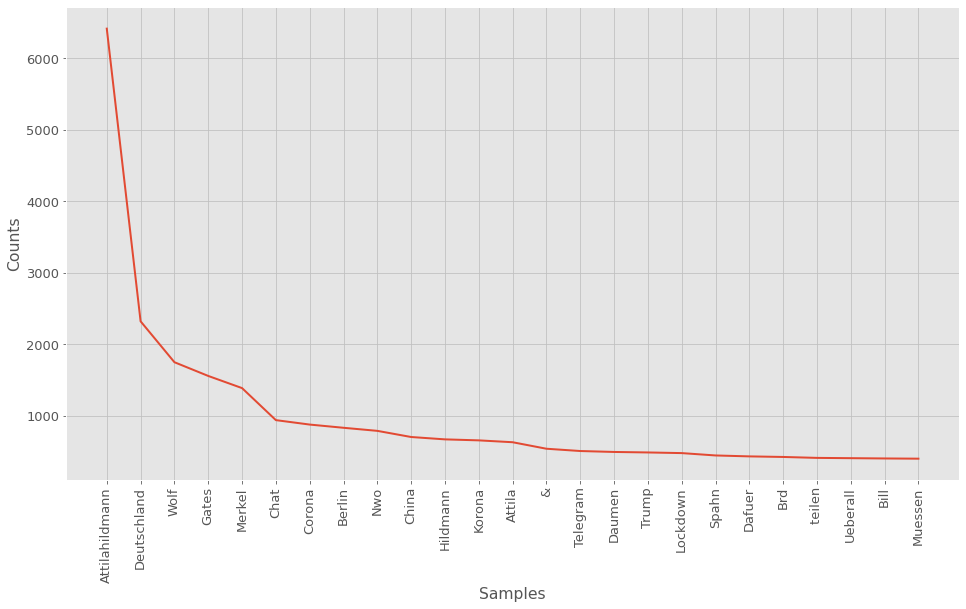

[Stopwatch stopped >>Process data<< (377.013s)]

In [141]:
if(C_SHORT_RUN == False):
    generateFreqNounsPlot("DS-05-01-2021/ChatExport_2021-01-05-hildmann", mostCommon=25, outputFilename = "freq-nouns-attila-hildmann.svg")

[Stopwatch started >>Generate text<<]

[Stopwatch stopped >>Generate text<< (1.702s)]

[Stopwatch started >>Process data<<]

- Warn: remove stopWords

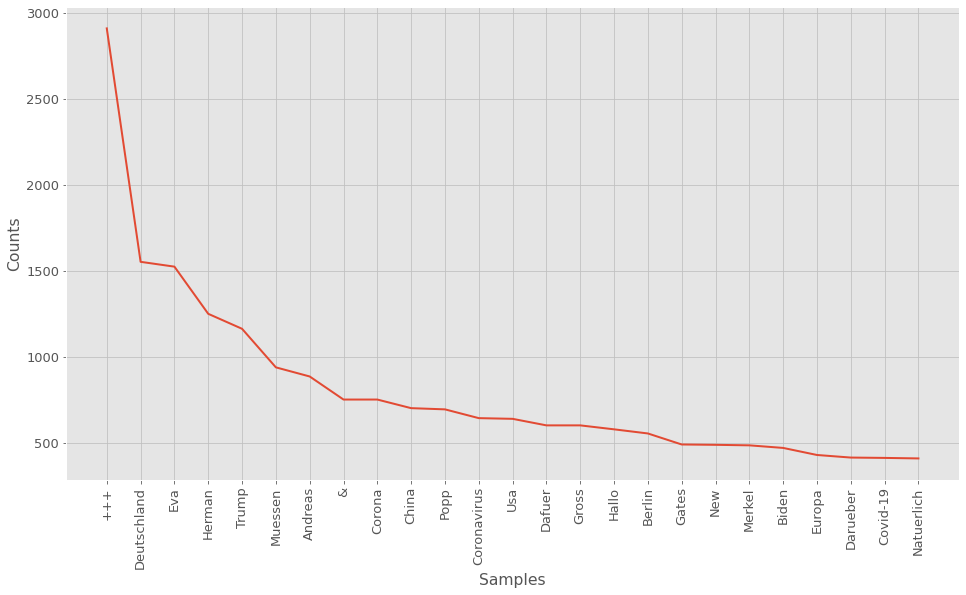

[Stopwatch stopped >>Process data<< (617.541s)]

In [142]:
if(C_SHORT_RUN == False):
    generateFreqNounsPlot("DS-05-01-2021/ChatExport_2021-01-05-evaherman", mostCommon=25, outputFilename = "freq-nouns-eva-herman.svg")

[Stopwatch started >>Generate text<<]

[Stopwatch stopped >>Generate text<< (1.026s)]

[Stopwatch started >>Process data<<]

- Warn: remove stopWords

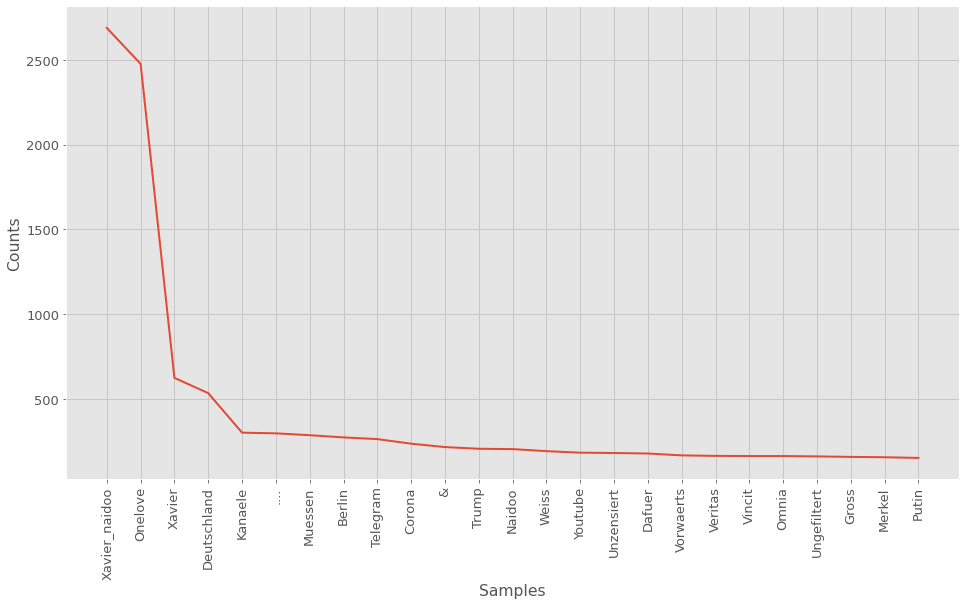

[Stopwatch stopped >>Process data<< (196.736s)]

In [143]:
if(C_SHORT_RUN == False):
    generateFreqNounsPlot("DS-05-01-2021/ChatExport_2021-01-05-xavier", mostCommon=25, outputFilename = "freq-nouns-xavier-naidoo.svg")

### Named-entity recognition

#### Beispiele

In [144]:
sampleText = "Hallo, mein Name ist Maximilian Mustermann und ich lebe in Deutschland in Europa."
sampleText

'Hallo, mein Name ist Maximilian Mustermann und ich lebe in Deutschland in Europa.'

In [145]:
processNerPipeline(sampleText, "ner-bert", 0)

{'per': ['maxim', '##ilian', 'mus', '##ter', '##mann'],
 'misc': [],
 'org': [],
 'loc': ['deutsch', '##land', 'europa']}

In [146]:
processNerPipeline(sampleText, "ner-xlm-roberta", 0)

{'per': ['▁Maxim', 'ili', 'an', '▁Must', 'mann'],
 'misc': [],
 'org': [],
 'loc': ['▁Deutschland', '▁Europa']}

#### Angwendet auf DataSet0

In [147]:
def evalNerPipeline(pipelineKey, inputSelector, configTopN):

    if(inputSelector in C_TRANSFORMERS_DATASETS):
        
        filePaths = dfInputFiles[dfInputFiles.inputLabel == inputSelector].inputPath

        for fP in filePaths:
            
            gloStartStopwatch("Process now >>" + str(fP) + "<<")

            if(pipelineKey == "ftTrNerRoberta" or pipelineKey == "ftTrNerBert"):
                
                df = dictMessages[fP].copy()
                df = df[df.ftQrIsValidText == True]
                
                listPer     = list()
                listMisc    = list()
                listOrg     = list()
                listLoc     = list()

                for index, row in df.iterrows():

                    d = row[pipelineKey]
                    
                    listPer.extend(d["per"])
                    listMisc.extend(d["misc"])
                    listOrg.extend(d["org"])
                    listLoc.extend(d["loc"])

                print("- Top per -")
                print ("\n".join(map(str, Counter(listPer).most_common(configTopN))))
                print()

                print("- Top misc -")
                print ("\n".join(map(str, Counter(listMisc).most_common(configTopN))))
                print()

                print("- Top org -")
                print ("\n".join(map(str, Counter(listOrg).most_common(configTopN))))
                print()

                print("- Top loc -")
                print ("\n".join(map(str, Counter(listLoc).most_common(configTopN))))
                print()

            else:
                print("Error pipeline not found >>" + str(pipelineKey) + "<<")

            gloStopStopwatch("Process now >>" + str(fP) + "<<")

    else:
        print("Error data not found >>" + inputSelector + "<<")

In [148]:
evalNerPipeline("ftTrNerRoberta", "dataSet0", configTopN = 20)

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<<<]

- Top per -

('TTI', 6208)
('LAH', 6131)
('MAN', 6127)
('A', 6062)
('IL', 5935)
('D', 5846)
('N', 5744)
('▁Gates', 1063)
('▁Merkel', 1007)
('▁A', 411)
('▁Trump', 398)
('WO', 387)
('mann', 385)
('LD', 382)
('▁HI', 359)
('h', 354)
('▁Spa', 350)
('n', 336)
('LF', 330)
('TT', 329)

- Top misc -

('-', 2086)
('▁Corona', 845)
('▁DE', 838)
('UT', 717)
('▁deutsche', 649)
('WO', 443)
('S', 433)
('▁Deutschen', 409)
('▁N', 409)
('sche', 383)
('▁deutschen', 378)
('▁Deutsche', 336)
('D', 333)
('▁', 326)
('▁Kommun', 304)
('▁Bol', 283)
('▁BR', 222)
('na', 211)
('ed', 210)
('▁KOMMUN', 210)

- Top org -

('N', 782)
('▁N', 748)
('WO', 737)
('D', 717)
('MAN', 616)
('F', 602)
('rei', 545)
('heit', 545)
('Chat', 534)
('Der', 530)
('-', 469)
('IL', 365)
('▁B', 353)
('igkeit', 330)
('erland', 322)
('▁', 319)
('lumina', 319)
('gerecht', 318)
('ers', 316)
('fu', 314)

- Top loc -

('▁Deutschland', 1455)
('▁DE', 938)
('UT', 917)
('LAND', 860)
('SCH', 807)
('▁China', 518)
('D', 491)
('▁Berlin', 469)
('-', 394)
('▁BR', 376)
('▁BER', 290)
('LIN', 286)
('e', 228)
('G', 207)
('▁', 188)
('S', 186)
('▁USA', 184)
('N', 177)
('en', 174)
('INA', 161)

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<<< (2.714s)]

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-janich<<<<]

- Top per -

('▁Trump', 1842)
('er', 1101)
('▁Merkel', 906)
('e', 788)
('n', 756)
('.', 711)
('▁Bi', 681)
('den', 673)
('s', 623)
('-', 577)
('mann', 567)
('stein', 526)
('h', 499)
('t', 429)
('▁Ep', 423)
('well', 394)
('▁Donald', 383)
('z', 376)
('▁Spa', 367)
('sten', 359)

- Top misc -

('-', 6155)
('▁Corona', 3205)
('▁US', 986)
('er', 681)
('D', 660)
('▁deutsche', 658)
('▁deutschen', 597)
('s', 558)
('en', 515)
('▁', 510)
('▁EU', 505)
('vid', 432)
('e', 415)
('-19', 394)
('▁Co', 377)
('▁Af', 346)
('VID', 346)
('▁Berliner', 329)
('▁CO', 299)
('▁Trump', 294)

- Top org -

('-', 1359)
('D', 1282)
('en', 1213)
('e', 1004)
('s', 814)
('▁Bundes', 668)
('▁', 655)
('▁Af', 635)
('▁Gru', 473)
('C', 459)
('er', 436)
('r', 397)
('F', 381)
('▁@', 374)
('ministeri', 372)
('▁F', 368)
('S', 365)
('i', 357)
('▁EU', 356)
('▁CDU', 348)

- Top loc -

('▁Deutschland', 2430)
('▁Berlin', 1054)
('-', 827)
('en', 825)
('▁USA', 633)
('▁Europa', 541)
('▁China', 481)
('n', 390)
('s', 349)
('▁Frankreich', 322)
('▁#', 301)
('▁O', 287)
('reich', 286)
('land', 277)
('er', 274)
('e', 261)
('ester', 254)
('▁Italien', 225)
('▁Bayern', 210)
('▁Mu', 204)

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-janich<<<< (3.660s)]

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<<<]

- Top per -

('▁Eva', 1485)
('▁Trump', 1176)
('▁Herman', 915)
('▁Andreas', 872)
('▁Bi', 470)
('▁Merkel', 469)
('er', 461)
('den', 429)
('e', 386)
('p', 382)
('▁Pop', 375)
('-', 364)
('▁Gates', 358)
('n', 352)
('s', 341)
('▁Donald', 318)
('stein', 311)
('▁Bill', 285)
('▁Ep', 284)
('h', 269)

- Top misc -

('-', 3440)
('▁Corona', 2674)
('▁US', 899)
('vid', 416)
('e', 414)
('▁Co', 397)
('-19', 390)
('▁', 375)
('▁deutsche', 311)
('s', 311)
('▁deutschen', 304)
('er', 266)
('VID', 252)
('nes', 246)
('▁chi', 244)
('▁CO', 236)
('amerikanische', 217)
('V', 202)
('Co', 186)
('▁S', 182)

- Top org -

('-', 623)
('e', 406)
('s', 379)
('▁&', 369)
('D', 358)
('en', 342)
('p', 337)
('▁Herman', 315)
('▁Pop', 310)
('▁', 302)
('▁WHO', 256)
('▁Bundes', 248)
('er', 200)
('▁BIL', 197)
('S', 190)
('DR', 185)
('ministeri', 182)
('C', 182)
('r', 168)
('a', 153)

- Top loc -

('▁Deutschland', 1403)
('▁China', 589)
('▁USA', 573)
('▁Berlin', 512)
('en', 480)
('▁Europa', 399)
('-', 388)
('see', 258)
('s', 223)
('reich', 209)
('▁O', 202)
('▁Italien', 195)
('ester', 185)
('▁Schweiz', 179)
('land', 178)
('n', 178)
('▁Kanada', 169)
('ber', 154)
('▁W', 153)
('▁Bayern', 152)

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<<< (1.720s)]

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<<<]

- Top per -

('vier', 2721)
('_', 2720)
('ido', 1995)
('o', 1856)
('X', 1798)
('Na', 1784)
('a', 1571)
('xa', 901)
('nai', 898)
('doo', 890)
('▁Xavier', 551)
('▁Na', 234)
('mann', 206)
('▁Trump', 178)
('er', 145)
('A', 138)
('s', 136)
('▁Merkel', 135)
('N', 130)
('MAN', 129)

- Top misc -

('Love', 1215)
('▁One', 578)
('-', 539)
('one', 490)
('▁Corona', 401)
('s', 137)
('▁', 113)
('▁deutschen', 104)
('▁Ver', 103)
('er', 101)
('▁Deutschen', 98)
('▁Jude', 94)
('▁deutsche', 92)
('▁US', 83)
('▁Deutsche', 80)
('en', 78)
('vid', 70)
('▁russische', 64)
('▁Co', 64)
('amerikanische', 63)

- Top org -

('_', 606)
('u', 328)
('de', 315)
('tsch', 298)
('gruppe', 280)
('▁@', 275)
('ig', 275)
('Wer', 274)
('spr', 271)
('ach', 271)
('be', 250)
('s', 210)
('Ge', 191)
('iten', 191)
('es', 187)
('heim', 182)
('El', 173)
('wis', 170)
('sender', 166)
('e', 156)

- Top loc -

('▁Deutschland', 446)
('▁Berlin', 222)
('-', 112)
('D', 101)
('▁USA', 97)
('en', 94)
('▁Russland', 82)
('▁BR', 80)
('▁Reich', 80)
('▁Israel', 79)
('heim', 69)
('n', 69)
('s', 65)
('e', 65)
('er', 64)
('▁Europa', 59)
('▁Mann', 49)
('▁China', 49)
('▁A', 45)
('reich', 44)

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<<< (1.101s)]

In [149]:
evalNerPipeline("ftTrNerBert", "dataSet0", configTopN = 20)

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<<<]

- Top per -

('##d', 5375)
('##hil', 4756)
('att', 4409)
('##ila', 3966)
('@', 2726)
('merk', 1327)
('ga', 1131)
('hil', 673)
('##mann', 530)
('##tes', 463)
('##lf', 395)
('bill', 375)
('sp', 358)
('##el', 348)
('rot', 318)
('tr', 313)
('cor', 285)
('##hs', 274)
('wo', 267)
('ma', 226)

- Top misc -

- Top org -

('##d', 931)
('@', 721)
('nw', 685)
('att', 526)
('##ila', 436)
('##o', 415)
('##hil', 414)
('wo', 397)
('br', 387)
('##lf', 377)
('##mann', 336)
('bundes', 317)
('tel', 289)
('ch', 283)
('na', 280)
('##tu', 271)
('##at', 265)
('cor', 247)
('you', 247)
('##be', 215)

- Top loc -

('deutsch', 2202)
('##land', 1033)
('ber', 816)
('ch', 714)
('##lin', 639)
('##ina', 423)
('##ien', 243)
('kor', 209)
('japan', 188)
('usa', 185)
('europa', 176)
('israel', 170)
('amer', 169)
('##en', 158)
('##n', 150)
('##ika', 150)
('bayer', 145)
('##nk', 142)
('fra', 140)
('lei', 137)

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<<< (2.762s)]

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-janich<<<<]

- Top per -

('tr', 1533)
('.', 946)
('##ump', 936)
('merk', 892)
('jo', 839)
('ma', 813)
('##a', 677)
('bi', 645)
('ja', 612)
('##y', 546)
('##e', 532)
('ro', 517)
('mar', 502)
('sch', 477)
('bo', 472)
('ha', 456)
('##l', 444)
('ga', 442)
('j', 425)
('th', 415)

- Top misc -

- Top org -

('##d', 1375)
('bundes', 1238)
('sp', 766)
('c', 669)
('af', 644)
('-', 636)
('##tu', 632)
('##s', 626)
('you', 556)
('##du', 509)
('##be', 496)
('tw', 493)
('fac', 462)
('##itter', 439)
('f', 437)
('eu', 423)
('un', 359)
('##tag', 344)
('##ebook', 341)
('new', 340)

- Top loc -

('deutsch', 2388)
('##land', 1771)
('ber', 1220)
('##lin', 899)
('usa', 593)
('##en', 579)
('fra', 533)
('##nk', 520)
('europa', 511)
('##ien', 507)
('ch', 494)
('ha', 373)
('-', 318)
('##reich', 308)
('##n', 297)
('##ina', 295)
('oe', 250)
('##ika', 242)
('##sterreich', 232)
('##mb', 232)

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-janich<<<< (3.689s)]

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<<<]

- Top per -

('ev', 1371)
('her', 1066)
('tr', 978)
('and', 873)
('##rea', 756)
('##man', 740)
('##s', 719)
('##ump', 680)
('##a', 639)
('jo', 448)
('bi', 440)
('po', 414)
('merk', 388)
('ma', 375)
('##e', 338)
('ga', 332)
('##y', 312)
('christ', 303)
('##ald', 303)
('don', 302)

- Top misc -

- Top org -

('bundes', 450)
('##d', 321)
('-', 312)
('sp', 281)
('##s', 281)
('&', 277)
('po', 275)
('her', 237)
('ad', 214)
('who', 201)
('c', 197)
('##tu', 196)
('##pp', 187)
('tw', 183)
('##man', 182)
('new', 179)
('eu', 177)
('inst', 157)
('##tag', 156)
('##itter', 156)

- Top loc -

('deutsch', 1293)
('##land', 995)
('ber', 519)
('ch', 512)
('usa', 498)
('##lin', 371)
('europa', 356)
('##en', 320)
('##ien', 308)
('##ina', 292)
('##a', 217)
('fra', 194)
('##nk', 193)
('w', 176)
('##z', 175)
('schwei', 173)
('oe', 172)
('erd', 168)
('ha', 163)
('italien', 162)

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<<< (1.735s)]

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<<<]

- Top per -

('na', 1733)
('x', 1199)
('##av', 1009)
('##ido', 851)
('one', 759)
('##ier', 380)
('##o', 334)
('_', 301)
('##lo', 255)
('je', 230)
('##d', 204)
('##s', 193)
('att', 182)
('p', 161)
('##ve', 161)
('##ila', 160)
('@', 151)
('merk', 145)
('tr', 143)
('##su', 131)

- Top misc -

- Top org -

('##tu', 193)
('you', 173)
('##be', 155)
('##d', 138)
('@', 125)
('tel', 118)
('br', 89)
('bundes', 81)
('sp', 70)
('na', 67)
('##s', 66)
('cor', 55)
('w', 54)
('##am', 53)
('##egr', 52)
('-', 52)
('one', 50)
('fac', 50)
('tw', 47)
('q', 47)

- Top loc -

('deutsch', 378)
('##land', 265)
('ber', 255)
('erd', 181)
('##lin', 171)
('israel', 98)
('usa', 98)
('russ', 85)
('##ien', 79)
('##en', 62)
('ch', 58)
('man', 55)
('europa', 51)
('ha', 49)
('##nh', 48)
('##n', 45)
('ma', 44)
('st', 43)
('##nk', 42)
('fra', 41)

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<<< (1.061s)]

### Sentiment analysis

#### TextBlob

##### Beispiele

In [150]:
print(str(processSentimentAnalysisPython("Heute ist ein toller Tag. Ich freue mich hier zu sein!")))

{'polarity': 0.5, 'subjectivity': 0.0}

In [151]:
print(str(processSentimentAnalysisPython("Heute war ein furchtbarer Tag. Ich hasse alles.")))

{'polarity': -0.5, 'subjectivity': 0.0}

##### DataSet0

Implementierung für beiden

In [152]:
def evalSenPipeline(pipelineKey, inputSelector, outputFilename, configRolling, configShowScatter):

    if(inputSelector in C_TRANSFORMERS_DATASETS):
        
        filePaths = dfInputFiles[dfInputFiles.inputLabel == inputSelector].inputPath

        plt.figure(figsize=(16, 9))

        for fP in filePaths:
            
            gloStartStopwatch("Process now >>" + str(fP) + "<<")

            if(pipelineKey == "sen-bert"):
                
                df = dictMessages[fP].copy()
                df = df[df.ftQrIsValidText == True]

                df["date"] = pd.to_datetime(df["date"])
                df = df.set_index("date")
                df = df.sort_index()

                # key = x = time / value = y = score
                dictData = {}

                for index, row in df.iterrows():
                    
                    date = index
                    score = row["ftTrSenBert"]

                    if(score != -1):
                        dictData[date] = score

                # Plot
                x,y = zip(*sorted(dictData.items()))
                
                df = pd.DataFrame(list(zip(x, y)), columns =['x', 'y'])

                df['rolling'] = df.y.rolling(configRolling).mean()

                sns.lineplot(data=df, x="x", y="rolling", label = queryChatName(fP))

                if(configShowScatter):
                    sns.scatterplot(data=df, x="x", y="y", label = queryChatName(fP), marker="+")

                plt.gcf().autofmt_xdate()

                # Add vlines
                vLineMin = 2
                vLineMax = 4

            elif(pipelineKey=="sentiment"):

                df = dictMessages[fP].copy()
                df = df[df.ftQrIsValidText == True]

                df["date"] = pd.to_datetime(df["date"])
                df = df.set_index("date")
                df = df.sort_index()

                # key = x = time / value = y = score
                dictData = {}

                for index, row in df.iterrows():
                    
                    date = index
                    retDict = row["ftSenTb"]

                    if(retDict != None):
                        polarity = retDict["polarity"]
                        dictData[date] = polarity

                # Plot
                x,y = zip(*sorted(dictData.items()))

                df = pd.DataFrame(list(zip(x, y)), columns =['x', 'y'])

                df['rolling'] = df.y.rolling(configRolling).mean()

                sns.lineplot(data=df, x="x", y="rolling", label = queryChatName(fP))

                if(configShowScatter):
                    sns.scatterplot(data=df, x="x", y="y", label = queryChatName(fP), marker="+")

                plt.gcf().autofmt_xdate()

                # Add vlines
                vLineMin = -0.05
                vLineMax = 0.175

            elif(pipelineKey=="subjectivity"):

                df = dictMessages[fP].copy()
                df = df[df.ftQrIsValidText == True]

                df["date"] = pd.to_datetime(df["date"])
                df = df.set_index("date")
                df = df.sort_index()

                # key = x = time / value = y = score
                dictData = {}

                for index, row in df.iterrows():
                    
                    date = index
                    retDict = row["ftSenTb"]

                    if(retDict != None):

                        subjectivity = retDict["subjectivity"]
                        dictData[date] = subjectivity

                # Plot
                x,y = zip(*sorted(dictData.items()))

                df = pd.DataFrame(list(zip(x, y)), columns =['x', 'y'])

                df['rolling'] = df.y.rolling(configRolling).mean()

                sns.lineplot(data=df, x="x", y="rolling", label = queryChatName(fP))

                if(configShowScatter):
                    sns.scatterplot(data=df, x="x", y="y", label = queryChatName(fP), marker="+")

                plt.gcf().autofmt_xdate()

                # Add vlines
                vLineMin = 0
                vLineMax = 0.10
                
            else:
                print("Error pipeline not found >>" + str(pipelineKey) + "<<")

            gloStopStopwatch("Process now >>" + str(fP) + "<<")

        # yy - mm - dd
        # TODO: Double check https://www.bundesgesundheitsministerium.de/coronavirus/chronik-coronavirus.html?stand=20210104
        plt.vlines(x = ["2018-12-10"], ymin=vLineMin, ymax=vLineMax, color="orange", ls='--', label="Global Compact for Migration (2018-12-10)")
        plt.vlines(x = ["2020-01-27"], ymin=vLineMin, ymax=vLineMax, color="grey", ls='--', label="Corona Patient Zero Germany")
        plt.vlines(x = ["2020-03-23"], ymin=vLineMin, ymax=vLineMax, color="purple", ls='--', label="1. Lockdown Germany (2020-03-23)")
        plt.vlines(x = ["2020-11-02"], ymin=vLineMin, ymax=vLineMax, color="purple", ls='--', label="2. Lockdown light Germany (2020-11-02)")
        plt.vlines(x = ["2020-12-16"], ymin=vLineMin, ymax=vLineMax, color="purple", ls='--', label="3. Lockdown Germany (2020-12-16)")

        _ = plt.legend()

        if(outputFilename != ""):
            plt.savefig(dir_var_output + outputFilename)

    else:
        print("Error data not found >>" + inputSelector + "<<")

Polarity

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<<<]

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<<< (3.987s)]

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-janich<<<<]

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-janich<<<< (5.291s)]

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<<<]

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<<< (2.469s)]

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<<<]

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<<< (1.625s)]

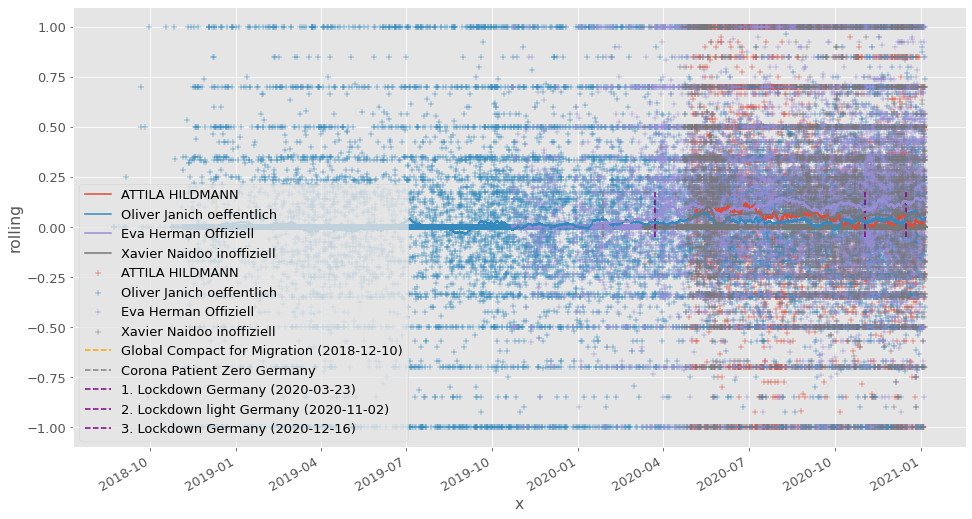

In [153]:
evalSenPipeline("sentiment", "dataSet0", outputFilename = "", configRolling = 600, configShowScatter = True)

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<<<]

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<<< (3.965s)]

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-janich<<<<]

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-janich<<<< (5.209s)]

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<<<]

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<<< (2.441s)]

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<<<]

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<<< (1.558s)]

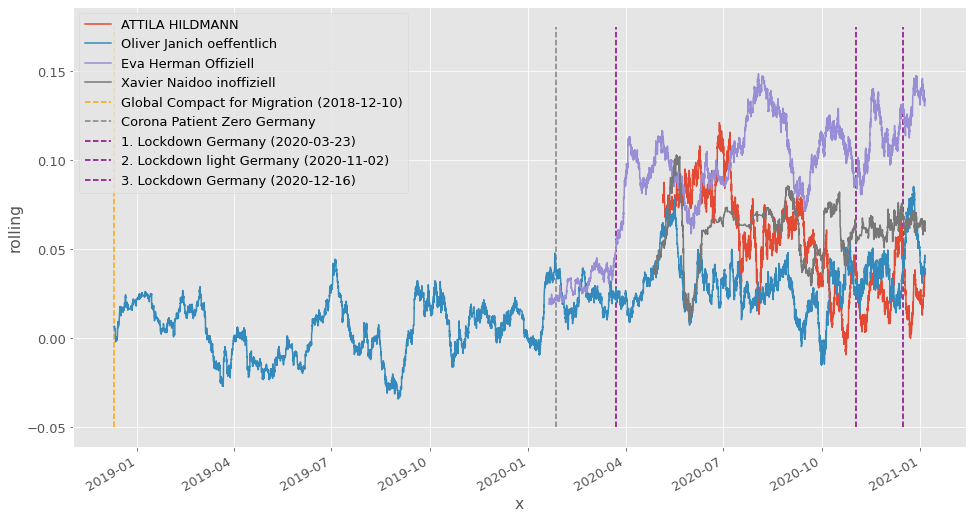

In [154]:
evalSenPipeline("sentiment", "dataSet0", outputFilename = "eval-pipeline-sen-textblob-dataSet0.svg", configRolling = 600, configShowScatter = False)

Subjectivity

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<<<]

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<<< (4.034s)]

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-janich<<<<]

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-janich<<<< (8.817s)]

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<<<]

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<<< (2.519s)]

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<<<]

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<<< (1.505s)]

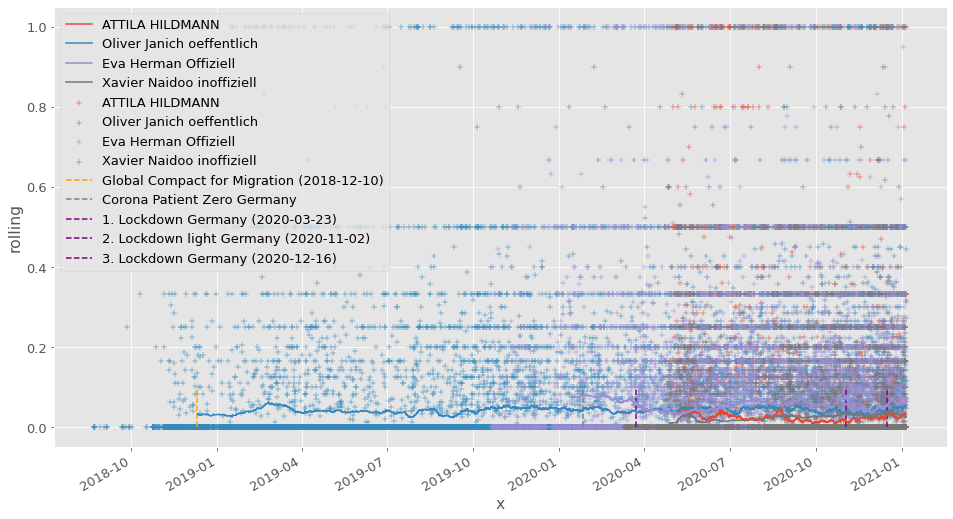

In [155]:
evalSenPipeline("subjectivity", "dataSet0", outputFilename = "", configRolling = 600, configShowScatter = True)

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<<<]

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<<< (3.877s)]

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-janich<<<<]

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-janich<<<< (5.121s)]

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<<<]

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<<< (2.379s)]

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<<<]

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<<< (1.479s)]

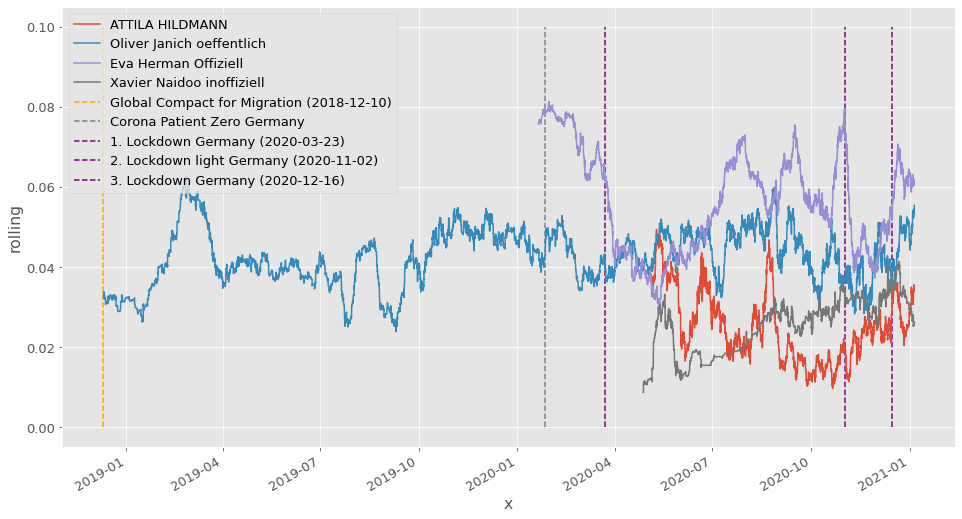

In [156]:
evalSenPipeline("subjectivity", "dataSet0", outputFilename = "eval-pipeline-subjectivity-dataSet0.svg", configRolling = 600, configShowScatter = False)

#### Transformers

##### Beispiele

In [157]:
processSenPipeline("Das ist toll. Ich würde es mir wieder kaufen!", "sen-bert", 0)

5

In [158]:
processSenPipeline("Das ist toll. Ich würde es aber nicht mehr kaufen!", "sen-bert", 0)

3

In [159]:
processSenPipeline("Das funktioniert nicht.", "sen-bert", 0)

1

##### DataSet0

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<<<]

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<<< (3.878s)]

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-janich<<<<]

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-janich<<<< (5.086s)]

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<<<]

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<<< (2.415s)]

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<<<]

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<<< (1.541s)]

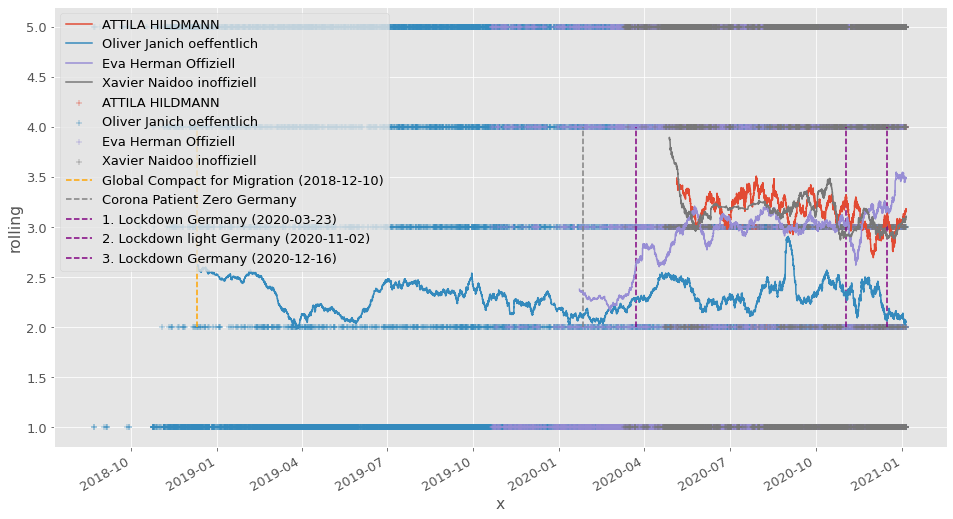

In [160]:
evalSenPipeline("sen-bert", "dataSet0", outputFilename = "", configRolling = 600, configShowScatter = True)

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<<<]

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<<< (3.850s)]

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-janich<<<<]

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-janich<<<< (5.052s)]

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<<<]

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<<< (2.350s)]

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<<<]

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<<< (1.484s)]

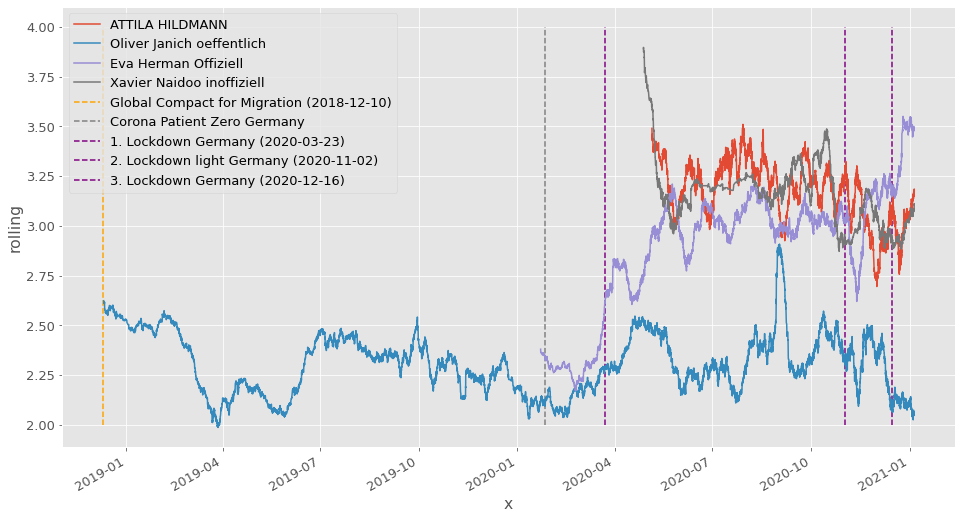

In [161]:
evalSenPipeline("sen-bert", "dataSet0", outputFilename = "eval-pipeline-sen-dataSet0.svg", configRolling = 600, configShowScatter = False)

### Latent Dirichlet Allocation (LDA)

Inspiriert von: https://towardsdatascience.com/end-to-end-topic-modeling-in-python-latent-dirichlet-allocation-lda-35ce4ed6b3e0

Übersicht Topic Models Ansätze Python: https://nlpforhackers.io/topic-modeling/

- LDA (Probabilistic Graphical Models)
- LSA or LSI (Linear Algebra Singular Value Decomposition)
- NMF (Linear Algebra Non-Negative Matrix Factorization)

#### Aufbereitung

##### Text Aufbereitung

In [162]:
sampleList = ["Studenten sind faul", "und Studenten essen gerne Eis"]
sampleList

['Studenten sind faul', 'und Studenten essen gerne Eis']

In [163]:
def gensimPreprocess(sentences):
    for sentence in sentences:
        # deacc= removes punctuations
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))
        
sampleList = list(gensimPreprocess(sampleList))
sampleList

[['studenten', 'sind', 'faul'], ['und', 'studenten', 'essen', 'gerne', 'eis']]

In [164]:
def gensimRemoveStopwords(inputList, stop_words):
    return [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in inputList]

sampleList = gensimRemoveStopwords(inputList = sampleList, stop_words=gloGetStopWordsList(filterList = []))
sampleList

[['studenten', 'faul'], ['studenten', 'essen', 'gerne', 'eis']]

##### LDA Aufbereitung

In [165]:
def ldaGetDictionary(inputList):
    return corpora.Dictionary(inputList)

sampleDictonary = ldaGetDictionary(sampleList)

In [166]:
sampleDictonary.num_docs

2

In [167]:
sampleDictonary.num_pos

6

In [168]:
sampleDictonary.token2id

{'faul': 0, 'studenten': 1, 'eis': 2, 'essen': 3, 'gerne': 4}

In [169]:
def ldaGetBOW(dictonary, inputList):
    return [dictonary.doc2bow(text) for text in inputList]

ldaGetBOW(sampleDictonary, sampleList)

[[(0, 1), (1, 1)], [(1, 1), (2, 1), (3, 1), (4, 1)]]

#### Modellierung und Visualisierung

Return

- ``lda_model``
- ``corpus``
- ``id2word``

In [170]:
def processLda(df, num_topics, debugPrint, stopWords):

    df = df.copy()

    df = df[df.ftQrIsValidText == True]

    df = df[["date", "ftTdSafeLowerText"]]

    df = df.set_index("date")
    df = df.sort_index()

    inputList = df.ftTdSafeLowerText.values.tolist()

    inputList = list(gensimPreprocess(inputList))
    inputList  = gensimRemoveStopwords(inputList, stopWords)

    dictionary = ldaGetDictionary(inputList)

    # Term Document Frequency (dict to bag of words)
    corpus = ldaGetBOW(dictionary, inputList)

    # Build LDA model
    lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                       id2word=dictionary,
                                       num_topics=num_topics)

    if(debugPrint):
        pprint(lda_model.print_topics())
        #doc_lda = lda_model[corpus] # TODO: ?

    return (lda_model, corpus, dictionary)

Lda zu Html

In [171]:
def ldaToHtml(lda_model, corpus, id2word, outputLabel):

    LDAvis_prepared = pyLDAvis.gensim.prepare(lda_model, corpus, id2word)

    pyLDAvis.save_html(LDAvis_prepared, dir_var_output + 'pyLDAvis/' + outputLabel + '-report.html')

Wrapper

In [172]:
# param outputLabel required
def autoLda(df, debugPrint, outputLabel, filterList, listNumberTopics):

    for iTopics in listNumberTopics:

        iLabel = outputLabel + "-t-" + str(iTopics)

        gloStartStopwatch("Process LDA (" + str(iTopics) + " topics) >> "+ iLabel + "<<")
              
        try:
            
            lda_model, corpus, id2word = processLda(
                    df = df,
                    num_topics = iTopics,
                    debugPrint = debugPrint,
                    stopWords = gloGetStopWordsList(filterList)
                )

            ldaToHtml(
                    lda_model = lda_model,
                    corpus = corpus,
                    id2word = id2word,
                    outputLabel = iLabel
                )

        except:
            print("Error in process lda")

        gloStopStopwatch("Process LDA (" + str(iTopics) + " topics) >> "+ iLabel + "<<")

##### LDA auf DataSet0

In [173]:
if(C_SHORT_RUN == False):
    autoLda(
        df = dictMessages["DS-05-01-2021/ChatExport_2021-01-05-janich"],
        debugPrint = False,
        outputLabel = "oliver-janich",
        filterList = [],
        listNumberTopics = [2,4,8,16]
    )

[Stopwatch started >>Process LDA (2 topics) >> oliver-janich-t-2<<<<]

Error in process lda

[Stopwatch stopped >>Process LDA (2 topics) >> oliver-janich-t-2<<<< (19.852s)]

[Stopwatch started >>Process LDA (4 topics) >> oliver-janich-t-4<<<<]

Error in process lda

[Stopwatch stopped >>Process LDA (4 topics) >> oliver-janich-t-4<<<< (19.760s)]

[Stopwatch started >>Process LDA (8 topics) >> oliver-janich-t-8<<<<]

Error in process lda

[Stopwatch stopped >>Process LDA (8 topics) >> oliver-janich-t-8<<<< (19.706s)]

[Stopwatch started >>Process LDA (16 topics) >> oliver-janich-t-16<<<<]

Error in process lda

[Stopwatch stopped >>Process LDA (16 topics) >> oliver-janich-t-16<<<< (20.066s)]

In [174]:
if(C_SHORT_RUN == False):
    autoLda(
        df = dictMessages["DS-05-01-2021/ChatExport_2021-01-05-hildmann"],
        debugPrint = False,
        outputLabel = "attila-hildmann",
        filterList = [],
        listNumberTopics = [2,4,8,16]
    )

[Stopwatch started >>Process LDA (2 topics) >> attila-hildmann-t-2<<<<]

Error in process lda

[Stopwatch stopped >>Process LDA (2 topics) >> attila-hildmann-t-2<<<< (10.688s)]

[Stopwatch started >>Process LDA (4 topics) >> attila-hildmann-t-4<<<<]

Error in process lda

[Stopwatch stopped >>Process LDA (4 topics) >> attila-hildmann-t-4<<<< (10.273s)]

[Stopwatch started >>Process LDA (8 topics) >> attila-hildmann-t-8<<<<]

Error in process lda

[Stopwatch stopped >>Process LDA (8 topics) >> attila-hildmann-t-8<<<< (9.999s)]

[Stopwatch started >>Process LDA (16 topics) >> attila-hildmann-t-16<<<<]

Error in process lda

[Stopwatch stopped >>Process LDA (16 topics) >> attila-hildmann-t-16<<<< (9.958s)]

In [175]:
if(C_SHORT_RUN == False):
    autoLda(
        df = dictMessages["DS-05-01-2021/ChatExport_2021-01-05-evaherman"],
        debugPrint = False,
        outputLabel = "eva-herman",
        filterList = [],
        listNumberTopics = [2,4,8,16]
    )

[Stopwatch started >>Process LDA (2 topics) >> eva-herman-t-2<<<<]

Error in process lda

[Stopwatch stopped >>Process LDA (2 topics) >> eva-herman-t-2<<<< (12.192s)]

[Stopwatch started >>Process LDA (4 topics) >> eva-herman-t-4<<<<]

Error in process lda

[Stopwatch stopped >>Process LDA (4 topics) >> eva-herman-t-4<<<< (12.293s)]

[Stopwatch started >>Process LDA (8 topics) >> eva-herman-t-8<<<<]

Error in process lda

[Stopwatch stopped >>Process LDA (8 topics) >> eva-herman-t-8<<<< (12.493s)]

[Stopwatch started >>Process LDA (16 topics) >> eva-herman-t-16<<<<]

Error in process lda

[Stopwatch stopped >>Process LDA (16 topics) >> eva-herman-t-16<<<< (12.629s)]

In [176]:
if(C_SHORT_RUN == False):
    autoLda(
        df = dictMessages["DS-05-01-2021/ChatExport_2021-01-05-xavier"],
        debugPrint = False,
        outputLabel = "xavier-naidoo",
        filterList = [],
        listNumberTopics = [2,4,8,16]
    )

[Stopwatch started >>Process LDA (2 topics) >> xavier-naidoo-t-2<<<<]

Error in process lda

[Stopwatch stopped >>Process LDA (2 topics) >> xavier-naidoo-t-2<<<< (6.308s)]

[Stopwatch started >>Process LDA (4 topics) >> xavier-naidoo-t-4<<<<]

Error in process lda

[Stopwatch stopped >>Process LDA (4 topics) >> xavier-naidoo-t-4<<<< (5.955s)]

[Stopwatch started >>Process LDA (8 topics) >> xavier-naidoo-t-8<<<<]

Error in process lda

[Stopwatch stopped >>Process LDA (8 topics) >> xavier-naidoo-t-8<<<< (5.879s)]

[Stopwatch started >>Process LDA (16 topics) >> xavier-naidoo-t-16<<<<]

Error in process lda

[Stopwatch stopped >>Process LDA (16 topics) >> xavier-naidoo-t-16<<<< (5.829s)]

##### LDA auf DataSet1a

In [177]:
if(C_SHORT_RUN == False):
    if("dataSet1a" in C_LOAD_DATASETS):
        autoLda(
            df = dictMessages["DS-05-01-2021a/ChatExport_2021-01-05-freiheitsChat"],
            debugPrint = False,
            outputLabel = "group-freiheitsChat",
            filterList = [],
            listNumberTopics = [2,4,8,16,32]
        )

[Stopwatch started >>Process LDA (2 topics) >> group-freiheitsChat-t-2<<<<]

Error in process lda

[Stopwatch stopped >>Process LDA (2 topics) >> group-freiheitsChat-t-2<<<< (89.898s)]

[Stopwatch started >>Process LDA (4 topics) >> group-freiheitsChat-t-4<<<<]

Error in process lda

[Stopwatch stopped >>Process LDA (4 topics) >> group-freiheitsChat-t-4<<<< (87.941s)]

[Stopwatch started >>Process LDA (8 topics) >> group-freiheitsChat-t-8<<<<]

Error in process lda

[Stopwatch stopped >>Process LDA (8 topics) >> group-freiheitsChat-t-8<<<< (93.529s)]

[Stopwatch started >>Process LDA (16 topics) >> group-freiheitsChat-t-16<<<<]

Error in process lda

[Stopwatch stopped >>Process LDA (16 topics) >> group-freiheitsChat-t-16<<<< (93.705s)]

[Stopwatch started >>Process LDA (32 topics) >> group-freiheitsChat-t-32<<<<]

Error in process lda

[Stopwatch stopped >>Process LDA (32 topics) >> group-freiheitsChat-t-32<<<< (102.889s)]

In [178]:
if(C_SHORT_RUN == False):
    if("dataSet1a" in C_LOAD_DATASETS):
        autoLda(
            df = dictMessages["DS-05-01-2021a/ChatExport_2021-01-05-freiheitsChatBlitz"],
            debugPrint = False,
            outputLabel = "group-freiheitsChatBlitz",
            filterList = [],
            listNumberTopics = [2,4,8,16,32]
        )

[Stopwatch started >>Process LDA (2 topics) >> group-freiheitsChatBlitz-t-2<<<<]

Error in process lda

[Stopwatch stopped >>Process LDA (2 topics) >> group-freiheitsChatBlitz-t-2<<<< (33.242s)]

[Stopwatch started >>Process LDA (4 topics) >> group-freiheitsChatBlitz-t-4<<<<]

Error in process lda

[Stopwatch stopped >>Process LDA (4 topics) >> group-freiheitsChatBlitz-t-4<<<< (31.732s)]

[Stopwatch started >>Process LDA (8 topics) >> group-freiheitsChatBlitz-t-8<<<<]

Error in process lda

[Stopwatch stopped >>Process LDA (8 topics) >> group-freiheitsChatBlitz-t-8<<<< (30.874s)]

[Stopwatch started >>Process LDA (16 topics) >> group-freiheitsChatBlitz-t-16<<<<]

Error in process lda

[Stopwatch stopped >>Process LDA (16 topics) >> group-freiheitsChatBlitz-t-16<<<< (30.946s)]

[Stopwatch started >>Process LDA (32 topics) >> group-freiheitsChatBlitz-t-32<<<<]

Error in process lda

[Stopwatch stopped >>Process LDA (32 topics) >> group-freiheitsChatBlitz-t-32<<<< (31.569s)]

In [179]:
if(C_SHORT_RUN == False):
    if("dataSet1a" in C_LOAD_DATASETS):
        autoLda(
            df = dictMessages["DS-05-01-2021a/ChatExport_2021-01-05-liveFuerDeOsSc"],
            debugPrint = False,
            outputLabel = "group-liveFuerDeOsSc",
            filterList = [],
            listNumberTopics = [2,4,8,16,32]
        )

[Stopwatch started >>Process LDA (2 topics) >> group-liveFuerDeOsSc-t-2<<<<]

Error in process lda

[Stopwatch stopped >>Process LDA (2 topics) >> group-liveFuerDeOsSc-t-2<<<< (2.903s)]

[Stopwatch started >>Process LDA (4 topics) >> group-liveFuerDeOsSc-t-4<<<<]

Error in process lda

[Stopwatch stopped >>Process LDA (4 topics) >> group-liveFuerDeOsSc-t-4<<<< (2.628s)]

[Stopwatch started >>Process LDA (8 topics) >> group-liveFuerDeOsSc-t-8<<<<]

Error in process lda

[Stopwatch stopped >>Process LDA (8 topics) >> group-liveFuerDeOsSc-t-8<<<< (2.443s)]

[Stopwatch started >>Process LDA (16 topics) >> group-liveFuerDeOsSc-t-16<<<<]

Error in process lda

[Stopwatch stopped >>Process LDA (16 topics) >> group-liveFuerDeOsSc-t-16<<<< (2.381s)]

[Stopwatch started >>Process LDA (32 topics) >> group-liveFuerDeOsSc-t-32<<<<]

Error in process lda

[Stopwatch stopped >>Process LDA (32 topics) >> group-liveFuerDeOsSc-t-32<<<< (2.386s)]

### Ausblick Textgenerierung

Globale Stopuhr beenden

In [180]:
gloStopStopwatch("Global notebook")

[Stopwatch stopped >>Global notebook<< (48907.013s)]

Bsp Text

In [181]:
sampleText = "Hallo, mein Name ist Max und ich esse gerne Eis. Ich schreibe gerade an meiner Masterarbeit und teste neue Verfahren. Ich komme aus dem Großraum München und bin Informatiker."
sampleText

'Hallo, mein Name ist Max und ich esse gerne Eis. Ich schreibe gerade an meiner Masterarbeit und teste neue Verfahren. Ich komme aus dem Großraum München und bin Informatiker.'

In [182]:
def processTextGenPipeline(inputText, pipelineKey, cMaxLength):
    if(pipelineKey in pipelineKeys):
        return dictPipelines[pipelineKey](inputText, max_length=cMaxLength)

##### gpt2

In [183]:
processTextGenPipeline(sampleText, "text-gen-gpt2", cMaxLength = 100)

Setting `pad_token_id` to `eos_token_id`:52000 for open-end generation.


[{'generated_text': 'Hallo, mein Name ist Max und ich esse gerne Eis. Ich schreibe gerade an meiner Masterarbeit und teste neue Verfahren. Ich komme aus dem Großraum München und bin Informatiker.\nIch bin ein begeisterter Fan von Videospielen und habe an diversen Musikprojekten mitgearbeitet.\nIch spiele auch gerne auf der Nintendo Trading Page.\nMit meiner Freundin und Ihrem Freund, habe ich eine sehr gute Ausbildung im Bereich Audio und Video.\nMeine Schwerpunkte sind Musik, Webdesign und Multimedia.\nWenn'}]

##### gpt2-faust

In [184]:
processTextGenPipeline(sampleText, "text-gen-gpt2-faust", cMaxLength = 100)

Setting `pad_token_id` to `eos_token_id`:52000 for open-end generation.


[{'generated_text': 'Hallo, mein Name ist Max und ich esse gerne Eis. Ich schreibe gerade an meiner Masterarbeit und teste neue Verfahren. Ich komme aus dem Großraum München und bin Informatiker. Kann mich das durchlesen? Es war ein Traum, der ich nicht geträumt. Du hast in meinem Leben viel Erfahrung gesammelt, Und doch habe ich keine Sorgen. Doch, dachte ich, schaffe ich im Ernst noch Raum für mich. Es war ein guter Freund, dem es gedeihen soll; Er hat einen guten Magen,'}]

## Mehr lesen / Inspirationen

- https://towardsai.net/p/data-mining/text-mining-in-python-steps-and-examples-78b3f8fd913b
- https://towardsdatascience.com/text-mining-for-dummies-text-classification-with-python-98e47c3a9deb
- https://www.analyticsvidhya.com/blog/2018/02/the-different-methods-deal-text-data-predictive-python/
- https://realpython.com/python-keras-text-classification/
- https://www.tidytextmining.com/ngrams.html
- http://seaborn.pydata.org/tutorial/categorical.html?highlight=bar%20plot
- https://towardsdatascience.com/visualizing-data-with-pair-plots-in-python-f228cf529166
- https://www.kirenz.com/post/2019-08-13-network_analysis/
- https://tgstat.com
- https://huggingface.co/bert-base-german-cased
- https://github.com/sekhansen/text-mining-tutorial/tree/master
- https://www.machinelearningplus.com/nlp/topic-modeling-gensim-python/
- https://towardsdatascience.com/end-to-end-topic-modeling-in-python-latent-dirichlet-allocation-lda-35ce4ed6b3e0
- https://github.com/sekhansen/text-mining-tutorial/blob/master/tutorial_notebook.ipynb
- https://textmining.wp.hs-hannover.de/Preprocessing.html
- https://likegeeks.com/nlp-tutorial-using-python-nltk/
- https://www.datacamp.com/community/tutorials/text-analytics-beginners-nltk
- https://data-flair.training/blogs/nltk-python-tutorial/
- https://github.com/expectocode/telegram-analysis